# DonorsChoose

<p>
DonorsChoose.org receives hundreds of thousands of project proposals each year for classroom projects in need of funding. Right now, a large number of volunteers is needed to manually screen each submission before it's approved to be posted on the DonorsChoose.org website.
</p>
<p>
    Next year, DonorsChoose.org expects to receive close to 500,000 project proposals. As a result, there are three main problems they need to solve:
<ul>
<li>
    How to scale current manual processes and resources to screen 500,000 projects so that they can be posted as quickly and as efficiently as possible</li>
    <li>How to increase the consistency of project vetting across different volunteers to improve the experience for teachers</li>
    <li>How to focus volunteer time on the applications that need the most assistance</li>
    </ul>
</p>    
<p>
The goal of the competition is to predict whether or not a DonorsChoose.org project proposal submitted by a teacher will be approved, using the text of project descriptions as well as additional metadata about the project, teacher, and school. DonorsChoose.org can then use this information to identify projects most likely to need further review before approval.
</p>

## About the DonorsChoose Data Set

The `train.csv` data set provided by DonorsChoose contains the following features:

Feature | Description 
----------|---------------
**`project_id`** | A unique identifier for the proposed project. **Example:** `p036502`   
**`project_title`**    | Title of the project. **Examples:**<br><ul><li><code>Art Will Make You Happy!</code></li><li><code>First Grade Fun</code></li></ul> 
**`project_grade_category`** | Grade level of students for which the project is targeted. One of the following enumerated values: <br/><ul><li><code>Grades PreK-2</code></li><li><code>Grades 3-5</code></li><li><code>Grades 6-8</code></li><li><code>Grades 9-12</code></li></ul>  
 **`project_subject_categories`** | One or more (comma-separated) subject categories for the project from the following enumerated list of values:  <br/><ul><li><code>Applied Learning</code></li><li><code>Care &amp; Hunger</code></li><li><code>Health &amp; Sports</code></li><li><code>History &amp; Civics</code></li><li><code>Literacy &amp; Language</code></li><li><code>Math &amp; Science</code></li><li><code>Music &amp; The Arts</code></li><li><code>Special Needs</code></li><li><code>Warmth</code></li></ul><br/> **Examples:** <br/><ul><li><code>Music &amp; The Arts</code></li><li><code>Literacy &amp; Language, Math &amp; Science</code></li>  
  **`school_state`** | State where school is located ([Two-letter U.S. postal code](https://en.wikipedia.org/wiki/List_of_U.S._state_abbreviations#Postal_codes)). **Example:** `WY`
**`project_subject_subcategories`** | One or more (comma-separated) subject subcategories for the project. **Examples:** <br/><ul><li><code>Literacy</code></li><li><code>Literature &amp; Writing, Social Sciences</code></li></ul> 
**`project_resource_summary`** | An explanation of the resources needed for the project. **Example:** <br/><ul><li><code>My students need hands on literacy materials to manage sensory needs!</code</li></ul> 
**`project_essay_1`**    | First application essay<sup>*</sup>  
**`project_essay_2`**    | Second application essay<sup>*</sup> 
**`project_essay_3`**    | Third application essay<sup>*</sup> 
**`project_essay_4`**    | Fourth application essay<sup>*</sup> 
**`project_submitted_datetime`** | Datetime when project application was submitted. **Example:** `2016-04-28 12:43:56.245`   
**`teacher_id`** | A unique identifier for the teacher of the proposed project. **Example:** `bdf8baa8fedef6bfeec7ae4ff1c15c56`  
**`teacher_prefix`** | Teacher's title. One of the following enumerated values: <br/><ul><li><code>nan</code></li><li><code>Dr.</code></li><li><code>Mr.</code></li><li><code>Mrs.</code></li><li><code>Ms.</code></li><li><code>Teacher.</code></li></ul>  
**`teacher_number_of_previously_posted_projects`** | Number of project applications previously submitted by the same teacher. **Example:** `2` 

<sup>*</sup> See the section <b>Notes on the Essay Data</b> for more details about these features.

Additionally, the `resources.csv` data set provides more data about the resources required for each project. Each line in this file represents a resource required by a project:

Feature | Description 
----------|---------------
**`id`** | A `project_id` value from the `train.csv` file.  **Example:** `p036502`   
**`description`** | Desciption of the resource. **Example:** `Tenor Saxophone Reeds, Box of 25`   
**`quantity`** | Quantity of the resource required. **Example:** `3`   
**`price`** | Price of the resource required. **Example:** `9.95`   

**Note:** Many projects require multiple resources. The `id` value corresponds to a `project_id` in train.csv, so you use it as a key to retrieve all resources needed for a project:

The data set contains the following label (the value you will attempt to predict):

Label | Description
----------|---------------
`project_is_approved` | A binary flag indicating whether DonorsChoose approved the project. A value of `0` indicates the project was not approved, and a value of `1` indicates the project was approved.

### Notes on the Essay Data

<ul>
Prior to May 17, 2016, the prompts for the essays were as follows:
<li>__project_essay_1:__ "Introduce us to your classroom"</li>
<li>__project_essay_2:__ "Tell us more about your students"</li>
<li>__project_essay_3:__ "Describe how your students will use the materials you're requesting"</li>
<li>__project_essay_3:__ "Close by sharing why your project will make a difference"</li>
</ul>


<ul>
Starting on May 17, 2016, the number of essays was reduced from 4 to 2, and the prompts for the first 2 essays were changed to the following:<br>
<li>__project_essay_1:__ "Describe your students: What makes your students special? Specific details about their background, your neighborhood, and your school are all helpful."</li>
<li>__project_essay_2:__ "About your project: How will these materials make a difference in your students' learning and improve their school lives?"</li>
<br>For all projects with project_submitted_datetime of 2016-05-17 and later, the values of project_essay_3 and project_essay_4 will be NaN.
</ul>


In [1]:
%matplotlib inline
import warnings
warnings.filterwarnings("ignore")

import sqlite3
import pandas as pd
import numpy as np
import nltk
import string
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.feature_extraction.text import TfidfTransformer
from sklearn.feature_extraction.text import TfidfVectorizer

from sklearn.feature_extraction.text import CountVectorizer
from sklearn.metrics import confusion_matrix
from sklearn import metrics
from sklearn.metrics import roc_curve, auc
from nltk.stem.porter import PorterStemmer

import re
# Tutorial about Python regular expressions: https://pymotw.com/2/re/
import string
from nltk.corpus import stopwords
from nltk.stem import PorterStemmer
from nltk.stem.wordnet import WordNetLemmatizer

from gensim.models import Word2Vec
from gensim.models import KeyedVectors
import pickle

from tqdm import tqdm
import os

from plotly import plotly
import plotly.offline as offline
import plotly.graph_objs as go
offline.init_notebook_mode()
from collections import Counter

C:\Users\RASHU TYAGI\Anaconda3\lib\site-packages\smart_open\ssh.py:34: UserWarning: paramiko missing, opening SSH/SCP/SFTP paths will be disabled.  `pip install paramiko` to suppress
  warnings.warn('paramiko missing, opening SSH/SCP/SFTP paths will be disabled.  `pip install paramiko` to suppress')


## 1.1 Reading Data

In [2]:
project_data = pd.read_csv(r'D:\Rashu Studies\AppliedAICourse\Assignments\Mandatory Assignments\Mandatory Assignment 3 Donors Choose KNN\train_data.csv')
resource_data = pd.read_csv(r'D:\Rashu Studies\AppliedAICourse\Assignments\Mandatory Assignments\Mandatory Assignment 3 Donors Choose KNN\resources.csv')

In [3]:
print("Number of data points in train data", project_data.shape)
print('-'*50)
print("The attributes of data :", project_data.columns.values)

Number of data points in train data (109248, 17)
--------------------------------------------------
The attributes of data : ['Unnamed: 0' 'id' 'teacher_id' 'teacher_prefix' 'school_state'
 'project_submitted_datetime' 'project_grade_category'
 'project_subject_categories' 'project_subject_subcategories'
 'project_title' 'project_essay_1' 'project_essay_2' 'project_essay_3'
 'project_essay_4' 'project_resource_summary'
 'teacher_number_of_previously_posted_projects' 'project_is_approved']


In [4]:
# how to replace elements in list python: https://stackoverflow.com/a/2582163/4084039
cols = ['Date' if x=='project_submitted_datetime' else x for x in list(project_data.columns)]


#sort dataframe based on time pandas python: https://stackoverflow.com/a/49702492/4084039
project_data['Date'] = pd.to_datetime(project_data['project_submitted_datetime'])
project_data.drop('project_submitted_datetime', axis=1, inplace=True)
project_data.sort_values(by=['Date'], inplace=True)


# how to reorder columns pandas python: https://stackoverflow.com/a/13148611/4084039
project_data = project_data[cols]


project_data.head(2)

,Unnamed: 0,id,teacher_id,teacher_prefix,school_state,Date,project_grade_category,project_subject_categories,project_subject_subcategories,project_title,project_essay_1,project_essay_2,project_essay_3,project_essay_4,project_resource_summary,teacher_number_of_previously_posted_projects,project_is_approved
55660,8393,p205479,2bf07ba08945e5d8b2a3f269b2b3cfe5,Mrs.,CA,2016-04-27 00:27:36,Grades PreK-2,Math & Science,"Applied Sciences, Health & Life Science",Engineering STEAM into the Primary Classroom,I have been fortunate enough to use the Fairy ...,My students come from a variety of backgrounds...,Each month I try to do several science or STEM...,It is challenging to develop high quality scie...,My students need STEM kits to learn critical s...,53,1
76127,37728,p043609,3f60494c61921b3b43ab61bdde2904df,Ms.,UT,2016-04-27 00:31:25,Grades 3-5,Special Needs,Special Needs,Sensory Tools for Focus,Imagine being 8-9 years old. You're in your th...,"Most of my students have autism, anxiety, anot...",It is tough to do more than one thing at a tim...,When my students are able to calm themselves d...,My students need Boogie Boards for quiet senso...,4,1


In [5]:
print("Number of data points in train data", resource_data.shape)
print(resource_data.columns.values)
resource_data.head(2)

Number of data points in train data (1541272, 4)
['id' 'description' 'quantity' 'price']


,id,description,quantity,price
0,p233245,LC652 - Lakeshore Double-Space Mobile Drying Rack,1,149.00
1,p069063,Bouncy Bands for Desks (Blue support pipes),3,14.95


## NOW THE MOST IMPORTANT THING HERE IS THAT YOU SHOULD SPLIT OUR DATA INTO TRAIN AND TEST BEFORE APPLYING ANY FIT TECHNIQUE LIKE BOW OR TFIDF BECAUSE OTHEREWISE THERE WILL BE DATA LEAKAGE PROBLEM.ALSO FOR PREPROCESSING LIKE STANDARDIZATION AND NORMALIZATION ALSO WE SHOULD KEEP IN MIND THAT TRAIN TEST SPLIT SHOULD BE DONE BEFORE APPLYING THOSE PREPROCESSING TECHNIQUES

In [6]:
# REFER THIS SOUNDCLOUD LINK : https://soundcloud.com/applied-ai-course/leakage-bow-and-tfidf

# Train_Test Split

In [7]:
# train test split
# note that here This stratify parameter makes a split so that the proportion of values in the sample produced will be the same as the proportion of values provided to parameter stratify.
#For example, if variable y is a binary categorical variable with values 0 and 1 and there are 25% of zeros and 75% of ones, stratify=y will make sure that your random split has 25% of 0's and 75% of 1's.

from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(project_data, project_data['project_is_approved'], test_size=0.33, stratify = project_data['project_is_approved'])

# now getting the crossvalidation data from our train data
X_train, X_cv, y_train, y_cv = train_test_split(X_train, y_train, test_size=0.33, stratify=y_train)

In [8]:
# Now we will be removing the column "project_is_approved" because that is the only one which our model needs to predict

X_train.drop(['project_is_approved'], axis=1, inplace=True)
X_test.drop(['project_is_approved'], axis=1, inplace=True)
X_cv.drop(['project_is_approved'], axis=1, inplace=True)


### Now we will do all kind of preprocessing required for the train data ,test data,crossvalidation data separately

## FOR TRAIN DATA

##  Preprocessing of `project_subject_categories'

In [9]:
catogories = list(X_train['project_subject_categories'].values)
# remove special characters from list of strings python: https://stackoverflow.com/a/47301924/4084039

# https://www.geeksforgeeks.org/removing-stop-words-nltk-python/
# https://stackoverflow.com/questions/23669024/how-to-strip-a-specific-word-from-a-string
# https://stackoverflow.com/questions/8270092/remove-all-whitespace-in-a-string-in-python
cat_list = []
for i in catogories:
    temp = ""
    # consider we have text like this "Math & Science, Warmth, Care & Hunger"
    for j in i.split(','): # it will split it in three parts ["Math & Science", "Warmth", "Care & Hunger"]
        if 'The' in j.split(): # this will split each of the catogory based on space "Math & Science"=> "Math","&", "Science"
            j=j.replace('The','') # if we have the words "The" we are going to replace it with ''(i.e removing 'The')
        j = j.replace(' ','') # we are placeing all the ' '(space) with ''(empty) ex:"Math & Science"=>"Math&Science"
        temp+=j.strip()+" " #" abc ".strip() will return "abc", remove the trailing spaces
        temp = temp.replace('&','_') # we are replacing the & value into 
    cat_list.append(temp.strip())
    
X_train['clean_categories'] = cat_list
X_train.drop(['project_subject_categories'], axis=1, inplace=True)

from collections import Counter
my_counter = Counter()
for word in X_train['clean_categories'].values:
    my_counter.update(word.split())

cat_dict = dict(my_counter)
sorted_cat_dict = dict(sorted(cat_dict.items(), key=lambda kv: kv[1]))


## Preprocessing of  project_subject_subcategories

In [10]:
sub_catogories = list(X_train['project_subject_subcategories'].values)
# remove special characters from list of strings python: https://stackoverflow.com/a/47301924/4084039

# https://www.geeksforgeeks.org/removing-stop-words-nltk-python/
# https://stackoverflow.com/questions/23669024/how-to-strip-a-specific-word-from-a-string
# https://stackoverflow.com/questions/8270092/remove-all-whitespace-in-a-string-in-python

sub_cat_list = []
for i in sub_catogories:
    temp = ""
    # consider we have text like this "Math & Science, Warmth, Care & Hunger"
    for j in i.split(','): # it will split it in three parts ["Math & Science", "Warmth", "Care & Hunger"]
        if 'The' in j.split(): # this will split each of the catogory based on space "Math & Science"=> "Math","&", "Science"
            j=j.replace('The','') # if we have the words "The" we are going to replace it with ''(i.e removing 'The')
        j = j.replace(' ','') # we are placeing all the ' '(space) with ''(empty) ex:"Math & Science"=>"Math&Science"
        temp +=j.strip()+" "#" abc ".strip() will return "abc", remove the trailing spaces
        temp = temp.replace('&','_')
    sub_cat_list.append(temp.strip())

X_train['clean_subcategories'] = sub_cat_list
X_train.drop(['project_subject_subcategories'], axis=1, inplace=True)

# count of all the words in corpus python: https://stackoverflow.com/a/22898595/4084039
my_counter = Counter()
for word in X_train['clean_subcategories'].values:
    my_counter.update(word.split())
    
sub_cat_dict = dict(my_counter)
sorted_sub_cat_dict = dict(sorted(sub_cat_dict.items(), key=lambda kv: kv[1]))

## Text preprocessing

In [11]:
# merge two column text dataframe: 
X_train["essay"] = X_train["project_essay_1"].map(str) +\
                        X_train["project_essay_2"].map(str) + \
                        X_train["project_essay_3"].map(str) + \
                        X_train["project_essay_4"].map(str)

In [12]:
X_train.head(2)

,Unnamed: 0,id,teacher_id,teacher_prefix,school_state,Date,project_grade_category,project_title,project_essay_1,project_essay_2,project_essay_3,project_essay_4,project_resource_summary,teacher_number_of_previously_posted_projects,clean_categories,clean_subcategories,essay
19991,1725,p098686,64f27bf380a577cf5653bc4c3a44f350,Teacher,ID,2017-02-06 12:57:28,Grades 3-5,Creative Project Cupboard,There are 40 students in our fifth grade that ...,These creative learning materials will give ou...,NaN,NaN,My students need supplies for creative project...,0,Math_Science,Health_LifeScience Mathematics,There are 40 students in our fifth grade that ...
104275,92128,p089992,0af24579feb41d991fe38bb22d9ca360,Ms.,NH,2016-08-20 09:09:31,Grades PreK-2,"Balanced Bodies, Balanced Minds 2",My second graders love to learn! They are memb...,This project will complete our class set of bo...,NaN,NaN,My students need 3 sit discs and 10 bouncy ban...,10,Health_Sports,Health_Wellness,My second graders love to learn! They are memb...


In [13]:
# printing some random reviews
print(X_train['essay'].values[0])
print("="*50)
print(X_train['essay'].values[150])
print("="*50)
print(X_train['essay'].values[1000])
print("="*50)
print(X_train['essay'].values[20000])
print("="*50)
print(X_train['essay'].values[9999])
print("="*50)

There are 40 students in our fifth grade that are from rural Idaho.  Several are ESL (English as a Second Language) students.  One third of our children come from a low SES (socio-economic status) background. Some students have Individual Education Plans while others need to be challenged.  \r\n\r\n     We are often in need of funding for several projects, supplies and curriculum due to minimal funds.  Our students are especially creative and love to work on projects that fuel their intellectual curiosity.These creative learning materials will give our students a more hands on approach to learning.   Student engagement is critical in elementary school. The use of these materials will provide our students with interactive learning.\r\n\r\n      Reading, math, science, social studies and English language arts will be enhanced with materials used to create things such as DNA strands, solar systems, United States interactive notebooks, story boards, math flip books and more.\r\n    \r\n   

In [14]:
# creating a function named as decontracted which does the job of decontraction

# https://stackoverflow.com/a/47091490/4084039
import re

def decontracted(phrase):
    # specific
    phrase = re.sub(r"won't", "will not", phrase)
    phrase = re.sub(r"can\'t", "can not", phrase)

    # general
    phrase = re.sub(r"n\'t", " not", phrase)
    phrase = re.sub(r"\'re", " are", phrase)
    phrase = re.sub(r"\'s", " is", phrase)
    phrase = re.sub(r"\'d", " would", phrase)
    phrase = re.sub(r"\'ll", " will", phrase)
    phrase = re.sub(r"\'t", " not", phrase)
    phrase = re.sub(r"\'ve", " have", phrase)
    phrase = re.sub(r"\'m", " am", phrase)
    return phrase

In [15]:
sent = decontracted(X_train['essay'].values[20000])
print(sent)
print("="*50)

My third grade students love technology. They want to use it each and everyday in our classroom. Some students do and do not have access to technology when not in school. This is a disadvantage for them because our word is constantly growing in technology and they need to be up to par for success.\r\n\r\nMany are from low income families. In addition, majority of them are ELL learners with English being their second language. They enjoy reading many different types of materials (books, magazines, newspapers, online articles). They are also active in technology. Each student has access to Chromebook in our 3rd grade community, however at all times they may or may not work. Within our school, all of the students receive a free breakfast each and everyday. They also have plenty of after school activities for students to join and be apart of. There is even a club for parents to help them get jobs, learn English.I can envision all of my students being able to learn and transform using OS sy

In [16]:
#\r \n \t remove from string python: http://texthandler.com/info/remove-line-breaks-python/
sent = sent.replace('\\r', ' ')
sent = sent.replace('\\"', ' ')
sent = sent.replace('\\n', ' ')
print(sent)

My third grade students love technology. They want to use it each and everyday in our classroom. Some students do and do not have access to technology when not in school. This is a disadvantage for them because our word is constantly growing in technology and they need to be up to par for success.    Many are from low income families. In addition, majority of them are ELL learners with English being their second language. They enjoy reading many different types of materials (books, magazines, newspapers, online articles). They are also active in technology. Each student has access to Chromebook in our 3rd grade community, however at all times they may or may not work. Within our school, all of the students receive a free breakfast each and everyday. They also have plenty of after school activities for students to join and be apart of. There is even a club for parents to help them get jobs, learn English.I can envision all of my students being able to learn and transform using OS system

In [17]:
#remove spacial character: https://stackoverflow.com/a/5843547/4084039
sent = re.sub('[^A-Za-z0-9]+', ' ', sent)
print(sent)

My third grade students love technology They want to use it each and everyday in our classroom Some students do and do not have access to technology when not in school This is a disadvantage for them because our word is constantly growing in technology and they need to be up to par for success Many are from low income families In addition majority of them are ELL learners with English being their second language They enjoy reading many different types of materials books magazines newspapers online articles They are also active in technology Each student has access to Chromebook in our 3rd grade community however at all times they may or may not work Within our school all of the students receive a free breakfast each and everyday They also have plenty of after school activities for students to join and be apart of There is even a club for parents to help them get jobs learn English I can envision all of my students being able to learn and transform using OS system functions Students hav

In [18]:
# https://gist.github.com/sebleier/554280
# we are removing the words from the stop words list: 'no', 'nor', 'not' 
# because although they are in this list but they matter a lot because
# they change the meaning of the entire sentence.
stopwords= ['i', 'me', 'my', 'myself', 'we', 'our', 'ours', 'ourselves', 'you', "you're", "you've",\
            "you'll", "you'd", 'your', 'yours', 'yourself', 'yourselves', 'he', 'him', 'his', 'himself', \
            'she', "she's", 'her', 'hers', 'herself', 'it', "it's", 'its', 'itself', 'they', 'them', 'their',\
            'theirs', 'themselves', 'what', 'which', 'who', 'whom', 'this', 'that', "that'll", 'these', 'those', \
            'am', 'is', 'are', 'was', 'were', 'be', 'been', 'being', 'have', 'has', 'had', 'having', 'do', 'does', \
            'did', 'doing', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'because', 'as', 'until', 'while', 'of', \
            'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'during', 'before', 'after',\
            'above', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further',\
            'then', 'once', 'here', 'there', 'when', 'where', 'why', 'how', 'all', 'any', 'both', 'each', 'few', 'more',\
            'most', 'other', 'some', 'such', 'only', 'own', 'same', 'so', 'than', 'too', 'very', \
            's', 't', 'can', 'will', 'just', 'don', "don't", 'should', "should've", 'now', 'd', 'll', 'm', 'o', 're', \
            've', 'y', 'ain', 'aren', "aren't", 'couldn', "couldn't", 'didn', "didn't", 'doesn', "doesn't", 'hadn',\
            "hadn't", 'hasn', "hasn't", 'haven', "haven't", 'isn', "isn't", 'ma', 'mightn', "mightn't", 'mustn',\
            "mustn't", 'needn', "needn't", 'shan', "shan't", 'shouldn', "shouldn't", 'wasn', "wasn't", 'weren', "weren't", \
            'won', "won't", 'wouldn', "wouldn't"]

In [19]:
# Combining all the above preprocessing techniques for all the project essays
from tqdm import tqdm
preprocessed_essays_Train = []
# tqdm is for printing the status bar
for sentance in tqdm(X_train['essay'].values):
    sent = decontracted(sentance)
    sent = sent.replace('\\r', ' ')
    sent = sent.replace('\\"', ' ')
    sent = sent.replace('\\n', ' ')
    sent = re.sub('[^A-Za-z0-9]+', ' ', sent)
    # https://gist.github.com/sebleier/554280
    sent = ' '.join(e for e in sent.split() if e.lower() not in stopwords)
    preprocessed_essays_Train.append(sent.lower().strip())

100%|██████████████████████████████████████████████████████████████████████████| 49041/49041 [00:22<00:00, 2218.67it/s]


In [20]:
# after preprocesing of project essays
preprocessed_essays_Train[20000]

'third grade students love technology want use everyday classroom students not access technology not school disadvantage word constantly growing technology need par success many low income families addition majority ell learners english second language enjoy reading many different types materials books magazines newspapers online articles also active technology student access chromebook 3rd grade community however times may may not work within school students receive free breakfast everyday also plenty school activities students join apart even club parents help get jobs learn english envision students able learn transform using os system functions students access windows chrome operating system os apple students need exposed operating systems knows life use os system not expose students able access accounts macbook myon spelling city ready study island even apple made applications movie get creative reading class recording plays editing together etc name ideas project make difference 

## Preprocessing of project_title

### Now we will simply apply the above preprocessing steps on the project title for the train data as well,as it is also a text feature

In [21]:
# printing some random titles.
print(X_train['project_title'].values[0])
print("="*50)
print(X_train['project_title'].values[150])
print("="*50)
print(X_train['project_title'].values[1000])
print("="*50)
print(X_train['project_title'].values[20000])
print("="*50)
print(X_train['project_title'].values[9999])
print("="*50)

Creative Project Cupboard
A Charging Station Gives A Charge To Our Chromebooks
Technology is better than worksheets!
An Apple a Day...Laptop!
Growing Readers to Become Leaders


#### We have already written the preprocessing codes for different preprocessing approaches now we will simply use those codes on the project titles 

In [22]:
preprocessed_project_titles_Train = []

for t in tqdm(X_train["project_title"]):
    title = decontracted(t)
    title = title.replace('\\r', ' ')
    title = title.replace('\\"', ' ')
    title = title.replace('\\n', ' ')
    title = re.sub('[^A-Za-z0-9]+', ' ', title)
    title = ' '.join(f for f in title.split() if f not in stopwords)
    preprocessed_project_titles_Train.append(title.lower().strip())

100%|█████████████████████████████████████████████████████████████████████████| 49041/49041 [00:01<00:00, 47878.15it/s]


In [23]:
# printing some random titles of train dataset after preprocessing

print(preprocessed_project_titles_Train[5000])
print("="*50)
print(preprocessed_project_titles_Train[7000])
print("="*50)
print(preprocessed_project_titles_Train[10000])
print("="*50)
print(preprocessed_project_titles_Train[45000])
print("="*50)
print(preprocessed_project_titles_Train[22000])
print("="*50)


scrutinizing scientists
heads up
ipads first grade
reading giving children wings
invaluable ipad


# Test Data

##  Preprocessing of project_subject_categories

In [24]:
catogories = list(X_test['project_subject_categories'].values)
# remove special characters from list of strings python: https://stackoverflow.com/a/47301924/4084039

# https://www.geeksforgeeks.org/removing-stop-words-nltk-python/
# https://stackoverflow.com/questions/23669024/how-to-strip-a-specific-word-from-a-string
# https://stackoverflow.com/questions/8270092/remove-all-whitespace-in-a-string-in-python
cat_list = []
for i in catogories:
    temp = ""
    # consider we have text like this "Math & Science, Warmth, Care & Hunger"
    for j in i.split(','): # it will split it in three parts ["Math & Science", "Warmth", "Care & Hunger"]
        if 'The' in j.split(): # this will split each of the catogory based on space "Math & Science"=> "Math","&", "Science"
            j=j.replace('The','') # if we have the words "The" we are going to replace it with ''(i.e removing 'The')
        j = j.replace(' ','') # we are placeing all the ' '(space) with ''(empty) ex:"Math & Science"=>"Math&Science"
        temp+=j.strip()+" " #" abc ".strip() will return "abc", remove the trailing spaces
        temp = temp.replace('&','_') # we are replacing the & value into 
    cat_list.append(temp.strip())
    
X_test['clean_categories'] = cat_list
X_test.drop(['project_subject_categories'], axis=1, inplace=True)

from collections import Counter
my_counter = Counter()
for word in X_test['clean_categories'].values:
    my_counter.update(word.split())

cat_dict = dict(my_counter)
sorted_cat_dict = dict(sorted(cat_dict.items(), key=lambda kv: kv[1]))


## Preprocessing of  project_subject_subcategories

In [25]:
sub_catogories = list(X_test['project_subject_subcategories'].values)
# remove special characters from list of strings python: https://stackoverflow.com/a/47301924/4084039

# https://www.geeksforgeeks.org/removing-stop-words-nltk-python/
# https://stackoverflow.com/questions/23669024/how-to-strip-a-specific-word-from-a-string
# https://stackoverflow.com/questions/8270092/remove-all-whitespace-in-a-string-in-python

sub_cat_list = []
for i in sub_catogories:
    temp = ""
    # consider we have text like this "Math & Science, Warmth, Care & Hunger"
    for j in i.split(','): # it will split it in three parts ["Math & Science", "Warmth", "Care & Hunger"]
        if 'The' in j.split(): # this will split each of the catogory based on space "Math & Science"=> "Math","&", "Science"
            j=j.replace('The','') # if we have the words "The" we are going to replace it with ''(i.e removing 'The')
        j = j.replace(' ','') # we are placeing all the ' '(space) with ''(empty) ex:"Math & Science"=>"Math&Science"
        temp +=j.strip()+" "#" abc ".strip() will return "abc", remove the trailing spaces
        temp = temp.replace('&','_')
    sub_cat_list.append(temp.strip())

X_test['clean_subcategories'] = sub_cat_list
X_test.drop(['project_subject_subcategories'], axis=1, inplace=True)

# count of all the words in corpus python: https://stackoverflow.com/a/22898595/4084039
my_counter = Counter()
for word in X_test['clean_subcategories'].values:
    my_counter.update(word.split())
    
sub_cat_dict = dict(my_counter)
sorted_sub_cat_dict = dict(sorted(sub_cat_dict.items(), key=lambda kv: kv[1]))

## Text Preprocessing

In [26]:
# merge two column text dataframe: 
X_test["essay"] = X_test["project_essay_1"].map(str) +\
                        X_test["project_essay_2"].map(str) + \
                        X_test["project_essay_3"].map(str) + \
                        X_test["project_essay_4"].map(str)

In [27]:
X_test.head(5)

,Unnamed: 0,id,teacher_id,teacher_prefix,school_state,Date,project_grade_category,project_title,project_essay_1,project_essay_2,project_essay_3,project_essay_4,project_resource_summary,teacher_number_of_previously_posted_projects,clean_categories,clean_subcategories,essay
80901,52945,p215073,dbb3969f011e07bb7680dd2ef03e8ec2,Ms.,OH,2017-02-04 22:31:27,Grades 3-5,Lets Release Some STEAM!,My students are Special needs students who hav...,My students need hands on materials to bring S...,NaN,NaN,My students need Fairy Tale STEAM kits to imme...,33,Math_Science SpecialNeeds,AppliedSciences SpecialNeeds,My students are Special needs students who hav...
11577,123088,p012077,be17b6b05ba0ce6907eadd83c8e2d066,Ms.,MS,2016-05-02 11:56:47,Grades 9-12,Help us learn to SAVE lives!,Remember working hard to earn a certificate or...,Our school is majority free and reduced price ...,Students will use these materials to practice ...,Donations to this project will allow students ...,My students need practice adult and infant man...,1,Health_Sports AppliedLearning,Health_Wellness Other,Remember working hard to earn a certificate or...
2181,19822,p056209,1e97230203b7e4e5d985533059b4840f,Mrs.,RI,2016-05-04 15:37:03,Grades 6-8,L'EGO My LEGO 05/03/16,It all started with one colorful brick. Someo...,We are a day program for Deaf and Hard of Hear...,LEGO Robotics is a hands-on activity that is p...,Our program can only be as big as our material...,My students need a LEGO Mindstorm Ev3 core set...,0,Math_Science AppliedLearning,AppliedSciences Extracurricular,It all started with one colorful brick. Someo...
98232,129776,p076610,e2629187abbb81057944e9c51254bb59,Ms.,NY,2016-08-01 14:04:16,Grades 6-8,Supplies to Help our Learning!,"My students are a creative, kindhearted, hardw...","School supplies can be tricky, working in a di...",NaN,NaN,"My students need headphones, paper, binders, f...",6,Literacy_Language SpecialNeeds,Literature_Writing SpecialNeeds,"My students are a creative, kindhearted, hardw..."
51939,9335,p050102,3de4b606764d3a6bdb26b304f8c26525,Mrs.,NY,2017-01-18 13:42:58,Grades PreK-2,Young Energetic Students Looking For Rest Mats,We are a multi-aged Montessori class in a low ...,The children will use the rest mats to rest th...,NaN,NaN,My students need folding rest mats to be used ...,0,Warmth Care_Hunger,Warmth Care_Hunger,We are a multi-aged Montessori class in a low ...


In [28]:
# printing some random reviews
print(X_test['essay'].values[0])
print("="*50)
print(X_test['essay'].values[150])
print("="*50)
print(X_test['essay'].values[1000])
print("="*50)
print(X_test['essay'].values[20000])
print("="*50)
print(X_test['essay'].values[9999])
print("="*50)

My students are Special needs students who have multiple disabilities. They walk into our classroom every day full of life, ready to learn, and excited for what is in store for them that day. They are a group of children who work hard at being an inspiration to themselves and to others.  \r\n\r\nThey enjoy incorporating what they have learned into real life experiences and they are very enthusiastic about learning! There are many outside factors that they cannot control that can affect their day. They each have their own learning needs which makes it very important for me to provide my students with differentiated instruction, a safe environment as well as an education that is based around whole brain learning. \r\n\r\nWe are a part of an elementary school in Columbus, Ohio which is highest poverty. Our students do not have the resources at home to succeed in this world, so it is my job to help them learn these skills at school!My students need hands on materials to bring STEAM into ou

In [29]:
# creating a function named as decontracted which does the job of decontraction

# https://stackoverflow.com/a/47091490/4084039
import re

def decontracted(phrase):
    # specific
    phrase = re.sub(r"won't", "will not", phrase)
    phrase = re.sub(r"can\'t", "can not", phrase)

    # general
    phrase = re.sub(r"n\'t", " not", phrase)
    phrase = re.sub(r"\'re", " are", phrase)
    phrase = re.sub(r"\'s", " is", phrase)
    phrase = re.sub(r"\'d", " would", phrase)
    phrase = re.sub(r"\'ll", " will", phrase)
    phrase = re.sub(r"\'t", " not", phrase)
    phrase = re.sub(r"\'ve", " have", phrase)
    phrase = re.sub(r"\'m", " am", phrase)
    return phrase

In [30]:
sent = decontracted(X_test['essay'].values[20000])
print(sent)
print("="*50)

My 1st grade class is very excited to be in my classroom!  They come into my classroom excited to learn daily!  We have been together in 1st grade for 7 months!!  I am very excited to see the progress that this class has made in Reading and Math!!  They are very excited to be able to read books and work on reading games!\r\n\r\nMy students are mostly from lower income families where their parents work one or two jobs to support their families.  These students appreciate the littlest things that make them happy. I want to have a learning environment that will encourage success in school!By having a nice storage unit like this one from Childcraft, my students  will be better prepared to learn by having a nice organize work space in our classroom!! My students are constantly losing crayons or pencils because of having no organized work space! The students will know exactly were to go to get their crayons or pencils and put all finished work!!\r\n\r\nAs a 1st grade teacher, I want to show 

In [31]:
#\r \n \t remove from string python: http://texthandler.com/info/remove-line-breaks-python/
sent = sent.replace('\\r', ' ')
sent = sent.replace('\\"', ' ')
sent = sent.replace('\\n', ' ')
print(sent)

My 1st grade class is very excited to be in my classroom!  They come into my classroom excited to learn daily!  We have been together in 1st grade for 7 months!!  I am very excited to see the progress that this class has made in Reading and Math!!  They are very excited to be able to read books and work on reading games!    My students are mostly from lower income families where their parents work one or two jobs to support their families.  These students appreciate the littlest things that make them happy. I want to have a learning environment that will encourage success in school!By having a nice storage unit like this one from Childcraft, my students  will be better prepared to learn by having a nice organize work space in our classroom!! My students are constantly losing crayons or pencils because of having no organized work space! The students will know exactly were to go to get their crayons or pencils and put all finished work!!    As a 1st grade teacher, I want to show my stude

In [32]:
#remove spacial character: https://stackoverflow.com/a/5843547/4084039
sent = re.sub('[^A-Za-z0-9]+', ' ', sent)
print(sent)

My 1st grade class is very excited to be in my classroom They come into my classroom excited to learn daily We have been together in 1st grade for 7 months I am very excited to see the progress that this class has made in Reading and Math They are very excited to be able to read books and work on reading games My students are mostly from lower income families where their parents work one or two jobs to support their families These students appreciate the littlest things that make them happy I want to have a learning environment that will encourage success in school By having a nice storage unit like this one from Childcraft my students will be better prepared to learn by having a nice organize work space in our classroom My students are constantly losing crayons or pencils because of having no organized work space The students will know exactly were to go to get their crayons or pencils and put all finished work As a 1st grade teacher I want to show my students how important it is to b

In [33]:
# https://gist.github.com/sebleier/554280
# we are removing the words from the stop words list: 'no', 'nor', 'not' 
# because although they are in this list but they matter a lot because
# they change the meaning of the entire sentence.
stopwords= ['i', 'me', 'my', 'myself', 'we', 'our', 'ours', 'ourselves', 'you', "you're", "you've",\
            "you'll", "you'd", 'your', 'yours', 'yourself', 'yourselves', 'he', 'him', 'his', 'himself', \
            'she', "she's", 'her', 'hers', 'herself', 'it', "it's", 'its', 'itself', 'they', 'them', 'their',\
            'theirs', 'themselves', 'what', 'which', 'who', 'whom', 'this', 'that', "that'll", 'these', 'those', \
            'am', 'is', 'are', 'was', 'were', 'be', 'been', 'being', 'have', 'has', 'had', 'having', 'do', 'does', \
            'did', 'doing', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'because', 'as', 'until', 'while', 'of', \
            'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'during', 'before', 'after',\
            'above', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further',\
            'then', 'once', 'here', 'there', 'when', 'where', 'why', 'how', 'all', 'any', 'both', 'each', 'few', 'more',\
            'most', 'other', 'some', 'such', 'only', 'own', 'same', 'so', 'than', 'too', 'very', \
            's', 't', 'can', 'will', 'just', 'don', "don't", 'should', "should've", 'now', 'd', 'll', 'm', 'o', 're', \
            've', 'y', 'ain', 'aren', "aren't", 'couldn', "couldn't", 'didn', "didn't", 'doesn', "doesn't", 'hadn',\
            "hadn't", 'hasn', "hasn't", 'haven', "haven't", 'isn', "isn't", 'ma', 'mightn', "mightn't", 'mustn',\
            "mustn't", 'needn', "needn't", 'shan', "shan't", 'shouldn', "shouldn't", 'wasn', "wasn't", 'weren', "weren't", \
            'won', "won't", 'wouldn', "wouldn't"]

In [34]:
# Combining all the above preprocessing techniques for all the project essays
from tqdm import tqdm
preprocessed_essays_Test = []
# tqdm is for printing the status bar
for sentance in tqdm(X_test['essay'].values):
    sent = decontracted(sentance)
    sent = sent.replace('\\r', ' ')
    sent = sent.replace('\\"', ' ')
    sent = sent.replace('\\n', ' ')
    sent = re.sub('[^A-Za-z0-9]+', ' ', sent)
    # https://gist.github.com/sebleier/554280
    sent = ' '.join(e for e in sent.split() if e.lower() not in stopwords)
    preprocessed_essays_Test.append(sent.lower().strip())

100%|██████████████████████████████████████████████████████████████████████████| 36052/36052 [00:16<00:00, 2200.93it/s]


In [35]:
# after preprocesing of project essays
preprocessed_essays_Test[20000]

'1st grade class excited classroom come classroom excited learn daily together 1st grade 7 months excited see progress class made reading math excited able read books work reading games students mostly lower income families parents work one two jobs support families students appreciate littlest things make happy want learning environment encourage success school nice storage unit like one childcraft students better prepared learn nice organize work space classroom students constantly losing crayons pencils no organized work space students know exactly go get crayons pencils put finished work 1st grade teacher want show students important able know exactly school supplies put finished work great way teach responsibility students classroom nannan'

## Preprocessing of project_title

### Now we will simply apply the above preprocessing steps on the project title for the test data as well,as it is also a text feature

In [36]:
# printing some random titles.
print(X_test['project_title'].values[0])
print("="*50)
print(X_test['project_title'].values[150])
print("="*50)
print(X_test['project_title'].values[1000])
print("="*50)
print(X_test['project_title'].values[20000])
print("="*50)
print(X_test['project_title'].values[9999])
print("="*50)

Lets Release Some STEAM!
\"Help us to become independent and confident readers.\"
Support Our City's Next Leaders- It Starts in First Grade!
Got Storage??
Dreamy Art Therapy


#### We have already written the preprocessing codes for different preprocessing approaches now we will simply use those codes on the project titles 

In [37]:
preprocessed_project_titles_Test = []

for t in tqdm(X_test["project_title"]):
    title = decontracted(t)
    title = title.replace('\\r', ' ')
    title = title.replace('\\"', ' ')
    title = title.replace('\\n', ' ')
    title = re.sub('[^A-Za-z0-9]+', ' ', title)
    title = ' '.join(f for f in title.split() if f not in stopwords)
    preprocessed_project_titles_Test.append(title.lower().strip())

100%|█████████████████████████████████████████████████████████████████████████| 36052/36052 [00:00<00:00, 47878.70it/s]


In [38]:
# printing some random titles of train dataset after preprocessing

print(preprocessed_project_titles_Test[5000])
print("="*50)
print(preprocessed_project_titles_Test[7000])
print("="*50)
print(preprocessed_project_titles_Test[10000])
print("="*50)
print(preprocessed_project_titles_Test[4500])
print("="*50)
print(preprocessed_project_titles_Test[22000])
print("="*50)


using art advocate humanitarian rights science
global minds need global resources
spin art makes you smart
a kindergarten stem grow on
creativity critical thinking through technology


# Cross validation data

##  Preprocessing of project_subject_categories

In [39]:
catogories = list(X_cv['project_subject_categories'].values)
# remove special characters from list of strings python: https://stackoverflow.com/a/47301924/4084039

# https://www.geeksforgeeks.org/removing-stop-words-nltk-python/
# https://stackoverflow.com/questions/23669024/how-to-strip-a-specific-word-from-a-string
# https://stackoverflow.com/questions/8270092/remove-all-whitespace-in-a-string-in-python
cat_list = []
for i in catogories:
    temp = ""
    # consider we have text like this "Math & Science, Warmth, Care & Hunger"
    for j in i.split(','): # it will split it in three parts ["Math & Science", "Warmth", "Care & Hunger"]
        if 'The' in j.split(): # this will split each of the catogory based on space "Math & Science"=> "Math","&", "Science"
            j=j.replace('The','') # if we have the words "The" we are going to replace it with ''(i.e removing 'The')
        j = j.replace(' ','') # we are placeing all the ' '(space) with ''(empty) ex:"Math & Science"=>"Math&Science"
        temp+=j.strip()+" " #" abc ".strip() will return "abc", remove the trailing spaces
        temp = temp.replace('&','_') # we are replacing the & value into 
    cat_list.append(temp.strip())
    
X_cv['clean_categories'] = cat_list
X_cv.drop(['project_subject_categories'], axis=1, inplace=True)

from collections import Counter
my_counter = Counter()
for word in X_test['clean_categories'].values:
    my_counter.update(word.split())

cat_dict = dict(my_counter)
sorted_cat_dict = dict(sorted(cat_dict.items(), key=lambda kv: kv[1]))


## Preprocessing of  project_subject_subcategories

In [40]:
sub_catogories = list(X_cv['project_subject_subcategories'].values)
# remove special characters from list of strings python: https://stackoverflow.com/a/47301924/4084039

# https://www.geeksforgeeks.org/removing-stop-words-nltk-python/
# https://stackoverflow.com/questions/23669024/how-to-strip-a-specific-word-from-a-string
# https://stackoverflow.com/questions/8270092/remove-all-whitespace-in-a-string-in-python

sub_cat_list = []
for i in sub_catogories:
    temp = ""
    # consider we have text like this "Math & Science, Warmth, Care & Hunger"
    for j in i.split(','): # it will split it in three parts ["Math & Science", "Warmth", "Care & Hunger"]
        if 'The' in j.split(): # this will split each of the catogory based on space "Math & Science"=> "Math","&", "Science"
            j=j.replace('The','') # if we have the words "The" we are going to replace it with ''(i.e removing 'The')
        j = j.replace(' ','') # we are placeing all the ' '(space) with ''(empty) ex:"Math & Science"=>"Math&Science"
        temp +=j.strip()+" "#" abc ".strip() will return "abc", remove the trailing spaces
        temp = temp.replace('&','_')
    sub_cat_list.append(temp.strip())

X_cv['clean_subcategories'] = sub_cat_list
X_cv.drop(['project_subject_subcategories'], axis=1, inplace=True)

# count of all the words in corpus python: https://stackoverflow.com/a/22898595/4084039
my_counter = Counter()
for word in X_cv['clean_subcategories'].values:
    my_counter.update(word.split())
    
sub_cat_dict = dict(my_counter)
sorted_sub_cat_dict = dict(sorted(sub_cat_dict.items(), key=lambda kv: kv[1]))

## Text Preprocessing

In [41]:
# merge two column text dataframe: 
X_cv["essay"] = X_cv["project_essay_1"].map(str) +\
                        X_cv["project_essay_2"].map(str) + \
                        X_cv["project_essay_3"].map(str) + \
                        X_cv["project_essay_4"].map(str)

In [42]:
X_cv.head(5)

,Unnamed: 0,id,teacher_id,teacher_prefix,school_state,Date,project_grade_category,project_title,project_essay_1,project_essay_2,project_essay_3,project_essay_4,project_resource_summary,teacher_number_of_previously_posted_projects,clean_categories,clean_subcategories,essay
90451,101128,p213866,c1e8aaa13d65bd2a7893658e41c19ce6,Mrs.,NC,2017-01-18 09:09:35,Grades PreK-2,Cultivating Sensory Perception Through Water Play,"My students are some of the brightest, most in...",Cultivating learning through sensory play is a...,NaN,NaN,My students need a water table on our playgrou...,1,Math_Science,EnvironmentalScience Mathematics,"My students are some of the brightest, most in..."
7737,160973,p242056,3b10caf0ad6113ac0384e5475144e784,Ms.,WA,2017-04-02 12:27:17,Grades PreK-2,Engaging Books,I have one of the most wonderful group of stud...,Often when I meet students who struggle with r...,NaN,NaN,My students need more engaging books for reade...,13,Literacy_Language,ESL Literacy,I have one of the most wonderful group of stud...
99441,39896,p169773,d976261c7d1c2f56cce47db29ab7054b,Mrs.,FL,2016-10-31 09:30:50,Grades 3-5,Preparing Students for Life with Technology in...,Our school currently has 937 students enrolled...,I am requesting 6 laptops for my classroom to ...,NaN,NaN,My students need access to technology in the c...,0,AppliedLearning Literacy_Language,College_CareerPrep Literacy,Our school currently has 937 students enrolled...
58678,103422,p022983,dea8f01cc09b5197e3ba816714fe2694,Mrs.,MN,2016-11-08 21:03:42,Grades 3-5,Coat hooks/cubbies,"My students come from different backgrounds, a...","With the winter months upon us, I am in need o...",NaN,NaN,My students need coat hooks. We currently do n...,2,Warmth Care_Hunger,Warmth Care_Hunger,"My students come from different backgrounds, a..."
74283,54,p009578,d626d8b2ff909ce856e47395c7cb3837,Mrs.,NC,2017-03-02 14:10:35,Grades PreK-2,Non Fiction News,My students are eager seven and eight year old...,"There is so much going on in the world today, ...",NaN,NaN,My students need a new and interesting way to ...,0,Math_Science Literacy_Language,EnvironmentalScience Literacy,My students are eager seven and eight year old...


In [43]:
# printing some random reviews
print(X_cv['essay'].values[0])
print("="*50)
print(X_cv['essay'].values[150])
print("="*50)
print(X_cv['essay'].values[1000])
print("="*50)
print(X_cv['essay'].values[20000])
print("="*50)
print(X_cv['essay'].values[9999])
print("="*50)

My students are some of the brightest, most inspirational children I've ever had the pleasure of working with.  They come from a variety of backgrounds, though all have something happening in their life that marks them as potentially \"at risk\" for failure in their future.  We come from a small, predominantly Hispanic community, with the majority of our school population falling at or below the poverty line.  \r\n\r\nThe more positive educational experiences we can give students in their early years, the highest their chances are at succeeding as young adults and into adulthood. With language barriers, poverty, and cultural differences standing between our students and many of their educational opportunities, I feel it's vital that they be given as much exposure and positive experiences as early as possible.    We must use every opportunity to foster these young minds and encourage growth and development, as these children are our future.Cultivating learning through sensory play is an

My 2nd grade students come from all parts of the world, speak a variety of languages and bring different experiences to our class.  They are a very sweet group of kids who love helping each other and me!  As a new teacher to the school I have already had a lot to learn from them. I have been so impressed with their giving nature, ability to switch from one language to another in a matter of seconds, and thoughtfulness.  \r\n\r\n     Like most 2nd graders they are full of life, wonder and a desire to be included.  They are eager to connect with each other and learn whatever I present to them.  Their favorite times of the day are when we are sitting together sharing stories, thoughts on a book, working in groups to achieve a task, and of course any chance to wiggle or move about.  \r\n     Though we've only been together a week it is safe to say our little class has quickly become a little family.  I'm very excited for all the learning we will together do this year.We are in need of a co

In [44]:
# creating a function named as decontracted which does the job of decontraction

# https://stackoverflow.com/a/47091490/4084039
import re

def decontracted(phrase):
    # specific
    phrase = re.sub(r"won't", "will not", phrase)
    phrase = re.sub(r"can\'t", "can not", phrase)

    # general
    phrase = re.sub(r"n\'t", " not", phrase)
    phrase = re.sub(r"\'re", " are", phrase)
    phrase = re.sub(r"\'s", " is", phrase)
    phrase = re.sub(r"\'d", " would", phrase)
    phrase = re.sub(r"\'ll", " will", phrase)
    phrase = re.sub(r"\'t", " not", phrase)
    phrase = re.sub(r"\'ve", " have", phrase)
    phrase = re.sub(r"\'m", " am", phrase)
    return phrase

In [45]:
sent = decontracted(X_cv['essay'].values[20000])
print(sent)
print("="*50)

Often, students are stuck in the proverbial box. Following rules and directions that tell them exactly what they are supposed to do and how to do it. I want the library to be a place for the students to move outside of that box, to use their imagination and create whatever “thing” they can think.My students vary widely in their interests and skill sets.  I work with students in grades 4th-8th grade in a rural setting.  In a small town like mine, the school is the heart of the community.  Not only is it used for school, but it is also used for sporting events, family reunions, meetings, and other extracurricular activities. The students love their school and take pride in it. \r\nI plan to add on to the Makerspace environment that I have built in my library.  I envision a space where students can come down and create, explore, and experiment in an environment where they are not restricted by being limited to what they are expected to do.  In my Makerspace environment, students will be g

In [46]:
#\r \n \t remove from string python: http://texthandler.com/info/remove-line-breaks-python/
sent = sent.replace('\\r', ' ')
sent = sent.replace('\\"', ' ')
sent = sent.replace('\\n', ' ')
print(sent)

Often, students are stuck in the proverbial box. Following rules and directions that tell them exactly what they are supposed to do and how to do it. I want the library to be a place for the students to move outside of that box, to use their imagination and create whatever “thing” they can think.My students vary widely in their interests and skill sets.  I work with students in grades 4th-8th grade in a rural setting.  In a small town like mine, the school is the heart of the community.  Not only is it used for school, but it is also used for sporting events, family reunions, meetings, and other extracurricular activities. The students love their school and take pride in it.   I plan to add on to the Makerspace environment that I have built in my library.  I envision a space where students can come down and create, explore, and experiment in an environment where they are not restricted by being limited to what they are expected to do.  In my Makerspace environment, students will be giv

In [47]:
# https://gist.github.com/sebleier/554280
# we are removing the words from the stop words list: 'no', 'nor', 'not' 
# because although they are in this list but they matter a lot because
# they change the meaning of the entire sentence.
stopwords= ['i', 'me', 'my', 'myself', 'we', 'our', 'ours', 'ourselves', 'you', "you're", "you've",\
            "you'll", "you'd", 'your', 'yours', 'yourself', 'yourselves', 'he', 'him', 'his', 'himself', \
            'she', "she's", 'her', 'hers', 'herself', 'it', "it's", 'its', 'itself', 'they', 'them', 'their',\
            'theirs', 'themselves', 'what', 'which', 'who', 'whom', 'this', 'that', "that'll", 'these', 'those', \
            'am', 'is', 'are', 'was', 'were', 'be', 'been', 'being', 'have', 'has', 'had', 'having', 'do', 'does', \
            'did', 'doing', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'because', 'as', 'until', 'while', 'of', \
            'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'during', 'before', 'after',\
            'above', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further',\
            'then', 'once', 'here', 'there', 'when', 'where', 'why', 'how', 'all', 'any', 'both', 'each', 'few', 'more',\
            'most', 'other', 'some', 'such', 'only', 'own', 'same', 'so', 'than', 'too', 'very', \
            's', 't', 'can', 'will', 'just', 'don', "don't", 'should', "should've", 'now', 'd', 'll', 'm', 'o', 're', \
            've', 'y', 'ain', 'aren', "aren't", 'couldn', "couldn't", 'didn', "didn't", 'doesn', "doesn't", 'hadn',\
            "hadn't", 'hasn', "hasn't", 'haven', "haven't", 'isn', "isn't", 'ma', 'mightn', "mightn't", 'mustn',\
            "mustn't", 'needn', "needn't", 'shan', "shan't", 'shouldn', "shouldn't", 'wasn', "wasn't", 'weren', "weren't", \
            'won', "won't", 'wouldn', "wouldn't"]

In [48]:
# Combining all the above preprocessing techniques for all the project essays
from tqdm import tqdm
preprocessed_essays_Cv = []
# tqdm is for printing the status bar
for sentance in tqdm(X_cv['essay'].values):
    sent = decontracted(sentance)
    sent = sent.replace('\\r', ' ')
    sent = sent.replace('\\"', ' ')
    sent = sent.replace('\\n', ' ')
    sent = re.sub('[^A-Za-z0-9]+', ' ', sent)
    # https://gist.github.com/sebleier/554280
    sent = ' '.join(e for e in sent.split() if e.lower() not in stopwords)
    preprocessed_essays_Cv.append(sent.lower().strip())

100%|██████████████████████████████████████████████████████████████████████████| 24155/24155 [00:11<00:00, 2158.91it/s]


In [49]:
# after preprocesing of project essays
preprocessed_essays_Test[20000]

'1st grade class excited classroom come classroom excited learn daily together 1st grade 7 months excited see progress class made reading math excited able read books work reading games students mostly lower income families parents work one two jobs support families students appreciate littlest things make happy want learning environment encourage success school nice storage unit like one childcraft students better prepared learn nice organize work space classroom students constantly losing crayons pencils no organized work space students know exactly go get crayons pencils put finished work 1st grade teacher want show students important able know exactly school supplies put finished work great way teach responsibility students classroom nannan'

## Preprocessing of project_title

### Now we will simply apply the above preprocessing steps on the project title for the Cross Validation data as well,as it is also a text feature

In [50]:
# printing some random titles.
print(X_cv['project_title'].values[0])
print("="*50)
print(X_cv['project_title'].values[150])
print("="*50)
print(X_cv['project_title'].values[1000])
print("="*50)
print(X_cv['project_title'].values[20000])
print("="*50)
print(X_cv['project_title'].values[9999])
print("="*50)

Cultivating Sensory Perception Through Water Play
Let's Write to Our Families!
\"Reading Is Dreaming With Open Eyes.\"
\"Make\" a Difference
Successful Seating for Squirmy Second Graders


In [51]:
preprocessed_project_titles_Cv = []

for t in tqdm(X_cv["project_title"]):
    title = decontracted(t)
    title = title.replace('\\r', ' ')
    title = title.replace('\\"', ' ')
    title = title.replace('\\n', ' ')
    title = re.sub('[^A-Za-z0-9]+', ' ', title)
    title = ' '.join(f for f in title.split() if f not in stopwords)
    preprocessed_project_titles_Cv.append(title.lower().strip())

100%|█████████████████████████████████████████████████████████████████████████| 24155/24155 [00:00<00:00, 45185.85it/s]


In [52]:
# printing some random titles of crossvalidation dataset after preprocessing

print(preprocessed_project_titles_Cv[5000])
print("="*50)
print(preprocessed_project_titles_Cv[7000])
print("="*50)
print(preprocessed_project_titles_Cv[10000])
print("="*50)
print(preprocessed_project_titles_Cv[4500])
print("="*50)
print(preprocessed_project_titles_Cv[22000])
print("="*50)


aspire achieve greater level reading
3rd grade authors need writing tools
service with smile
making math visible equitable access graphing calculators
tech bound


# Preparing Data For Models

In [53]:
project_data.columns

Index(['Unnamed: 0', 'id', 'teacher_id', 'teacher_prefix', 'school_state',
       'Date', 'project_grade_category', 'project_subject_categories',
       'project_subject_subcategories', 'project_title', 'project_essay_1',
       'project_essay_2', 'project_essay_3', 'project_essay_4',
       'project_resource_summary',
       'teacher_number_of_previously_posted_projects', 'project_is_approved'],
      dtype='object')

we are going to consider

   - school_state : categorical data
   - clean_categories : categorical data
   - clean_subcategories : categorical data
   - project_grade_category : categorical data
   - teacher_prefix : categorical data

   - project_title : text data
   - text : text data
   - project_resource_summary: text data (optinal)

   - quantity : numerical (optinal)
   - teacher_number_of_previously_posted_projects : numerical
   - price : numerical

### Now firstly we will be vectorizing the categorical data

### For vectorizing the categorical data we will be using One Hot Encoding Technique

### One Hot Encoding Of Project Clean Categories

### Checking if the characters like (. , _ , - ) are present in myu dictionary keys or not if they are present I need to reemove them as they don't make any sense for the vocabolary

In [54]:
message = "yes . is present " if '.' in sorted_cat_dict else "not . is not present"
print(message)

not . is not present


In [55]:
message = "yes - is present " if '-' in sorted_cat_dict else "not - is not present"
print(message)

not - is not present


In [56]:
message = "yes _ is present " if '_' in sorted_cat_dict else "not _ is not present"
print(message)

not _ is not present


In [57]:
# we use count vectorizer to convert the values into one hot encoded features


from sklearn.feature_extraction.text import CountVectorizer

vectorizer = CountVectorizer(vocabulary=list(sorted_cat_dict.keys()), lowercase=False, binary=True)

# we will be using the X_train for fitting our model because that is the only data a user knows rest all are for testing purposes
vectorizer.fit(X_train['clean_categories'].values)

print(vectorizer.get_feature_names())

categories_one_hot_train = vectorizer.transform(X_train['clean_categories'].values)

categories_one_hot_test = vectorizer.transform(X_test['clean_categories'].values)

categories_one_hot_cv = vectorizer.transform(X_cv['clean_categories'].values)



['Warmth', 'Care_Hunger', 'History_Civics', 'Music_Arts', 'AppliedLearning', 'SpecialNeeds', 'Health_Sports', 'Math_Science', 'Literacy_Language']


In [58]:
print("Shape of  Train data matrix after one hot encoding ",categories_one_hot_train.shape)
print("Shape of  Test data matrix after one hot encoding ",categories_one_hot_test.shape)
print("Shape of  CV data matrix after one hot encoding ",categories_one_hot_cv.shape)

Shape of  Train data matrix after one hot encoding  (49041, 9)
Shape of  Test data matrix after one hot encoding  (36052, 9)
Shape of  CV data matrix after one hot encoding  (24155, 9)


### One Hot Encoding Of Cleaned Project Sub Category

### Checking if the characters like (. , _ , - ) are present in myu dictionary keys or not if they are present I need to reemove them as they don't make any sense for the vocabolary

In [59]:
message = "yes . is present " if '.' in sorted_sub_cat_dict else "not . is not present"
print(message)

not . is not present


In [60]:
message = "yes - is present " if '-' in sorted_sub_cat_dict else "not - is not present"
print(message)

not - is not present


In [61]:
message = "yes _ is present " if '_' in sorted_sub_cat_dict else "not _ is not present"
print(message)

not _ is not present


In [62]:
# we use count vectorizer to convert the values into one hot encoded features


from sklearn.feature_extraction.text import CountVectorizer

vectorizer = CountVectorizer(vocabulary=list(sorted_sub_cat_dict.keys()), lowercase=False, binary=True)

# we will be using the X_train for fitting our model because that is the only data a user knows rest all are for testing purposes
vectorizer.fit(X_train['clean_subcategories'].values)

print(vectorizer.get_feature_names())

subcategories_one_hot_train = vectorizer.transform(X_train['clean_subcategories'].values)

subcategories_one_hot_test = vectorizer.transform(X_test['clean_subcategories'].values)

subcategories_one_hot_cv = vectorizer.transform(X_cv['clean_subcategories'].values)

['Economics', 'CommunityService', 'FinancialLiteracy', 'Extracurricular', 'ParentInvolvement', 'Civics_Government', 'ForeignLanguages', 'NutritionEducation', 'Warmth', 'Care_Hunger', 'SocialSciences', 'CharacterEducation', 'TeamSports', 'PerformingArts', 'Other', 'College_CareerPrep', 'History_Geography', 'Music', 'EarlyDevelopment', 'Health_LifeScience', 'ESL', 'Gym_Fitness', 'EnvironmentalScience', 'VisualArts', 'Health_Wellness', 'AppliedSciences', 'SpecialNeeds', 'Literature_Writing', 'Mathematics', 'Literacy']


In [63]:
print("Shape of  Train data matrix after one hot encoding ",subcategories_one_hot_train.shape)
print("Shape of  Test data matrix after one hot encoding ",subcategories_one_hot_test.shape)
print("Shape of  CV data matrix after one hot encoding ",subcategories_one_hot_cv.shape)

Shape of  Train data matrix after one hot encoding  (49041, 30)
Shape of  Test data matrix after one hot encoding  (36052, 30)
Shape of  CV data matrix after one hot encoding  (24155, 30)


## One hot encoding of teacher prefix

In [64]:
mylist_teacher_prefix = list(X_train['teacher_prefix'])

In [65]:
# We are removing the duplicate values from our list of the teacher prefix

# Source :- https://www.w3schools.com/python/python_howto_remove_duplicates.asp

mylist_teacher_prefix_actual_Train = list(dict.fromkeys(mylist_teacher_prefix))

In [66]:
# removing the nan from the teacher prefix category as there is no such category of teacher which exists

mylist_teacher_prefix_actual_Train = [p for p in mylist_teacher_prefix_actual_Train if str(p) != 'nan']
mylist_teacher_prefix_actual_Train

['Teacher', 'Ms.', 'Mrs.', 'Mr.', 'Dr.']

#### Removing '.' from all the teacher prefixes.

In [67]:
# code for this from here --> https://stackoverflow.com/questions/8282553/removing-character-in-list-of-strings

mylist_teacher_prefix_actual_Train = ' '.join(mylist_teacher_prefix_actual_Train).replace('8','').split()

print(mylist_teacher_prefix_actual_Train)

['Teacher', 'Ms.', 'Mrs.', 'Mr.', 'Dr.']


In [68]:
# we use count vectorizer to convert the values into one hot encoded features

# now we are working on teacher prefix data

from sklearn.feature_extraction.text import CountVectorizer
vectorizer = CountVectorizer(vocabulary=mylist_teacher_prefix_actual_Train, lowercase=False, binary=True)

# I was getting an error like "np.nan is an invalid document, expected byte or unicode string."
# below is the solution

# https://stackoverflow.com/questions/39303912/tfidfvectorizer-in-scikit-learn-valueerror-np-nan-is-an-invalid-document


vectorizer.fit(X_train['teacher_prefix'].values.astype('U'))
print(vectorizer.get_feature_names())

teacher_prefix_one_hot_train = vectorizer.transform(X_train['teacher_prefix'].values.astype('U'))
teacher_prefix_one_hot_test = vectorizer.transform(X_test['teacher_prefix'].values.astype('U'))
teacher_prefix_one_hot_cv = vectorizer.transform(X_cv['teacher_prefix'].values.astype('U'))




['Teacher', 'Ms.', 'Mrs.', 'Mr.', 'Dr.']


In [69]:
print("Shape of matrix of Train data after one hot encoding ",teacher_prefix_one_hot_train.shape)
print("Shape of matrix of Test data after one hot encoding ",teacher_prefix_one_hot_test.shape)
print("Shape of matrix of Cross Validation data after one hot encoding ",teacher_prefix_one_hot_cv.shape)

Shape of matrix of Train data after one hot encoding  (49041, 5)
Shape of matrix of Test data after one hot encoding  (36052, 5)
Shape of matrix of Cross Validation data after one hot encoding  (24155, 5)


## One Hot encoding of project grade category

In [70]:
mylist_project_grade_category = list(X_train['project_grade_category'])

In [71]:
# We are removing the duplicate values from our list of the project grade category

# Source :- https://www.w3schools.com/python/python_howto_remove_duplicates.asp

mylist_project_grade_category_actual = list(dict.fromkeys(mylist_project_grade_category))

In [72]:
type(mylist_project_grade_category_actual)
print(mylist_project_grade_category_actual[0])

n = len(mylist_project_grade_category_actual)
print(n)

# I already saw by running the code that the word Grades is unnecessarily present in the elements of list hence trying to remove that word
# how to remove a word from a sentence --> https://codescracker.com/python/program/python-program-remove-word-from-sentence.htm
for m in range(0,4,1):
    words = mylist_project_grade_category_actual[m].split()
    mylist_project_grade_category_actual[m] = ''.join([j for j in words if j not in "Grades"])
print(mylist_project_grade_category_actual)    
    

Grades 3-5
4
['3-5', 'PreK-2', '9-12', '6-8']


#### Replacing '-' with '_' as it is the convention to write 

In [73]:
# code for this from here --> https://stackoverflow.com/questions/8282553/removing-character-in-list-of-strings

mylist_project_grade_category_actual = ' '.join(mylist_project_grade_category_actual).replace('-','_').split()

print(mylist_project_grade_category_actual)

['3_5', 'PreK_2', '9_12', '6_8']


In [74]:
# we use count vectorizer to convert the values into one hot encoded features

# now we are working on project grade category data

from sklearn.feature_extraction.text import CountVectorizer
vectorizer = CountVectorizer(vocabulary=mylist_project_grade_category_actual, lowercase=False, binary=True)


vectorizer.fit(X_train['project_grade_category'].values)
print(vectorizer.get_feature_names())

project_grade_categories_one_hot_train = vectorizer.transform(X_train['project_grade_category'].values)
project_grade_categories_one_hot_test = vectorizer.transform(X_test['project_grade_category'].values)
project_grade_categories_one_hot_cv = vectorizer.transform(X_cv['project_grade_category'].values)



['3_5', 'PreK_2', '9_12', '6_8']


In [75]:
print("Shape of matrix of Train data after one hot encoding ",project_grade_categories_one_hot_train.shape)
print("Shape of matrix of Test data after one hot encoding ",project_grade_categories_one_hot_test.shape)
print("Shape of matrix of Cross Validation data after one hot encoding ",project_grade_categories_one_hot_cv.shape)

Shape of matrix of Train data after one hot encoding  (49041, 4)
Shape of matrix of Test data after one hot encoding  (36052, 4)
Shape of matrix of Cross Validation data after one hot encoding  (24155, 4)


## One hot encoding of School States

In [76]:
type(list(project_data['school_state']))

list

In [77]:
mylist = list(X_train['school_state'])

In [78]:
# We are removing the duplicate values from our list of the state codes

# Source :- https://www.w3schools.com/python/python_howto_remove_duplicates.asp

mylist_actual = list(dict.fromkeys(mylist))

In [79]:
# we use count vectorizer to convert the values into one hot encoded features

# now we are working on school state data

from sklearn.feature_extraction.text import CountVectorizer

vectorizer = CountVectorizer(vocabulary=mylist_actual, lowercase=False, binary=True)

vectorizer.fit(X_train['school_state'].values)

print(vectorizer.get_feature_names())

school_state_categories_one_hot_train = vectorizer.transform(X_train['school_state'].values)
school_state_categories_one_hot_test = vectorizer.transform(X_test['school_state'].values)
school_state_categories_one_hot_cv = vectorizer.transform(X_cv['school_state'].values)


['ID', 'NH', 'IN', 'DC', 'AZ', 'GA', 'MD', 'AL', 'IL', 'LA', 'NY', 'CA', 'SC', 'NC', 'FL', 'OR', 'OH', 'UT', 'MA', 'NM', 'TX', 'MN', 'WI', 'NJ', 'WA', 'MI', 'TN', 'PA', 'MO', 'CT', 'VA', 'NV', 'OK', 'HI', 'KY', 'WV', 'SD', 'IA', 'MS', 'CO', 'AR', 'ND', 'WY', 'ME', 'KS', 'DE', 'AK', 'MT', 'NE', 'VT', 'RI']


In [80]:
print("Shape of matrix of Train data after one hot encoding ",school_state_categories_one_hot_train.shape)
print("Shape of matrix of Test data after one hot encoding ",school_state_categories_one_hot_test.shape)
print("Shape of matrix of Cross Validation data after one hot encoding ",school_state_categories_one_hot_cv.shape)

Shape of matrix of Train data after one hot encoding  (49041, 51)
Shape of matrix of Test data after one hot encoding  (36052, 51)
Shape of matrix of Cross Validation data after one hot encoding  (24155, 51)


## Now as we have done the vectorizing of categorical data now we will be vectorizing the text data using different techniques 

# Vectorizing the text data

## Technique -1 Bag of words(BOW) 

## Essays

### Essays Train Data

In [81]:
# I am not setting the value of min_df here because i read here 
# https://stackoverflow.com/questions/27697766/understanding-min-df-and-max-df-in-scikit-countvectorizer
# that min_df helps in better performance but might also give poor clusters hence am trying without it this time 



vectorizer_project_essay_bow = CountVectorizer(ngram_range=(1, 2),min_df = 10,max_features = 5000)
vectorizer_project_essay_bow.fit(preprocessed_essays_Train)

essay_bow_train = vectorizer_project_essay_bow.transform(preprocessed_essays_Train)

print("Shape of matrix after bag of words ",essay_bow_train.shape)

Shape of matrix after bag of words  (49041, 5000)


### Essay Test Data

In [82]:
# I am not setting the value of min_df here because i read here 
# https://stackoverflow.com/questions/27697766/understanding-min-df-and-max-df-in-scikit-countvectorizer
# that min_df helps in better performance but might also give poor clusters hence am trying without it this time 


# now note that the below two lines are wrong because we have already trained the 
# model on the training data now using that model we should get the bow representation 
# of test data. After all training from test data only and then cecking for its accuracy will ofcourse give 
# good accuracy.

# lines not to be used (I used them but then going through the code realised the mistake)

#vectorizer = CountVectorizer()
#vectorizer.fit(preprocessed_essays_Test)

essay_bow_test = vectorizer_project_essay_bow.transform(preprocessed_essays_Test)

print("Shape of matrix after bag of words ",essay_bow_test.shape)

Shape of matrix after bag of words  (36052, 5000)


### Essay Cross Validation data 

In [83]:
# I am not setting the value of min_df here because i read here 
# https://stackoverflow.com/questions/27697766/understanding-min-df-and-max-df-in-scikit-countvectorizer
# that min_df helps in better performance but might also give poor clusters hence am trying without it this time 

# similarly below two lines should not be used

#vectorizer = CountVectorizer()
#vectorizer.fit(preprocessed_essays_Cv)

essay_bow_cv = vectorizer_project_essay_bow.transform(preprocessed_essays_Cv)

print("Shape of matrix after bag of words ",essay_bow_cv.shape)

Shape of matrix after bag of words  (24155, 5000)


## Project Title

In [84]:
# we are imposing no min_df or ngram_range constraint on project title vectorization
vectorizer_project_title_bow = CountVectorizer()

### Bag of words on Project Title Train data

In [85]:
vectorizer_project_title_bow.fit(preprocessed_project_titles_Train)
project_title_bow_train = vectorizer_project_title_bow.transform(preprocessed_project_titles_Train)
print("Shape of matrix after bag of words ",project_title_bow_train.shape)

Shape of matrix after bag of words  (49041, 11657)


### Bag of words on Project Title Test data

In [86]:
project_title_bow_test = vectorizer_project_title_bow.transform(preprocessed_project_titles_Test)
print("Shape of matrix after bag of words ",project_title_bow_test.shape)

Shape of matrix after bag of words  (36052, 11657)


### Bag of words on Project Title Cross Validation data

In [87]:
project_title_bow_cv = vectorizer_project_title_bow.transform(preprocessed_project_titles_Cv)
print("Shape of matrix after bag of words ",project_title_bow_cv.shape)

Shape of matrix after bag of words  (24155, 11657)


# Technique-2 TFIDF

## Essay Data

### Essay Train Data

In [151]:

from sklearn.feature_extraction.text import TfidfVectorizer

vectorizer_tfidf = TfidfVectorizer(max_features = 5000,ngram_range = (1,2), min_df = 10)
vectorizer_tfidf.fit(preprocessed_essays_Train)

text_tfidf_train = vectorizer_tfidf.transform(preprocessed_essays_Train)
print("Shape of matrix after tfidf ",text_tfidf_train.shape)

print(type(text_tfidf_train))

# we are converting a dictionary with word as a key, and the idf as a value

dictionary = dict(zip(vectorizer_tfidf.get_feature_names(), list(vectorizer_tfidf.idf_)))
tfidf_words = set(dictionary.keys())

Shape of matrix after tfidf  (49041, 5000)
<class 'scipy.sparse.csr.csr_matrix'>


### Essay Test data

In [152]:
text_tfidf_test = vectorizer_tfidf.transform(preprocessed_essays_Test)
print("Shape of matrix after tfidf ",text_tfidf_test.shape)

Shape of matrix after tfidf  (36052, 5000)


### Essay Cross Validation Data

In [153]:
text_tfidf_cv = vectorizer_tfidf.transform(preprocessed_essays_Cv)
print("Shape of matrix after tfidf ",text_tfidf_cv.shape)

Shape of matrix after tfidf  (24155, 5000)


## Project Title

### Project title train data

In [154]:
vectorizer = TfidfVectorizer(max_features = 3000,ngram_range = (1,2), min_df = 10)

vectorizer.fit(preprocessed_project_titles_Train)

project_title_tfidf_train = vectorizer.transform(preprocessed_project_titles_Train)

print("Shape of matrix after tfidf ",project_title_tfidf_train.shape)

# we are converting a dictionary with word as a key, and the idf as a value

dictionary = dict(zip(vectorizer.get_feature_names(), list(vectorizer.idf_)))
tfidf_project_title_words = set(dictionary.keys())

Shape of matrix after tfidf  (49041, 3000)


### Project title test data

In [155]:
project_title_tfidf_test = vectorizer.transform(preprocessed_project_titles_Test)
print("Shape of matrix after tfidf ",project_title_tfidf_test.shape)

Shape of matrix after tfidf  (36052, 3000)


### Project title cross validation data

In [156]:
title_tfidf_cv = vectorizer.transform(preprocessed_project_titles_Cv)
print("Shape of matrix after tfidf ",title_tfidf_cv.shape)

Shape of matrix after tfidf  (24155, 3000)


# Technique-3 Average Word to Vector

### Using pretrained w2v model in the file glove

In [94]:
# stronging variables into pickle files python: http://www.jessicayung.com/how-to-use-pickle-to-save-and-load-variables-in-python/
# make sure you have the glove_vectors file
with open('glove_vectors', 'rb') as f:
    model = pickle.load(f)
    glove_words =  set(model.keys())

## Essay Train data

In [95]:
# average Word2Vec
# compute average word2vec for each preprocessed essay.

avg_w2v_vectors_train = []; # the avg-w2v for each essay is stored in this list
for sentence in tqdm(preprocessed_essays_Train): # for each essay
    vector = np.zeros(300) # as word vectors are of zero length
    cnt_words =0; # num of words with a valid vector in the essay
    for word in sentence.split(): # for each word in a essay
        if word in glove_words:
            vector += model[word]
            cnt_words += 1
    if cnt_words != 0:
        vector /= cnt_words
    avg_w2v_vectors_train.append(vector)

print(len(avg_w2v_vectors_train))
print(len(avg_w2v_vectors_train[0]))

100%|██████████████████████████████████████████████████████████████████████████| 49041/49041 [00:11<00:00, 4301.05it/s]


49041
300


## Essay Test data

In [96]:
# average Word2Vec
# compute average word2vec for each preprocessed essay.

avg_w2v_vectors_test = []; # the avg-w2v for each essay is stored in this list
for sentence in tqdm(preprocessed_essays_Test): # for each essay
    vector = np.zeros(300) # as word vectors are of zero length
    cnt_words =0; # num of words with a valid vector in the essay
    for word in sentence.split(): # for each word in a essay
        if word in glove_words:
            vector += model[word]
            cnt_words += 1
    if cnt_words != 0:
        vector /= cnt_words
    avg_w2v_vectors_test.append(vector)

print(len(avg_w2v_vectors_test))
print(len(avg_w2v_vectors_test[0]))

100%|██████████████████████████████████████████████████████████████████████████| 36052/36052 [00:08<00:00, 4213.78it/s]


36052
300


## Essay Cross Validation data

In [97]:
# average Word2Vec
# compute average word2vec for each preprocessed essay.

avg_w2v_vectors_cv = []; # the avg-w2v for each essay is stored in this list
for sentence in tqdm(preprocessed_essays_Cv): # for each essay
    vector = np.zeros(300) # as word vectors are of zero length
    cnt_words =0; # num of words with a valid vector in the essay
    for word in sentence.split(): # for each word in a essay
        if word in glove_words:
            vector += model[word]
            cnt_words += 1
    if cnt_words != 0:
        vector /= cnt_words
    avg_w2v_vectors_cv.append(vector)

print(len(avg_w2v_vectors_cv))
print(len(avg_w2v_vectors_cv[0]))

100%|██████████████████████████████████████████████████████████████████████████| 24155/24155 [00:05<00:00, 4256.80it/s]


24155
300


## Project Title train data

In [98]:
# average Word2Vec
# compute average word2vec for each preprocessed essay.

avg_w2v_vectors_project_title_train = []; # the avg-w2v for each essay is stored in this list
for sentence in tqdm(preprocessed_project_titles_Train): # for each essay
    vector = np.zeros(300) # as word vectors are of zero length
    cnt_words =0; # num of words with a valid vector in the essay
    for word in sentence.split(): # for each word in a essay
        if word in glove_words:
            vector += model[word]
            cnt_words += 1
    if cnt_words != 0:
        vector /= cnt_words
    avg_w2v_vectors_project_title_train.append(vector)

print(len(avg_w2v_vectors_project_title_train))
print(len(avg_w2v_vectors_project_title_train[0]))

100%|█████████████████████████████████████████████████████████████████████████| 49041/49041 [00:00<00:00, 79439.56it/s]


49041
300


## Project Title test data

In [99]:
# average Word2Vec
# compute average word2vec for each preprocessed essay.

avg_w2v_vectors_project_title_test = []; # the avg-w2v for each essay is stored in this list
for sentence in tqdm(preprocessed_project_titles_Test): # for each essay
    vector = np.zeros(300) # as word vectors are of zero length
    cnt_words =0; # num of words with a valid vector in the essay
    for word in sentence.split(): # for each word in a essay
        if word in glove_words:
            vector += model[word]
            cnt_words += 1
    if cnt_words != 0:
        vector /= cnt_words
    avg_w2v_vectors_project_title_test.append(vector)

print(len(avg_w2v_vectors_project_title_test))
print(len(avg_w2v_vectors_project_title_test[0]))

100%|█████████████████████████████████████████████████████████████████████████| 36052/36052 [00:00<00:00, 75856.09it/s]


36052
300


## Project title Cross Validation data 

In [100]:
# average Word2Vec
# compute average word2vec for each preprocessed essay.

avg_w2v_vectors_project_title_cv = []; # the avg-w2v for each essay is stored in this list
for sentence in tqdm(preprocessed_project_titles_Cv): # for each essay
    vector = np.zeros(300) # as word vectors are of zero length
    cnt_words =0; # num of words with a valid vector in the essay
    for word in sentence.split(): # for each word in a essay
        if word in glove_words:
            vector += model[word]
            cnt_words += 1
    if cnt_words != 0:
        vector /= cnt_words
    avg_w2v_vectors_project_title_cv.append(vector)

print(len(avg_w2v_vectors_project_title_cv))
print(len(avg_w2v_vectors_project_title_cv[0]))

100%|█████████████████████████████████████████████████████████████████████████| 24155/24155 [00:00<00:00, 79256.99it/s]


24155
300


# Technique-4 TFIDF weighted Word To Vector

## Essay train data

In [101]:
# tfidf Word2Vec
# computing average word2vec for each Project Title is stored in this list

tfidf_w2v_vectors_text_train = []; # the tfidf-w2v for each essay
for sentence in tqdm(preprocessed_essays_Train): # for each title
    vector = np.zeros(300) # as word vectors are of zero length
    tf_idf_weight =0; # num of words with a valid vector in the title
    for word in sentence.split(): # for each word in a title
        if (word in glove_words) and (word in dictionary):
            vec = model[word] # getting the vector for each word
            # here we are multiplying idf value(dictionary[word]) and the tf value((sentence.count(word)/len(sentence.split())))
            tf_idf = dictionary[word]*(sentence.count(word)/len(sentence.split())) # getting the tfidf value for each word
            vector += (vec * tf_idf) # calculating tfidf weighted w2v
            tf_idf_weight += tf_idf
    if tf_idf_weight != 0:
        vector /= tf_idf_weight
    tfidf_w2v_vectors_text_train.append(vector)

print(len(tfidf_w2v_vectors_text_train))
print(len(tfidf_w2v_vectors_text_train[0]))

100%|███████████████████████████████████████████████████████████████████████████| 49041/49041 [00:57<00:00, 858.13it/s]


49041
300


## Essay test data

In [102]:
# tfidf Word2Vec
# computing average word2vec for each Project Title is stored in this list

tfidf_w2v_vectors_text_test = []; # the tfidf-w2v for each essay
for sentence in tqdm(preprocessed_essays_Test): # for each title
    vector = np.zeros(300) # as word vectors are of zero length
    tf_idf_weight =0; # num of words with a valid vector in the title
    for word in sentence.split(): # for each word in a title
        if (word in glove_words) and (word in dictionary):
            vec = model[word] # getting the vector for each word
            # here we are multiplying idf value(dictionary[word]) and the tf value((sentence.count(word)/len(sentence.split())))
            tf_idf = dictionary[word]*(sentence.count(word)/len(sentence.split())) # getting the tfidf value for each word
            vector += (vec * tf_idf) # calculating tfidf weighted w2v
            tf_idf_weight += tf_idf
    if tf_idf_weight != 0:
        vector /= tf_idf_weight
    tfidf_w2v_vectors_text_test.append(vector)

print(len(tfidf_w2v_vectors_text_test))
print(len(tfidf_w2v_vectors_text_test[0]))

100%|███████████████████████████████████████████████████████████████████████████| 36052/36052 [00:41<00:00, 858.47it/s]


36052
300


## Essay cross validation

In [103]:
# tfidf Word2Vec
# computing average word2vec for each Project Title is stored in this list

tfidf_w2v_vectors_text_cv = []; # the tfidf-w2v for each essay
for sentence in tqdm(preprocessed_essays_Cv): # for each title
    vector = np.zeros(300) # as word vectors are of zero length
    tf_idf_weight =0; # num of words with a valid vector in the title
    for word in sentence.split(): # for each word in a title
        if (word in glove_words) and (word in dictionary):
            vec = model[word] # getting the vector for each word
            # here we are multiplying idf value(dictionary[word]) and the tf value((sentence.count(word)/len(sentence.split())))
            tf_idf = dictionary[word]*(sentence.count(word)/len(sentence.split())) # getting the tfidf value for each word
            vector += (vec * tf_idf) # calculating tfidf weighted w2v
            tf_idf_weight += tf_idf
    if tf_idf_weight != 0:
        vector /= tf_idf_weight
    tfidf_w2v_vectors_text_cv.append(vector)

print(len(tfidf_w2v_vectors_text_cv))
print(len(tfidf_w2v_vectors_text_cv[0]))

100%|███████████████████████████████████████████████████████████████████████████| 24155/24155 [00:28<00:00, 854.07it/s]


24155
300


# Project Title Train data

In [104]:
vectorizer = TfidfVectorizer(max_features = 2000, min_df = 10)

vectorizer.fit(preprocessed_project_titles_Train)

project_title_tfidf_train = vectorizer.transform(preprocessed_project_titles_Train)

print("Shape of matrix after tfidf ",project_title_tfidf_train.shape)

# we are converting a dictionary with word as a key, and the idf as a value

dictionary = dict(zip(vectorizer.get_feature_names(), list(vectorizer.idf_)))
tfidf_project_title_words = set(dictionary.keys())

Shape of matrix after tfidf  (49041, 2000)


In [105]:
# tfidf Word2Vec
# computing average word2vec for each Project Title is stored in this list

tfidf_w2v_vectors_project_title_train = []; # the tfidf-w2v for each essay
for sentence in tqdm(preprocessed_project_titles_Train): # for each title
    vector = np.zeros(300) # as word vectors are of zero length
    tf_idf_weight =0; # num of words with a valid vector in the title
    for word in sentence.split(): # for each word in a title
        if (word in glove_words) and (word in dictionary):
            vec = model[word] # getting the vector for each word
            # here we are multiplying idf value(dictionary[word]) and the tf value((sentence.count(word)/len(sentence.split())))
            tf_idf = dictionary[word]*(sentence.count(word)/len(sentence.split())) # getting the tfidf value for each word
            vector += (vec * tf_idf) # calculating tfidf weighted w2v
            tf_idf_weight += tf_idf
    if tf_idf_weight != 0:
        vector /= tf_idf_weight
    tfidf_w2v_vectors_project_title_train.append(vector)

print(len(tfidf_w2v_vectors_project_title_train))
print(len(tfidf_w2v_vectors_project_title_train[0]))

100%|█████████████████████████████████████████████████████████████████████████| 49041/49041 [00:01<00:00, 42921.61it/s]


49041
300


## Project title test data

In [106]:
# tfidf Word2Vec
# computing average word2vec for each Project Title is stored in this list

tfidf_w2v_vectors_project_title_test = []; # the tfidf-w2v for each essay
for sentence in tqdm(preprocessed_project_titles_Test): # for each title
    vector = np.zeros(300) # as word vectors are of zero length
    tf_idf_weight =0; # num of words with a valid vector in the title
    for word in sentence.split(): # for each word in a title
        if (word in glove_words) and (word in dictionary):
            vec = model[word] # getting the vector for each word
            # here we are multiplying idf value(dictionary[word]) and the tf value((sentence.count(word)/len(sentence.split())))
            tf_idf = dictionary[word]*(sentence.count(word)/len(sentence.split())) # getting the tfidf value for each word
            vector += (vec * tf_idf) # calculating tfidf weighted w2v
            tf_idf_weight += tf_idf
    if tf_idf_weight != 0:
        vector /= tf_idf_weight
    tfidf_w2v_vectors_project_title_test.append(vector)

print(len(tfidf_w2v_vectors_project_title_test))
print(len(tfidf_w2v_vectors_project_title_test[0]))

100%|█████████████████████████████████████████████████████████████████████████| 36052/36052 [00:00<00:00, 41908.36it/s]


36052
300


## project title cross validation data

In [107]:
# tfidf Word2Vec
# computing average word2vec for each Project Title is stored in this list

tfidf_w2v_vectors_project_title_cv = []; # the tfidf-w2v for each essay
for sentence in tqdm(preprocessed_project_titles_Cv): # for each title
    vector = np.zeros(300) # as word vectors are of zero length
    tf_idf_weight =0; # num of words with a valid vector in the title
    for word in sentence.split(): # for each word in a title
        if (word in glove_words) and (word in dictionary):
            vec = model[word] # getting the vector for each word
            # here we are multiplying idf value(dictionary[word]) and the tf value((sentence.count(word)/len(sentence.split())))
            tf_idf = dictionary[word]*(sentence.count(word)/len(sentence.split())) # getting the tfidf value for each word
            vector += (vec * tf_idf) # calculating tfidf weighted w2v
            tf_idf_weight += tf_idf
    if tf_idf_weight != 0:
        vector /= tf_idf_weight
    tfidf_w2v_vectors_project_title_cv.append(vector)

print(len(tfidf_w2v_vectors_project_title_cv))
print(len(tfidf_w2v_vectors_project_title_cv[0]))

100%|█████████████████████████████████████████████████████████████████████████| 24155/24155 [00:00<00:00, 43404.30it/s]


24155
300


# Numerical Features

## vectorizing numerical features

### Price for projects

In [108]:
# now firstly we will try to add the price and the quantity of the items required from the resource dataframe

price_quantity_data = resource_data.groupby('id').agg({'price':'sum', 'quantity':'sum'}).reset_index()

price_quantity_data.head(2)

,id,price,quantity
0,p000001,459.56,7
1,p000002,515.89,21


## now we need to join the above dataframe with our train,test,cv data that we already have

In [109]:
X_train = pd.merge(X_train, price_quantity_data, on='id', how='left')
X_test = pd.merge(X_test, price_quantity_data, on='id', how='left')
X_cv = pd.merge(X_cv, price_quantity_data, on='id', how='left')

## we will be performing the normalization of the numerical data here 

#### Normalizing the price data

In [110]:
from sklearn.preprocessing import Normalizer

normalizer = Normalizer()

# normalizer.fit(X_train['price'].values)
# this will rise an error Expected 2D array, got 1D array instead: 
# array=[105.22 215.96  96.01 ... 368.98  80.53 709.67].
# Reshape your data either using 
# array.reshape(-1, 1) if your data has a single feature 
# array.reshape(1, -1)  if it contains a single sample.

normalizer.fit(X_train['price'].values.reshape(-1,1))

price_train = normalizer.transform(X_train['price'].values.reshape(-1,1))
price_cv = normalizer.transform(X_cv['price'].values.reshape(-1,1))
price_test = normalizer.transform(X_test['price'].values.reshape(-1,1))

print("After vectorizations")
print(price_train.shape, y_train.shape)
print(price_cv.shape, y_cv.shape)
print(price_test.shape, y_test.shape)


After vectorizations
(49041, 1) (49041,)
(24155, 1) (24155,)
(36052, 1) (36052,)


In [111]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()

scaler.fit(X_train['price'].values.reshape(-1,1))

price_train = scaler.transform(X_train['price'].values.reshape(-1,1))
price_cv = scaler.transform(X_cv['price'].values.reshape(-1,1))
price_test = scaler.transform(X_test['price'].values.reshape(-1,1))

print("After vectorizations")
print(price_train.shape, y_train.shape)
print(price_cv.shape, y_cv.shape)
print(price_test.shape, y_test.shape)



After vectorizations
(49041, 1) (49041,)
(24155, 1) (24155,)
(36052, 1) (36052,)


#### Normalizing the quantity data

In [112]:
from sklearn.preprocessing import Normalizer

normalizer = Normalizer()

# normalizer.fit(X_train['quantity'].values)
# this will rise an error Expected 2D array, got 1D array instead: 
# array=[105.22 215.96  96.01 ... 368.98  80.53 709.67].
# Reshape your data either using 
# array.reshape(-1, 1) if your data has a single feature 
# array.reshape(1, -1)  if it contains a single sample.

normalizer.fit(X_train['quantity'].values.reshape(-1,1))

quantity_train = normalizer.transform(X_train['quantity'].values.reshape(-1,1))
quantity_test = normalizer.transform(X_test['quantity'].values.reshape(-1,1))
quantity_cv = normalizer.transform(X_cv['quantity'].values.reshape(-1,1))

print("After vectorizations")
print(quantity_train.shape, y_train.shape)
print(quantity_test.shape, y_test.shape)
print(quantity_cv.shape, y_cv.shape)


After vectorizations
(49041, 1) (49041,)
(36052, 1) (36052,)
(24155, 1) (24155,)


In [113]:
scaler = StandardScaler()

scaler.fit(X_train['quantity'].values.reshape(-1,1))

quantity_train = scaler.transform(X_train['quantity'].values.reshape(-1,1))
quantity_test = scaler.transform(X_test['quantity'].values.reshape(-1,1))
quantity_cv = scaler.transform(X_cv['quantity'].values.reshape(-1,1))

print("After vectorizations")

print(quantity_train.shape, y_train.shape)
print(quantity_test.shape, y_test.shape)
print(quantity_cv.shape, y_cv.shape)

C:\Users\RASHU TYAGI\Anaconda3\lib\site-packages\sklearn\utils\validation.py:595: DataConversionWarning:

Data with input dtype int64 was converted to float64 by StandardScaler.

C:\Users\RASHU TYAGI\Anaconda3\lib\site-packages\sklearn\utils\validation.py:595: DataConversionWarning:

Data with input dtype int64 was converted to float64 by StandardScaler.

C:\Users\RASHU TYAGI\Anaconda3\lib\site-packages\sklearn\utils\validation.py:595: DataConversionWarning:

Data with input dtype int64 was converted to float64 by StandardScaler.

C:\Users\RASHU TYAGI\Anaconda3\lib\site-packages\sklearn\utils\validation.py:595: DataConversionWarning:

Data with input dtype int64 was converted to float64 by StandardScaler.



After vectorizations
(49041, 1) (49041,)
(36052, 1) (36052,)
(24155, 1) (24155,)


#### Normalizing the number of previously posted projects by a teacher

In [114]:
normalizer = Normalizer()

# normalizer.fit(X_train['teacher_number_of_previously_posted_projects'].values)
# this will rise an error Expected 2D array, got 1D array instead: 
# array=[105.22 215.96  96.01 ... 368.98  80.53 709.67].
# Reshape your data either using 
# array.reshape(-1, 1) if your data has a single feature 
# array.reshape(1, -1)  if it contains a single sample.

normalizer.fit(X_train['teacher_number_of_previously_posted_projects'].values.reshape(-1,1))

prev_projects_train = normalizer.transform(X_train['teacher_number_of_previously_posted_projects'].values.reshape(-1,1))
prev_projects_cv = normalizer.transform(X_cv['teacher_number_of_previously_posted_projects'].values.reshape(-1,1))
prev_projects_test = normalizer.transform(X_test['teacher_number_of_previously_posted_projects'].values.reshape(-1,1))

print("After converting into vectors form")
print(prev_projects_train.shape, y_train.shape)
print(prev_projects_cv.shape, y_cv.shape)
print(prev_projects_test.shape, y_test.shape)


After converting into vectors form
(49041, 1) (49041,)
(24155, 1) (24155,)
(36052, 1) (36052,)


In [115]:
scaler = StandardScaler()

scaler.fit(X_train['teacher_number_of_previously_posted_projects'].values.reshape(-1,1))

prev_projects_train = scaler.transform(X_train['teacher_number_of_previously_posted_projects'].values.reshape(-1,1))
prev_projects_cv = scaler.transform(X_cv['teacher_number_of_previously_posted_projects'].values.reshape(-1,1))
prev_projects_test = scaler.transform(X_test['teacher_number_of_previously_posted_projects'].values.reshape(-1,1))

print("After converting into vectors form")
print(prev_projects_train.shape, y_train.shape)
print(prev_projects_cv.shape, y_cv.shape)
print(prev_projects_test.shape, y_test.shape)

C:\Users\RASHU TYAGI\Anaconda3\lib\site-packages\sklearn\utils\validation.py:595: DataConversionWarning:

Data with input dtype int64 was converted to float64 by StandardScaler.

C:\Users\RASHU TYAGI\Anaconda3\lib\site-packages\sklearn\utils\validation.py:595: DataConversionWarning:

Data with input dtype int64 was converted to float64 by StandardScaler.

C:\Users\RASHU TYAGI\Anaconda3\lib\site-packages\sklearn\utils\validation.py:595: DataConversionWarning:

Data with input dtype int64 was converted to float64 by StandardScaler.

C:\Users\RASHU TYAGI\Anaconda3\lib\site-packages\sklearn\utils\validation.py:595: DataConversionWarning:

Data with input dtype int64 was converted to float64 by StandardScaler.



After converting into vectors form
(49041, 1) (49041,)
(24155, 1) (24155,)
(36052, 1) (36052,)


### Some of the features still remaining for extracting are Project_title_word_count,project_essay_word_count,Sentiment_score of each essay so let us extract and add them to our dataset first.

## Project Title Word Count

### Training data

In [116]:
project_title_word_count_train = []
for i in range(0,len(preprocessed_project_titles_Train),1):
    project_title_word_count_train.append(len((preprocessed_project_titles_Train[i]).split()))

In [117]:
len(project_title_word_count_train)

49041

In [118]:
project_title_word_count_train[49040]

3

In [119]:
import numpy as np
project_title_word_count_train = np.asarray(project_title_word_count_train).reshape(len(project_title_word_count_train),1)
project_title_word_count_train.shape



(49041, 1)

### Crossvalidation data

In [120]:
project_title_word_count_cv = []
for i in range(0,len(preprocessed_project_titles_Cv),1):
    project_title_word_count_cv.append(len((preprocessed_project_titles_Cv[i]).split()))

In [121]:
project_title_word_count_cv[490]

5

In [122]:
import numpy as np
project_title_word_count_cv = np.asarray(project_title_word_count_cv).reshape(len(project_title_word_count_cv),1)
project_title_word_count_cv.shape

(24155, 1)

### Test data

In [123]:
project_title_word_count_test = []
for i in range(0,len(preprocessed_project_titles_Test),1):
    project_title_word_count_test.append(len((preprocessed_project_titles_Test[i]).split()))

In [124]:
project_title_word_count_test[490]

6

In [125]:
import numpy as np
project_title_word_count_test = np.asarray(project_title_word_count_test).reshape(len(project_title_word_count_test),1)
project_title_word_count_test.shape

(36052, 1)

# Project Essay Word Count

### Training data

In [126]:
project_essay_word_count_train = []
for i in range(0,len(preprocessed_essays_Train),1):
    project_essay_word_count_train.append(len((preprocessed_essays_Train[i]).split()))

In [127]:
project_essay_word_count_train[490]

154

In [128]:
import numpy as np
project_essay_word_count_train = np.asarray(project_essay_word_count_train).reshape(len(project_essay_word_count_train),1)
project_essay_word_count_train.shape

(49041, 1)

### Crossvalidation data

In [129]:
project_essay_word_count_cv = []
for i in range(0,len(preprocessed_essays_Cv),1):
    project_essay_word_count_cv.append(len((preprocessed_essays_Cv[i]).split()))

In [130]:
 project_essay_word_count_cv[490]

102

In [131]:
import numpy as np
project_essay_word_count_cv = np.asarray(project_essay_word_count_cv).reshape(len(project_essay_word_count_cv),1)
project_essay_word_count_cv.shape

(24155, 1)

### Test Data

In [132]:
project_essay_word_count_test = []
for i in range(0,len(preprocessed_essays_Test),1):
    project_essay_word_count_test.append(len((preprocessed_essays_Test[i]).split()))

In [133]:
 project_essay_word_count_test[490]

106

In [134]:
import numpy as np
project_essay_word_count_test = np.asarray(project_essay_word_count_test).reshape(len(project_essay_word_count_test),1)
project_essay_word_count_test.shape

(36052, 1)

# Sentiment Score of each essay

In [135]:
# sample working of sentiment analyser

import nltk
from nltk.sentiment.vader import SentimentIntensityAnalyzer

# import nltk
# nltk.download('vader_lexicon')

sid = SentimentIntensityAnalyzer()

for_sentiment = 'a person is a person no matter how small dr seuss i teach the smallest students with the biggest enthusiasm \
for learning my students learn in many different ways using all of our senses and multiple intelligences i use a wide range\
of techniques to help all my students succeed students in my class come from a variety of different backgrounds which makes\
for wonderful sharing of experiences and cultures including native americans our school is a caring community of successful \
learners which can be seen through collaborative student project based learning in and out of the classroom kindergarteners \
in my class love to work with hands on materials and have many different opportunities to practice a skill before it is\
mastered having the social skills to work cooperatively with friends is a crucial aspect of the kindergarten curriculum\
montana is the perfect place to learn about agriculture and nutrition my students love to role play in our pretend kitchen\
in the early childhood classroom i have had several kids ask me can we try cooking with real food i will take their idea \
and create common core cooking lessons where we learn important math and writing concepts while cooking delicious healthy \
food for snack time my students will have a grounded appreciation for the work that went into making the food and knowledge \
of where the ingredients came from as well as how it is healthy for their bodies this project would expand our learning of \
nutrition and agricultural cooking recipes by having us peel our own apples to make homemade applesauce make our own bread \
and mix up healthy plants from our classroom garden in the spring we will also create our own cookbooks to be printed and \
shared with families students will gain math and literature skills as well as a life long enjoyment for healthy cooking \
nannan'
ss = sid.polarity_scores(for_sentiment)

for k in ss:
    print('{0}: {1}, '.format(k, ss[k]), end='')

# we can use these 4 things as features/attributes (neg, neu, pos, compound)
# neg: 0.0, neu: 0.753, pos: 0.247, compound: 0.93

neg: 0.01, neu: 0.745, pos: 0.245, compound: 0.9975, 

In [136]:
import nltk
from nltk.sentiment.vader import SentimentIntensityAnalyzer

In [137]:
nltk.download('vader_lexicon')

[nltk_data] Downloading package vader_lexicon to C:\Users\RASHU
[nltk_data]     TYAGI\AppData\Roaming\nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!


True

In [138]:
len(preprocessed_essays_Train)

49041

## Training data

In [139]:
sid = SentimentIntensityAnalyzer()

In [140]:
positive_train = []
negative_train = []
neutral_train = []
compound_train = []
for i in tqdm(preprocessed_essays_Train):
    positive_train.append(sid.polarity_scores(i)['pos'])
    negative_train.append(sid.polarity_scores(i)['neg'])
    neutral_train.append(sid.polarity_scores(i)['neu'])
    compound_train.append(sid.polarity_scores(i)['compound'])
    
    
    
    
    
    

100%|███████████████████████████████████████████████████████████████████████████| 49041/49041 [04:34<00:00, 186.10it/s]


## Crossvalidation data

In [141]:
sid = SentimentIntensityAnalyzer()

In [142]:
positive_cv = []
negative_cv = []
neutral_cv = []
compound_cv = []
for i in tqdm(preprocessed_essays_Cv):
    positive_cv.append(sid.polarity_scores(i)['pos'])
    negative_cv.append(sid.polarity_scores(i)['neg'])
    neutral_cv.append(sid.polarity_scores(i)['neu'])
    compound_cv.append(sid.polarity_scores(i)['compound'])
    
    
    
    
    
    

100%|███████████████████████████████████████████████████████████████████████████| 24155/24155 [02:11<00:00, 183.91it/s]


## Test Data

In [143]:
sid = SentimentIntensityAnalyzer()

In [144]:
positive_test = []
negative_test = []
neutral_test = []
compound_test = []
for i in tqdm(preprocessed_essays_Test):
    positive_test.append(sid.polarity_scores(i)['pos'])
    negative_test.append(sid.polarity_scores(i)['neg'])
    neutral_test.append(sid.polarity_scores(i)['neu'])
    compound_test.append(sid.polarity_scores(i)['compound'])
    
    
    
    
    
    

100%|███████████████████████████████████████████████████████████████████████████| 36052/36052 [03:22<00:00, 178.27it/s]


In [145]:
import numpy as np
neutral_train = np.asarray(neutral_train).reshape(len(preprocessed_essays_Train),1)
positive_train = np.asarray(positive_train).reshape(len(preprocessed_essays_Train),1)
negative_train = np.asarray(negative_train).reshape(len(preprocessed_essays_Train),1)
compound_train = np.asarray(compound_train).reshape(len(preprocessed_essays_Train),1)

print(neutral_train.shape)
print(positive_train.shape)
print(negative_train.shape)
print(compound_train.shape)

(49041, 1)
(49041, 1)
(49041, 1)
(49041, 1)


In [146]:
import numpy as np
neutral_cv = np.asarray(neutral_cv).reshape(len(preprocessed_essays_Cv),1)
positive_cv = np.asarray(positive_cv).reshape(len(preprocessed_essays_Cv),1)
negative_cv = np.asarray(negative_cv).reshape(len(preprocessed_essays_Cv),1)
compound_cv = np.asarray(compound_cv).reshape(len(preprocessed_essays_Cv),1)

print(neutral_cv.shape)
print(positive_cv.shape)
print(negative_cv.shape)
print(compound_cv.shape)

(24155, 1)
(24155, 1)
(24155, 1)
(24155, 1)


In [147]:
import numpy as np
neutral_test = np.asarray(neutral_test).reshape(len(preprocessed_essays_Test),1)
positive_test = np.asarray(positive_test).reshape(len(preprocessed_essays_Test),1)
negative_test = np.asarray(negative_test).reshape(len(preprocessed_essays_Test),1)
compound_test = np.asarray(compound_test).reshape(len(preprocessed_essays_Test),1)

print(neutral_test.shape)
print(positive_test.shape)
print(negative_test.shape)
print(compound_test.shape)

(36052, 1)
(36052, 1)
(36052, 1)
(36052, 1)


In [148]:
type(project_title_word_count_train)

numpy.ndarray

# Applying DT(DECISION TREE)

## Set 1: categorical, numerical features + project_title(BOW) + preprocessed_essay (BOW)

### Note that we are using the BOW with bigrams here and min_df value = 10 and max features = 5000 i am mentioning this here specially because trying different values of these will for sure give differeent results and may be better also but will require good computational resources.

###  Now we need to merge all the numerical vectors(categorical features,text features,numerical features) given above for set-1 which we created using different methods

In [149]:
from scipy.sparse import hstack

X_train_merge = hstack((categories_one_hot_train,subcategories_one_hot_train,teacher_prefix_one_hot_train,project_grade_categories_one_hot_train,school_state_categories_one_hot_train,essay_bow_train,project_title_bow_train,price_train,quantity_train,prev_projects_train,project_title_word_count_train,project_essay_word_count_train,neutral_train,positive_train,negative_train,compound_train)).tocsr()
X_test_merge = hstack((categories_one_hot_test,subcategories_one_hot_test,teacher_prefix_one_hot_test,project_grade_categories_one_hot_test,school_state_categories_one_hot_test,essay_bow_test,project_title_bow_test,price_test,quantity_test,prev_projects_test,project_title_word_count_test,project_essay_word_count_test,neutral_test,positive_test,negative_test,compound_test)).tocsr()
X_cv_merge = hstack((categories_one_hot_cv,subcategories_one_hot_cv,teacher_prefix_one_hot_cv,project_grade_categories_one_hot_cv,school_state_categories_one_hot_cv,essay_bow_cv,project_title_bow_cv,price_cv,quantity_cv,prev_projects_cv,project_title_word_count_cv,project_essay_word_count_cv,neutral_cv,positive_cv,negative_cv,compound_cv)).tocsr()

In [150]:
# this will be our finally created data matrix dimensions

print(X_train_merge.shape, y_train.shape)
print(X_test_merge.shape, y_test.shape)
print(X_cv_merge.shape, y_cv.shape)



(49041, 16829) (49041,)
(36052, 16829) (36052,)
(24155, 16829) (24155,)


## Let us just train our Decision tree model based on above data.

In [151]:
# refer --> https://scikit-learn.org/stable/modules/generated/sklearn.tree.DecisionTreeClassifier.html

from sklearn.tree import DecisionTreeClassifier
decision_tree = DecisionTreeClassifier(max_depth = 3)

In [152]:
clf = decision_tree.fit(X_train_merge,y_train)

### Now the next important task for us is to visualize this decision tree for that we will need to use the library graphviz

### Graphviz requires all the feature names hence we need to extract all the feature names first.

# Extracting feature names from set-1 for graphviz

In [288]:
set_1_feature_names = []

In [289]:
sorted_cat_dict

{'Warmth': 445,
 'Care_Hunger': 445,
 'History_Civics': 1930,
 'Music_Arts': 3416,
 'AppliedLearning': 4012,
 'SpecialNeeds': 4459,
 'Health_Sports': 4775,
 'Math_Science': 13775,
 'Literacy_Language': 17257}

In [290]:
# appending the project category features
for i in sorted_cat_dict:
    set_1_feature_names.append(i) 

In [291]:
set_1_feature_names

['Warmth',
 'Care_Hunger',
 'History_Civics',
 'Music_Arts',
 'AppliedLearning',
 'SpecialNeeds',
 'Health_Sports',
 'Math_Science',
 'Literacy_Language']

In [292]:
# appending the project sub category features
for i in sorted_sub_cat_dict:
    set_1_feature_names.append(i) 

In [293]:
len(set_1_feature_names)

39

In [294]:
# appending the teacher prefix features
for i in mylist_teacher_prefix_actual_Train:
    set_1_feature_names.append(i) 

In [295]:
len(set_1_feature_names)

44

In [296]:
# appending the project grade category features
for i in mylist_project_grade_category_actual:
    set_1_feature_names.append(i)

In [297]:
len(set_1_feature_names)

48

In [298]:
# appending the school states features
for i in mylist_actual:
    set_1_feature_names.append(i)

In [299]:
len(set_1_feature_names)

99

In [300]:
# appending the features received while applying bow on project essays
for i in vectorizer_project_essay_bow.get_feature_names():
    set_1_feature_names.append(i)
    


In [301]:
len(set_1_feature_names)

5099

In [302]:
# appending the features received while applying bow on project essays title
for i in vectorizer_project_title_bow.get_feature_names():
    set_1_feature_names.append(i)

In [303]:
len(set_1_feature_names)

16820

####  Now appending the remianing feature names which are in our train data for set 1 

In [168]:
set_1_feature_names.append("project_essay_title_word_count")
set_1_feature_names.append("project_essay_word_count")
set_1_feature_names.append("positive")
set_1_feature_names.append("neutral")
set_1_feature_names.append("negative")
set_1_feature_names.append("compound")
set_1_feature_names.append("price")
set_1_feature_names.append("quantity")
set_1_feature_names.append("number_of_previous_projects")

In [169]:
len(set_1_feature_names)

16829

In [170]:
print(X_train_merge.shape, y_train.shape)
print(X_test_merge.shape, y_test.shape)
print(X_cv_merge.shape, y_cv.shape)

(49041, 16829) (49041,)
(36052, 16829) (36052,)
(24155, 16829) (24155,)


## Hence we can clearly see above that all the feature names have been added to the created list as 16811 matches with both.

# Using graphviz to visualize the decision tree

In [171]:
!pip install pydot

In [172]:
from IPython.display import Image  
from sklearn.externals.six import StringIO  
from sklearn.tree import export_graphviz
import pydot
import pydotplus
from sklearn import tree
import graphviz

In [173]:
!pip install pydotplus

In [174]:
!pip install graphviz

In [175]:
# refer -- > https://chrisalbon.com/machine_learning/trees_and_forests/visualize_a_decision_tree/
# refer ---> https://www.youtube.com/watch?v=XxJKt9s0Dlg

dot_data = tree.export_graphviz(decision_tree, out_file=None,feature_names=set_1_feature_names)

graph = graphviz.Source(dot_data)
graph.format = 'png'
graph.render("Set -1 Tree with BOW features",view = True)
#graph = pydotplus.graph_from_dot_data(dot_data)  

#Image(graph.create_png())


'Set -1 Tree with BOW features.png'

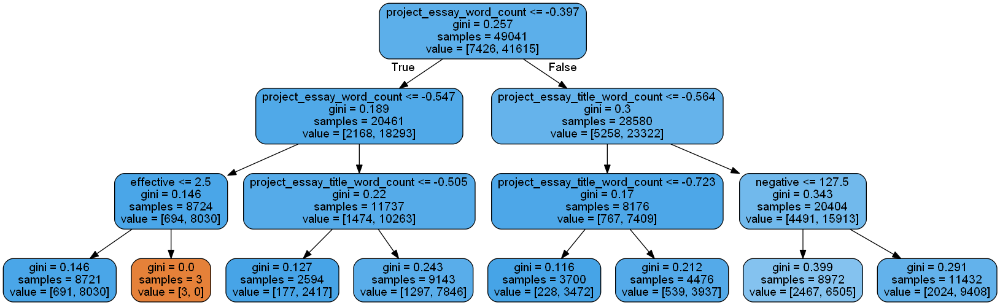

In [176]:
dot_data = tree.export_graphviz(decision_tree, out_file=None,feature_names=set_1_feature_names,filled=True,rounded=True)

graph = pydotplus.graph_from_dot_data(dot_data)

Image(graph.create_png())

# Now the Important task which comes is to know what best hyperparameters should we pass to the decision tree classifier to get the best results in terms of accuracy.

### For the task of getting the best hyperparameters we will be doing hyperparameter tuning and as we know that we have two hyperparameters in case of decision tree and they are 1.) Maximum depth of the decision tree and 2.) minimum number of sample split

#### Minimum number of sample split means what should be the minimum number of data points present in a node in order to split the node.

# Using GridSearchCV for the purpose of hyperparameter tuning.

### Importing the required modules

In [177]:
#code source: http://occam.olin.edu/sites/default/files/DataScienceMaterials/machine_learning_lecture_2/Machine%20Learning%20Lecture%202.html

from sklearn.model_selection import learning_curve, GridSearchCV
from sklearn.tree import DecisionTreeClassifier 

### Applying the GridsearchCV to find the best value of hyperparameters

In [178]:
decision_tree = DecisionTreeClassifier()

tuned_parameters = {'max_depth':[1,5,10,100,500], 'min_samples_split': [5,10,50,100,500]}


In [179]:
# refer --> https://scikit-learn.org/stable/modules/generated/sklearn.model_selection.GridSearchCV.html
# cv = 10 means 10 fold crossvalidation

clf = GridSearchCV(decision_tree,tuned_parameters,cv=10,scoring = 'roc_auc',n_jobs=-1, verbose=10)

clf.fit(X_train_merge,y_train)


Fitting 10 folds for each of 25 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:    3.1s
[Parallel(n_jobs=-1)]: Done   6 tasks      | elapsed:    4.3s
[Parallel(n_jobs=-1)]: Done  13 tasks      | elapsed:    5.5s
[Parallel(n_jobs=-1)]: Done  20 tasks      | elapsed:    6.8s
[Parallel(n_jobs=-1)]: Done  29 tasks      | elapsed:    9.2s
[Parallel(n_jobs=-1)]: Done  38 tasks      | elapsed:   11.3s
[Parallel(n_jobs=-1)]: Done  49 tasks      | elapsed:   14.0s
[Parallel(n_jobs=-1)]: Done  60 tasks      | elapsed:   19.4s
[Parallel(n_jobs=-1)]: Done  73 tasks      | elapsed:   25.9s
[Parallel(n_jobs=-1)]: Done  86 tasks      | elapsed:   31.3s
[Parallel(n_jobs=-1)]: Done 101 tasks      | elapsed:   44.4s
[Parallel(n_jobs=-1)]: Done 116 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 133 tasks      | elapsed:  1.4min
[Parallel(n_jobs=-1)]: Done 150 tasks      | elapsed:  1.8min
[Parallel(n_jobs=-1)]: Done 169 tasks      | elapsed:  7

GridSearchCV(cv=10, error_score='raise-deprecating',
       estimator=DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=None,
            max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, presort=False, random_state=None,
            splitter='best'),
       fit_params=None, iid='warn', n_jobs=-1,
       param_grid={'max_depth': [1, 5, 10, 100, 500], 'min_samples_split': [5, 10, 50, 100, 500]},
       pre_dispatch='2*n_jobs', refit=True, return_train_score='warn',
       scoring='roc_auc', verbose=10)

In [180]:
#https://stackoverflow.com/questions/44947574/what-is-the-meaning-of-mean-test-score-in-cv-result

train_auc= clf.cv_results_['mean_train_score']
cv_auc = clf.cv_results_['mean_test_score']

## Now we have 3 things to compare 1.) we need to compare our parameters max_depth and min_samples_split with our train_auc score on a single graph 2.) we need to compare our parameters max_depth and min_samples_split with our cv_auc score on a single graph

### In order to have all 3 things on the same graph what i will be using here is the heatmaps representations. 

# Comparing for train_auc

In [181]:
# importing the required libraries 

import numpy as np
import seaborn as sns

In [182]:
max_depth = [1,5,10,100,500]
min_samples_split = [5,10,50,100,500]

In [183]:
train_auc.shape

(25,)

In [184]:
cv_auc.shape

(25,)

In [185]:
# creating dataframe to plot heatmap for train_auc

#train_auc_dataframe =pd.DataFrame(data={'Maximum Depth':max_depth, 'Minimum Samples Split':min_samples_split, 'Train_AUC_Score':train_auc})

# using the above code I was getting error that all arrays must be of same size and this happened because max_depth and min_samples_split are of size 5 each only 
# while train_auc has size of 25 

# now in order to deal with it I will keep the value of max_depth five times each so with mij samples split because the algorithm of 
# grid search cv works this way only that it compapres one with all elements of opther parameter list and so on.

In [186]:
max_depth = [1,1,1,1,1,5,5,5,5,5,10,10,10,10,10,100,100,100,100,100,500,500,500,500,500]
min_samples_split = [5,10,50,100,500,5,10,50,100,500,5,10,50,100,500,5,10,50,100,500,5,10,50,100,500]

In [187]:
len(max_depth)

25

In [188]:
len(min_samples_split)

25

In [189]:
# creating dataframe to plot heatmap for train_auc

train_auc_dataframe =pd.DataFrame(data={'Maximum Depth':max_depth, 'Minimum Samples Split':min_samples_split, 'Train_AUC_Score':train_auc})

In [190]:
# adding the headings of every dimesion
train_auc_dataframe = train_auc_dataframe.pivot(index='Maximum Depth', columns='Minimum Samples Split', values='Train_AUC_Score')

Text(0.5, 1.0, 'Heatmap for AUC for Training data')

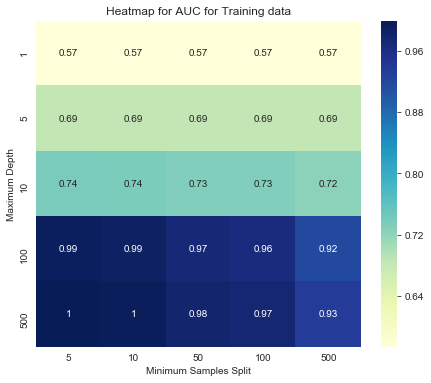

In [191]:
sns.set_style("whitegrid")
plt.figure(figsize=(16,6))
plt.subplot(1,2,1)
sns.heatmap(train_auc_dataframe, annot=True, cmap="YlGnBu").set_title('Heatmap for AUC for Training data')

# Comparing for cv_auc

In [192]:
# creating dataframe to plot heatmap for cv_auc

cv_auc_dataframe =pd.DataFrame(data={'Maximum Depth':max_depth, 'Minimum Samples Split':min_samples_split, 'CV_AUC_Score':cv_auc})

In [193]:
# adding the headings of every dimension
cv_auc_dataframe = cv_auc_dataframe.pivot(index='Maximum Depth', columns='Minimum Samples Split', values='CV_AUC_Score')

Text(0.5, 1.0, 'Heatmap for AUC for CV data')

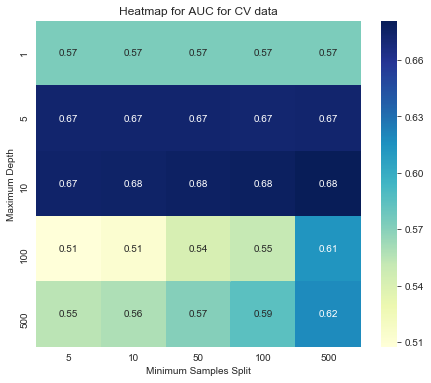

In [194]:
sns.set_style("whitegrid")
plt.figure(figsize=(16,6))
plt.subplot(1,2,1)
sns.heatmap(cv_auc_dataframe, annot=True, cmap="YlGnBu").set_title('Heatmap for AUC for CV data')

## Now seeing the two heatmaps from above the best value of max_depth is 10 and min_sample_split is 100

# Training our final model based on the value of parameters received from above

In [195]:
from sklearn.tree import DecisionTreeClassifier

model_decision_tree = DecisionTreeClassifier(max_depth = 10, min_samples_split = 100)

model_decision_tree.fit(X_train_merge,y_train)

DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=10,
            max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=100,
            min_weight_fraction_leaf=0.0, presort=False, random_state=None,
            splitter='best')

In [196]:
y_train_pred =  model_decision_tree.predict_proba(X_train_merge)[:,1]
    
y_test_pred =  model_decision_tree.predict_proba(X_test_merge)[:,1]

In [197]:
train_fpr, train_tpr, tr_thresholds = roc_curve(y_train, y_train_pred)
test_fpr, test_tpr, te_thresholds = roc_curve(y_test, y_test_pred)

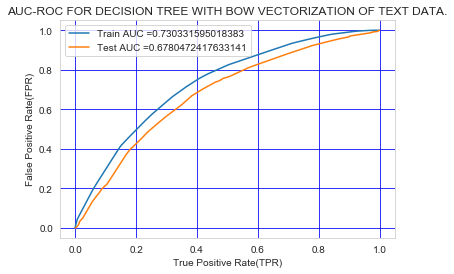

In [198]:
plt.plot(train_fpr, train_tpr, label="Train AUC ="+str(auc(train_fpr, train_tpr)))
plt.plot(test_fpr, test_tpr, label="Test AUC ="+str(auc(test_fpr, test_tpr)))
plt.legend()
plt.grid(b=True, which='major', color='b', linestyle='-')
plt.xlabel("True Positive Rate(TPR)")
plt.ylabel("False Positive Rate(FPR)")
plt.title("AUC-ROC FOR DECISION TREE WITH BOW VECTORIZATION OF TEXT DATA.")

plt.show()

### We received the train accuracy of 0.73 and test accuracy of 0.69 which is not that bad actually.

# Plotting the Decision tree for set 1 using best parameters using graphviz

In [199]:
# refer -- > https://chrisalbon.com/machine_learning/trees_and_forests/visualize_a_decision_tree/
# refer ---> https://www.youtube.com/watch?v=XxJKt9s0Dlg

dot_data = tree.export_graphviz(model_decision_tree, out_file=None,feature_names=set_1_feature_names)

graph = graphviz.Source(dot_data)
graph.format = 'png'
graph.render("Set -1 Tree with BOW features with best parameters values found using gridsearch",view = True)
#graph = pydotplus.graph_from_dot_data(dot_data)  

#Image(graph.create_png())

'Set -1 Tree with BOW features with best parameters values found using gridsearch.png'

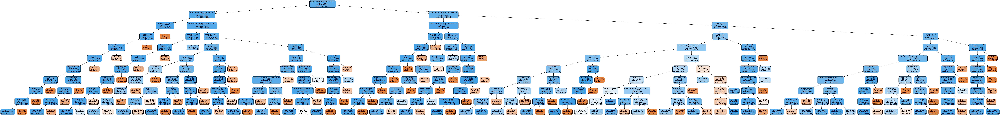

In [200]:
dot_data = tree.export_graphviz(model_decision_tree, out_file=None,feature_names=set_1_feature_names,filled=True,rounded=True)

graph = pydotplus.graph_from_dot_data(dot_data)

Image(graph.create_png())

#### I tried many things but could not make it visible clearly due to large number of depth.

# Confusion matrix for above data

In [201]:
# we are writing our own function for predict, with defined thresould
# we will pick a threshold that will give the least fpr
def predict(proba, threshould, fpr, tpr):
    
    t = threshould[np.argmax(tpr*(1-fpr))]
    
    # (tpr*(1-fpr)) will be maximum if your fpr is very low and tpr is very high
    
    print("the maximum value of tpr*(1-fpr)", max(tpr*(1-fpr)), "for threshold", np.round(t,3))
    predictions = []
    for i in proba:
        if i>=t:
            predictions.append(1)
        else:
            predictions.append(0)
    return predictions

### Confusion matrix for train and test data for BOW vectorization

In [202]:
print("="*100)
from sklearn.metrics import confusion_matrix
print("Train confusion matrix")
print(confusion_matrix(y_train, predict(y_train_pred, tr_thresholds, train_fpr, train_fpr)))
print("Test confusion matrix")
print(confusion_matrix(y_test, predict(y_test_pred, tr_thresholds, test_fpr, test_fpr)))

Train confusion matrix
the maximum value of tpr*(1-fpr) 0.24999200297047033 for threshold 0.793
[[ 3692  3734]
 [ 7285 34330]]
Test confusion matrix
the maximum value of tpr*(1-fpr) 0.24996234146461282 for threshold 0.813
[[ 2696  2763]
 [ 7172 23421]]


### Visually plotting the confusion matrix for training data

the maximum value of tpr*(1-fpr) 0.24999200297047033 for threshold 0.793


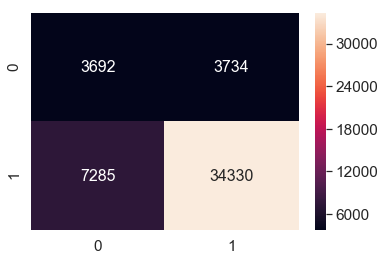

In [203]:
# Code for this segment from here -->> https://stackoverflow.com/questions/35572000/how-can-i-plot-a-confusion-matrix

import seaborn as sn
import pandas as pd
import matplotlib.pyplot as plt


df_cm = pd.DataFrame(confusion_matrix(y_train,predict(y_train_pred, tr_thresholds, train_fpr, train_fpr)), range(2),
                  range(2))
#plt.figure(figsize = (10,7))
sn.set(font_scale=1.4)#for label size
sn.heatmap(df_cm, annot=True,annot_kws={"size": 16},fmt='g')# font size

### Visually plotting the confusion matrix for test data

the maximum value of tpr*(1-fpr) 0.24996234146461282 for threshold 0.813


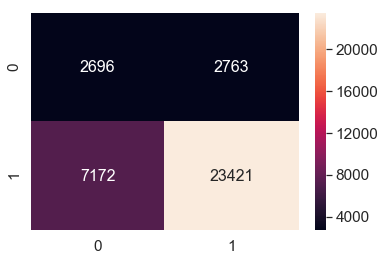

In [204]:
# Code for this segment from here -->> https://stackoverflow.com/questions/35572000/how-can-i-plot-a-confusion-matrix

import seaborn as sn
import pandas as pd
import matplotlib.pyplot as plt

df_cm_test = pd.DataFrame(confusion_matrix(y_test,predict(y_test_pred, tr_thresholds, test_fpr, test_fpr)), range(2),
                  range(2))
#plt.figure(figsize = (10,7))
sn.set(font_scale=1.4)#for label size
sn.heatmap(df_cm_test, annot=True,annot_kws={"size": 16},fmt='g')# font size

## Analysis of False Positive Test Points On Our Essay Text.

In [205]:
essay_bow_test.shape

(36052, 5000)

In [206]:
type(essay_bow_test)

scipy.sparse.csr.csr_matrix

### Now out of all the 36052 test daya points for essay we need to find out those which were declared as False Positives.

## False Positive -->> Label which was predicted as Positive, but is actually Negative.

In [207]:
X_test_merge.shape

(36052, 16829)

In [208]:
# getting all the words for which we have performed the vectorization
bow_words_vectorized = vectorizer_project_essay_bow.get_feature_names()

In [209]:
bow_words_vectorized[0:20]

['000',
 '10',
 '100',
 '100 free',
 '100 percent',
 '100 students',
 '11',
 '12',
 '12th',
 '13',
 '14',
 '15',
 '16',
 '17',
 '18',
 '19',
 '1st',
 '1st grade',
 '20',
 '20 students']

In [210]:
# number of words vectorized
len(bow_words_vectorized)

5000

### Now we have the predicted values in the y_test_pred variable 

In [211]:
type(y_test_pred)

numpy.ndarray

In [212]:
y_test_pred.shape

(36052,)

In [213]:
y_test_pred[0:20]

array([0.87994249, 0.9424226 , 0.84712329, 0.51694095, 0.89803094,
       0.94199444, 0.74283194, 0.64909091, 0.74549098, 0.96944444,
       0.87994249, 0.8970013 , 0.84712329, 0.88140351, 0.88140351,
       0.9109589 , 0.93114311, 0.89803094, 0.93114311, 0.88140351])

### Now the above values are the predicted probability values of the data points whether they will belong to the positive class or the negative class.In the confusion matrix code starting part we can see the variable t which gives us the threshold value which means  the value above which a data point is considered in the positive class.

### For the test data it can be directly seen from confusion matrix code that threshold value = 0.804

### We want all those points which have predict_proba values greater than 0.804 because they are the predicted positive points.

### Along with them we will need data points whose actual value(y_test) = 0 because they will be the points whose actual values will be negative.

### And after combining the above two conditions we will reach to the points whic were predicted to be positive but are actually negative which is actually the False positive points.

In [214]:
type(y_test)

pandas.core.series.Series

In [215]:
y_test_list = list(y_test)

In [216]:
len(y_test_list)

36052

In [217]:
threshold_value_test = 0.804

## We will try to get the index of all those points which are false positives.

In [218]:
fp_index = []
number_of_fp = 0
k = len(y_test_list)
for j in tqdm(range(k)):
    if y_test_list[j] == 0 and y_test_pred[j] >= threshold_value_test:
        fp_index.append(j)
        number_of_fp = number_of_fp + 1
        
        

100%|███████████████████████████████████████████████████████████████████████| 36052/36052 [00:00<00:00, 2780980.76it/s]


In [219]:
fp_index[2590:2605]

[34040,
 34049,
 34060,
 34066,
 34067,
 34071,
 34073,
 34077,
 34081,
 34083,
 34091,
 34098,
 34116,
 34129,
 34139]

In [220]:
len(fp_index)

2763

### So there are 2605 false positive points and yes they are different from the False positive shown in confusion matrix and this happened because the model was trained again for essay text and there is just a very small difference of value so no worries.

### Now I want the words at above indexes only

In [221]:
len(bow_words_vectorized)

5000

In [222]:
final_fp_words = []
for k in fp_index:
    if k<5000:
        final_fp_words.append(str(bow_words_vectorized[k]))

In [223]:
len(final_fp_words)

367

In [224]:
final_fp_words[0:20]

['15',
 '24',
 '3d printer',
 '45',
 '5th graders',
 '8th',
 '90',
 '99',
 'able',
 'able explore',
 'able use',
 'academic',
 'access books',
 'accomplishments',
 'accountable',
 'achieving',
 'activities',
 'age',
 'age appropriate',
 'allowing students']

In [225]:
final_fp_words == bow_words_vectorized

False

# Creating Word Cloud for the False Positive Words From Essay

In [226]:
!pip install wordcloud

In [227]:
# refer ---> https://www.geeksforgeeks.org/generating-word-cloud-python/

# importing all necessery modules 
from wordcloud import WordCloud, STOPWORDS 
import matplotlib.pyplot as plt 

stopwords = set(STOPWORDS)

#NOTE THAT WE NEED A SINGLE STRING WITH ALL THE WORDS SEPARATED BY SPACE WHOSE WORD CLOUD WEWANT TO CREATE.

final_word_string = ' '
for words in final_fp_words:
    final_word_string = final_word_string + words + " "
    


wordcloud = WordCloud(width = 2000, height = 1000,background_color ='black',stopwords = stopwords,min_font_size = 10).generate(final_word_string)





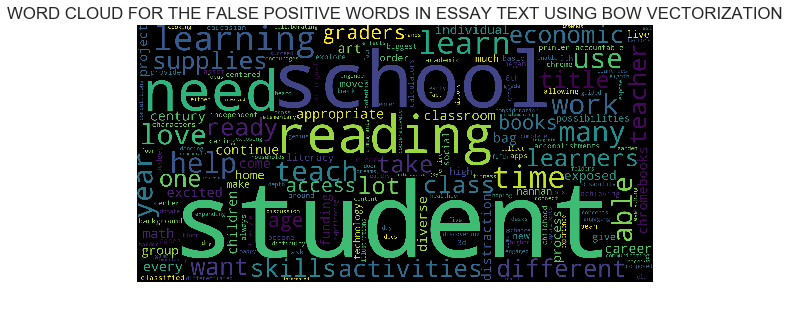

In [228]:
# plot the WordCloud image                        
plt.figure(figsize = (8, 8), facecolor = None) 
plt.imshow(wordcloud) 
plt.axis("off") 
plt.tight_layout(pad = 0)
plt.title("WORD CLOUD FOR THE FALSE POSITIVE WORDS IN ESSAY TEXT USING BOW VECTORIZATION")
  
plt.show()

# Box-Plot for these False Positive Data Points.

### For drawing the box plot we will need a dataframe with all these false positive data points

In [229]:
box_plot_dataframe_price = pd.DataFrame(X_test['price'])

In [230]:
# keeping only those indices which are refered as the false positves and removing all other 
box_plot_dataframe_price = box_plot_dataframe_price.iloc[fp_index,:]

In [231]:
box_plot_dataframe_price.shape

(2763, 1)

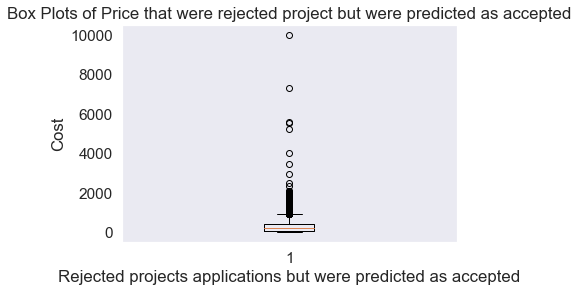

In [232]:
# creating the box plot 

plt.boxplot(box_plot_dataframe_price.values)
plt.title('Box Plots of Price that were rejected project but were predicted as accepted')
plt.xlabel('Rejected projects applications but were predicted as accepted')
plt.ylabel('Cost')
plt.grid()
plt.show()

## From above we can see that most of the wrongly accepted projects are costing very less at around 300 they might be accepted wrongly due to less cost included but actually they were rejected

# PDF with the Teacher_number_of_previously_posted_projects of the False Positive data points.

In [233]:
pdf_dataframe_teacher_number_of_previously_posted_projects = pd.DataFrame(X_test['teacher_number_of_previously_posted_projects'])

In [234]:
# keeping only those indices which are refered as the false positves and removing all other 
pdf_dataframe_teacher_number_of_previously_posted_projects = pdf_dataframe_teacher_number_of_previously_posted_projects.iloc[fp_index,:]

In [235]:
pdf_dataframe_teacher_number_of_previously_posted_projects.shape

(2763, 1)

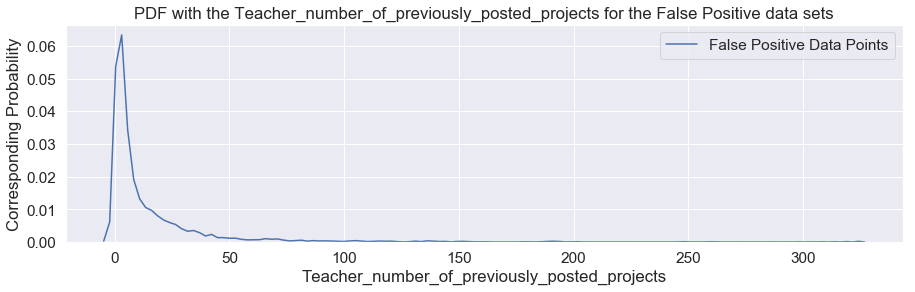

In [236]:
# plotting the pdf

plt.figure(figsize=(15,4))
sns.distplot(pdf_dataframe_teacher_number_of_previously_posted_projects.values, hist=False, label="False Positive Data Points")
plt.title('PDF with the Teacher_number_of_previously_posted_projects for the False Positive data sets')
plt.xlabel('Teacher_number_of_previously_posted_projects')
plt.ylabel('Corresponding Probability')
plt.legend()
plt.show()

# From above we can say that most of the projects which were predicted as accpeted but were actually rejected have number of previously posted projects by a teacher in the range of 0-10 only.

# Set 2 : categorical, numerical features + project_title(TFIDF) + preprocessed_essay (TFIDF)

### Note that we are using the tfidf with bigrams here and min_df value = 10 and max features = 5000 i am mentioning this here specially because trying different values of these will for sure give differeent results and may be better also but will require good computational resources.

###  Now we need to merge all the numerical vectors(categorical features,text features,numerical features) given above for set-2 which we created using different methods

In [196]:
from scipy.sparse import hstack

X_train_merge_set_2 = hstack((categories_one_hot_train,subcategories_one_hot_train,teacher_prefix_one_hot_train,project_grade_categories_one_hot_train,school_state_categories_one_hot_train,text_tfidf_train,project_title_tfidf_train,price_train,quantity_train,prev_projects_train,project_title_word_count_train,project_essay_word_count_train,neutral_train,positive_train,negative_train,compound_train)).tocsr()
X_test_merge_set_2 = hstack((categories_one_hot_test,subcategories_one_hot_test,teacher_prefix_one_hot_test,project_grade_categories_one_hot_test,school_state_categories_one_hot_test,text_tfidf_test,project_title_tfidf_test,price_test,quantity_test,prev_projects_test,project_title_word_count_test,project_essay_word_count_test,neutral_test,positive_test,negative_test,compound_test)).tocsr()
X_cv_merge_set_2 = hstack((categories_one_hot_cv,subcategories_one_hot_cv,teacher_prefix_one_hot_cv,project_grade_categories_one_hot_cv,school_state_categories_one_hot_cv,text_tfidf_cv,title_tfidf_cv,price_cv,quantity_cv,prev_projects_cv,project_title_word_count_cv,project_essay_word_count_cv,neutral_cv,positive_cv,negative_cv,compound_cv)).tocsr()

In [197]:
# this will be our finally created data matrix dimensions

print(X_train_merge_set_2.shape, y_train.shape)
print(X_test_merge_set_2.shape, y_test.shape)
print(X_cv_merge_set_2.shape, y_cv.shape)


(49041, 8108) (49041,)
(36052, 8108) (36052,)
(24155, 8108) (24155,)


# Let us just train our Decision tree model based on above data.

In [198]:
# refer --> https://scikit-learn.org/stable/modules/generated/sklearn.tree.DecisionTreeClassifier.html

from sklearn.tree import DecisionTreeClassifier
decision_tree = DecisionTreeClassifier(max_depth = 3)

In [199]:
clf = decision_tree.fit(X_train_merge_set_2,y_train)

# Now the next important task for us is to visualize this decision tree for that we will need to use the library graphviz

### Graphviz requires all the feature names hence we need to extract all the feature names first.

## Extracting feature names from essay on set-2 for graphviz

In [200]:
set_2_feature_names = []

In [201]:
# appending the project category features
for i in sorted_cat_dict:
    set_2_feature_names.append(i) 

In [202]:
len(set_2_feature_names)

9

In [203]:
# appending the project sub category features
for i in sorted_sub_cat_dict:
    set_2_feature_names.append(i)

In [204]:
len(set_2_feature_names)

39

In [205]:
# appending the teacher prefix features
for i in mylist_teacher_prefix_actual_Train:
    set_2_feature_names.append(i)

In [206]:
len(set_2_feature_names)

44

In [207]:
# appending the project grade category features
for i in mylist_project_grade_category_actual:
    set_2_feature_names.append(i)

In [208]:
len(set_2_feature_names)

48

In [209]:
# appending the school states features
for i in mylist_actual:
    set_2_feature_names.append(i)

In [210]:
len(set_2_feature_names)

99

In [211]:
#tfidf_words

In [212]:
type(tfidf_words)

set

In [213]:
tfidf_words_list = list(tfidf_words)

In [214]:
type(tfidf_words_list)

list

In [215]:
# appending the features received while applying tfidf on project essays
for i in tfidf_words_list:
    set_2_feature_names.append(i)

In [216]:
len(set_2_feature_names)

5099

In [217]:
#tfidf_project_title_words

In [218]:
type(tfidf_project_title_words)

set

In [219]:
tfidf_project_title_words_list = list(tfidf_project_title_words)

In [220]:
type(tfidf_project_title_words_list)

list

In [221]:
# appending the features received while applying tfidf on project titles
for i in tfidf_project_title_words_list:
    set_2_feature_names.append(i)

In [222]:
len(set_2_feature_names)

8099

### Now appending the remianing feature names which are in our train data for set 2

In [223]:
set_2_feature_names.append("project_essay_title_word_count")
set_2_feature_names.append("project_essay_word_count")
set_2_feature_names.append("positive")
set_2_feature_names.append("neutral")
set_2_feature_names.append("negative")
set_2_feature_names.append("compound")
set_2_feature_names.append("price")
set_2_feature_names.append("quantity")
set_2_feature_names.append("number_of_previous_projects")

In [224]:
len(set_2_feature_names)

8108

In [225]:
print(X_train_merge_set_2.shape, y_train.shape)
print(X_test_merge_set_2.shape, y_test.shape)
print(X_cv_merge_set_2.shape, y_cv.shape)

(49041, 8108) (49041,)
(36052, 8108) (36052,)
(24155, 8108) (24155,)


## Hence we can clearly see above that all the feature names have been added to the created list as 8108 matches with both.

# Using graphviz to visualize the decision tree

In [330]:
!pip install pydot

In [331]:
from IPython.display import Image  
from sklearn.externals.six import StringIO  
from sklearn.tree import export_graphviz
import pydot
import pydotplus
from sklearn import tree
import graphviz

In [332]:
!pip install pydotplus

In [333]:
!pip install graphviz

In [334]:
# refer -- > https://chrisalbon.com/machine_learning/trees_and_forests/visualize_a_decision_tree/
# refer ---> https://www.youtube.com/watch?v=XxJKt9s0Dlg

dot_data = tree.export_graphviz(decision_tree, out_file=None,feature_names=set_2_feature_names)

graph = graphviz.Source(dot_data)
graph.format = 'png'
graph.render("Set -2 Tree with TFIDF features",view = True)
#graph = pydotplus.graph_from_dot_data(dot_data)  

#Image(graph.create_png())

'Set -2 Tree with TFIDF features.png'

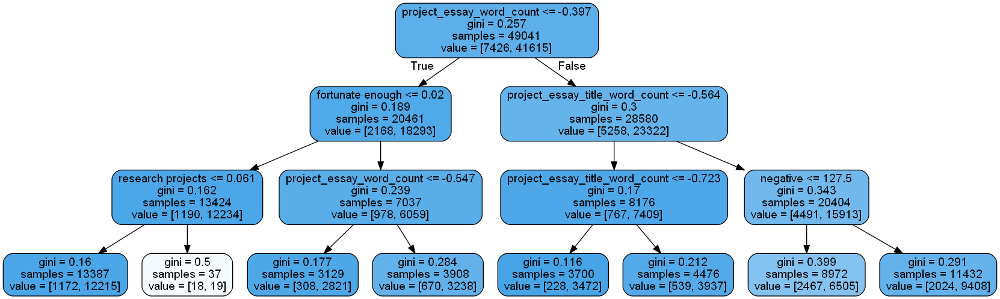

In [335]:
dot_data = tree.export_graphviz(decision_tree, out_file=None,feature_names=set_2_feature_names,filled=True,rounded=True)

graph = pydotplus.graph_from_dot_data(dot_data)

Image(graph.create_png())

# Now the Important task which comes is to know what best hyperparameters should we pass to the decision tree classifier to get the best results in terms of accuracy.

## For the task of getting the best hyperparameters we will be doing hyperparameter tuning and as we know that we have two hyperparameters in case of decision tree and they are 1.) Maximum depth of the decision tree and 2.) minimum number of sample split

#### Minimum number of sample split means what should be the minimum number of data points present in a node in order to split the node.

### Importing the required modules

In [336]:
#code source: http://occam.olin.edu/sites/default/files/DataScienceMaterials/machine_learning_lecture_2/Machine%20Learning%20Lecture%202.html

from sklearn.model_selection import learning_curve, GridSearchCV
from sklearn.tree import DecisionTreeClassifier 

## Applying the GridsearchCV to find the best value of hyperparameters

In [337]:
decision_tree = DecisionTreeClassifier()

tuned_parameters = {'max_depth':[1,5,10,100,500], 'min_samples_split': [5,10,50,100,500]}

In [338]:
# refer --> https://scikit-learn.org/stable/modules/generated/sklearn.model_selection.GridSearchCV.html
# cv = 10 means 10 fold crossvalidation

clf = GridSearchCV(decision_tree,tuned_parameters,cv=10,scoring = 'roc_auc',n_jobs=-1, verbose=10)

clf.fit(X_train_merge_set_2,y_train)

Fitting 10 folds for each of 25 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:    2.6s
[Parallel(n_jobs=-1)]: Done   6 tasks      | elapsed:    3.5s
[Parallel(n_jobs=-1)]: Done  13 tasks      | elapsed:    5.1s
[Parallel(n_jobs=-1)]: Done  20 tasks      | elapsed:    6.7s
[Parallel(n_jobs=-1)]: Done  29 tasks      | elapsed:    8.9s
[Parallel(n_jobs=-1)]: Done  38 tasks      | elapsed:   11.4s
[Parallel(n_jobs=-1)]: Done  49 tasks      | elapsed:   13.5s
[Parallel(n_jobs=-1)]: Done  60 tasks      | elapsed:   26.1s
[Parallel(n_jobs=-1)]: Done  73 tasks      | elapsed:   36.5s
[Parallel(n_jobs=-1)]: Done  86 tasks      | elapsed:   46.5s
[Parallel(n_jobs=-1)]: Done 101 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 116 tasks      | elapsed:  1.7min
[Parallel(n_jobs=-1)]: Done 133 tasks      | elapsed:  2.2min
[Parallel(n_jobs=-1)]: Done 150 tasks      | elapsed:  2.9min
[Parallel(n_jobs=-1)]: Done 169 tasks      | elapsed:  9

GridSearchCV(cv=10, error_score='raise-deprecating',
       estimator=DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=None,
            max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, presort=False, random_state=None,
            splitter='best'),
       fit_params=None, iid='warn', n_jobs=-1,
       param_grid={'max_depth': [1, 5, 10, 100, 500], 'min_samples_split': [5, 10, 50, 100, 500]},
       pre_dispatch='2*n_jobs', refit=True, return_train_score='warn',
       scoring='roc_auc', verbose=10)

In [339]:
#https://stackoverflow.com/questions/44947574/what-is-the-meaning-of-mean-test-score-in-cv-result

train_auc= clf.cv_results_['mean_train_score']
cv_auc = clf.cv_results_['mean_test_score']

## Now we have 3 things to compare 1.) we need to compare our parameters max_depth and min_samples_split with our train_auc score on a single graph 2.) we need to compare our parameters max_depth and min_samples_split with our cv_auc score on a single graph

### In order to have all 3 things on the same graph what i will be using here is the heatmaps representations.

## Comparing for train_auc

In [340]:
# importing the required libraries 

import numpy as np
import seaborn as sns

In [341]:
max_depth = [1,5,10,100,500]
min_samples_split = [5,10,50,100,500]

In [342]:
train_auc.shape

(25,)

In [343]:
cv_auc.shape

(25,)

In [345]:
# creating dataframe to plot heatmap for train_auc

#train_auc_dataframe =pd.DataFrame(data={'Maximum Depth':max_depth, 'Minimum Samples Split':min_samples_split, 'Train_AUC_Score':train_auc})

# using the above code I was getting error that all arrays must be of same size and this happened because max_depth and min_samples_split are of size 5 each only 
# while train_auc has size of 25 

# now in order to deal with it I will keep the value of max_depth five times each so with mij samples split because the algorithm of 
# grid search cv works this way only that it compapres one with all elements of opther parameter list and so on.


# WE CAN DO IT VICE VERSA ALSO LIKE WRITING 1,5,10,100,500 5 TIMES FOR MAX DEPTH AND WRITING 55555,10,10,10,10,10 SO ON FOR MIN_SAMPLES_SPLIT

In [346]:
max_depth = [1,1,1,1,1,5,5,5,5,5,10,10,10,10,10,100,100,100,100,100,500,500,500,500,500]
min_samples_split = [5,10,50,100,500,5,10,50,100,500,5,10,50,100,500,5,10,50,100,500,5,10,50,100,500]

In [347]:
len(max_depth)

25

In [348]:
len(min_samples_split)

25

In [349]:
# creating dataframe to plot heatmap for train_auc

train_auc_dataframe =pd.DataFrame(data={'Maximum Depth':max_depth, 'Minimum Samples Split':min_samples_split, 'Train_AUC_Score':train_auc})

In [350]:
# adding the headings of every dimesion
train_auc_dataframe = train_auc_dataframe.pivot(index='Maximum Depth', columns='Minimum Samples Split', values='Train_AUC_Score')

Text(0.5, 1.0, 'Heatmap for AUC for Training data SET-2')

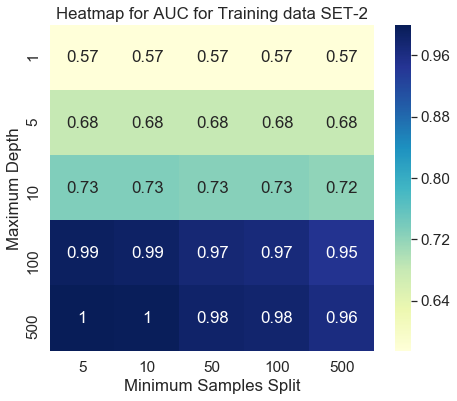

In [352]:
sns.set_style("whitegrid")
plt.figure(figsize=(16,6))
plt.subplot(1,2,1)
sns.heatmap(train_auc_dataframe, annot=True, cmap="YlGnBu").set_title('Heatmap for AUC for Training data SET-2')

# Comparing for cv_auc

In [353]:
# creating dataframe to plot heatmap for cv_auc

cv_auc_dataframe =pd.DataFrame(data={'Maximum Depth':max_depth, 'Minimum Samples Split':min_samples_split, 'CV_AUC_Score':cv_auc})

In [354]:
# adding the headings of every dimension
cv_auc_dataframe = cv_auc_dataframe.pivot(index='Maximum Depth', columns='Minimum Samples Split', values='CV_AUC_Score')

Text(0.5, 1.0, 'Heatmap for AUC for CV data SET-2')

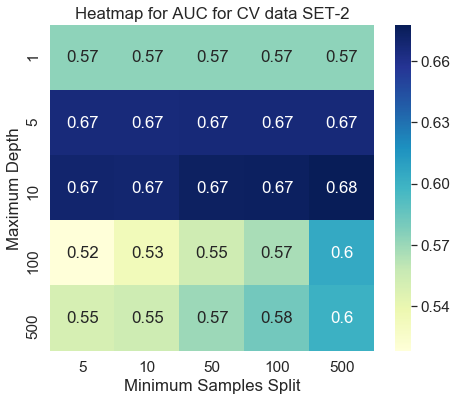

In [355]:
sns.set_style("whitegrid")
plt.figure(figsize=(16,6))
plt.subplot(1,2,1)
sns.heatmap(cv_auc_dataframe, annot=True, cmap="YlGnBu").set_title('Heatmap for AUC for CV data SET-2')

## Now seeing the two heatmaps from above the best value of max_depth is 10 and min_sample_split is 500

# Training our final model based on the value of parameters received from above.

In [357]:
from sklearn.tree import DecisionTreeClassifier

model_decision_tree = DecisionTreeClassifier(max_depth = 10, min_samples_split = 500)

model_decision_tree.fit(X_train_merge_set_2,y_train)

DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=10,
            max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=500,
            min_weight_fraction_leaf=0.0, presort=False, random_state=None,
            splitter='best')

In [358]:
y_train_pred =  model_decision_tree.predict_proba(X_train_merge_set_2)[:,1]
    
y_test_pred =  model_decision_tree.predict_proba(X_test_merge_set_2)[:,1]


In [359]:
train_fpr, train_tpr, tr_thresholds = roc_curve(y_train, y_train_pred)
test_fpr, test_tpr, te_thresholds = roc_curve(y_test, y_test_pred)

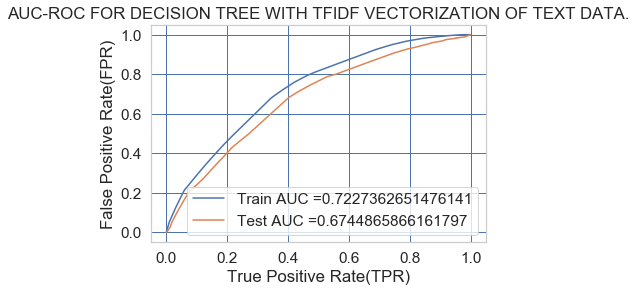

In [360]:
plt.plot(train_fpr, train_tpr, label="Train AUC ="+str(auc(train_fpr, train_tpr)))
plt.plot(test_fpr, test_tpr, label="Test AUC ="+str(auc(test_fpr, test_tpr)))
plt.legend()
plt.grid(b=True, which='major', color='b', linestyle='-')
plt.xlabel("True Positive Rate(TPR)")
plt.ylabel("False Positive Rate(FPR)")
plt.title("AUC-ROC FOR DECISION TREE WITH TFIDF VECTORIZATION OF TEXT DATA.")

plt.show()

## We received the train accuracy of 0.72 and test accuracy of 0.68 which is not that bad actually.

# Plotting the Decision tree for set 2 using best parameters using graphviz

In [361]:
# refer -- > https://chrisalbon.com/machine_learning/trees_and_forests/visualize_a_decision_tree/
# refer ---> https://www.youtube.com/watch?v=XxJKt9s0Dlg

dot_data = tree.export_graphviz(model_decision_tree, out_file=None,feature_names=set_2_feature_names)

graph = graphviz.Source(dot_data)
graph.format = 'png'
graph.render("Set -2 Tree with TFIDF features with best parameters values found using gridsearch",view = True)
#graph = pydotplus.graph_from_dot_data(dot_data)  

#Image(graph.create_png())

'Set -2 Tree with TFIDF features with best parameters values found using gridsearch.png'

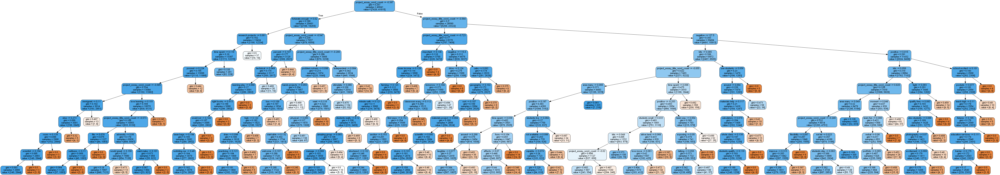

In [362]:
dot_data = tree.export_graphviz(model_decision_tree, out_file=None,feature_names=set_2_feature_names,filled=True,rounded=True)

graph = pydotplus.graph_from_dot_data(dot_data)

Image(graph.create_png())

### I tried many things but could not make it visible clearly due to large number of depth but I have received its image in my desktop which can be zoomed easily and seen.

# Confusion matrix for above data

In [363]:
# we are writing our own function for predict, with defined thresould
# we will pick a threshold that will give the least fpr
def predict(proba, threshould, fpr, tpr):
    
    t = threshould[np.argmax(tpr*(1-fpr))]
    
    # (tpr*(1-fpr)) will be maximum if your fpr is very low and tpr is very high
    
    print("the maximum value of tpr*(1-fpr)", max(tpr*(1-fpr)), "for threshold", np.round(t,3))
    predictions = []
    for i in proba:
        if i>=t:
            predictions.append(1)
        else:
            predictions.append(0)
    return predictions

## Confusion matrix for train and test data for TFIDF vectorization

In [364]:
print("="*100)
from sklearn.metrics import confusion_matrix
print("Train confusion matrix")
print(confusion_matrix(y_train, predict(y_train_pred, tr_thresholds, train_fpr, train_fpr)))
print("Test confusion matrix")
print(confusion_matrix(y_test, predict(y_test_pred, tr_thresholds, test_fpr, test_fpr)))

Train confusion matrix
the maximum value of tpr*(1-fpr) 0.24991859713025238 for threshold 0.781
[[ 3780  3646]
 [ 7834 33781]]
Test confusion matrix
the maximum value of tpr*(1-fpr) 0.24954456577686931 for threshold 0.82
[[ 2613  2846]
 [ 6674 23919]]


## Visually plotting the confusion matrix for training data

the maximum value of tpr*(1-fpr) 0.24991859713025238 for threshold 0.781


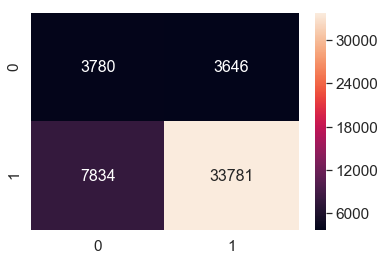

In [365]:
# Code for this segment from here -->> https://stackoverflow.com/questions/35572000/how-can-i-plot-a-confusion-matrix

import seaborn as sn
import pandas as pd
import matplotlib.pyplot as plt


df_cm = pd.DataFrame(confusion_matrix(y_train,predict(y_train_pred, tr_thresholds, train_fpr, train_fpr)), range(2),
                  range(2))
#plt.figure(figsize = (10,7))
sn.set(font_scale=1.4)#for label size
sn.heatmap(df_cm, annot=True,annot_kws={"size": 16},fmt='g')# font size

## Visually plotting the confusion matrix for test data

the maximum value of tpr*(1-fpr) 0.24954456577686931 for threshold 0.82


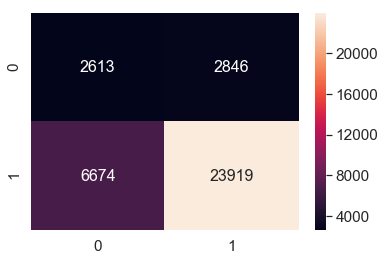

In [366]:
# Code for this segment from here -->> https://stackoverflow.com/questions/35572000/how-can-i-plot-a-confusion-matrix

import seaborn as sn
import pandas as pd
import matplotlib.pyplot as plt

df_cm_test = pd.DataFrame(confusion_matrix(y_test,predict(y_test_pred, tr_thresholds, test_fpr, test_fpr)), range(2),
                  range(2))
#plt.figure(figsize = (10,7))
sn.set(font_scale=1.4)#for label size
sn.heatmap(df_cm_test, annot=True,annot_kws={"size": 16},fmt='g')# font size

# Analysis of False Positive Test Points On Our TFIDF VECTORIZED Essay Text.

In [367]:
text_tfidf_test.shape

(36052, 5000)

In [368]:
type(essay_bow_test)

scipy.sparse.csr.csr_matrix

## Now out of all the 36052 test daTa points for TFIDF VECTORIZED essay we need to find out those which were declared as False Positives.

# False Positive -->> Label which was predicted as Positive, but is actually Negative.

In [369]:
X_test_merge_set_2.shape

(36052, 8108)

In [372]:
# getting all the words for which we have performed the vectorization
tfidf_words_list[0:20]

['offering',
 'resources home',
 'use classroom',
 'new exciting',
 'copies',
 'socioeconomic backgrounds',
 'economy',
 'voices',
 'professional',
 'fluency comprehension',
 'would make',
 'art projects',
 'able participate',
 'classroom safe',
 'pe',
 'school work',
 'income households',
 'teachers',
 'work school',
 'list']

In [373]:
len(tfidf_words_list)

5000

### Now we have the predicted values in the y_test_pred variable

In [374]:
type(y_test_pred)

numpy.ndarray

In [375]:
y_test_pred.shape

(36052,)

In [376]:
y_test_pred[0:20]

array([0.90590551, 0.94654605, 0.84762425, 0.59296482, 0.90327169,
       0.89911308, 0.76116259, 0.71902269, 0.76270733, 0.96540881,
       0.90590551, 0.91340782, 0.84762425, 0.89381197, 0.89381197,
       0.76116259, 0.91092328, 0.2       , 0.89381197, 0.89381197])

## Now the above values are the predicted probability values of the data points whether they will belong to the positive class or the negative class.In the confusion matrix code starting part we can see the variable t which gives us the threshold value which means the value above which a data point is considered in the positive class.

## For the test data it can be directly seen from confusion matrix code that threshold value = 0.82

## We want all those points which have predict_proba values greater than 0.82 because they are the predicted positive points.


## Along with them we will need data points whose actual value(y_test) = 0 because they will be the points whose actual values will be negative.¶

## And after combining the above two conditions we will reach to the points whic were predicted to be positive but are actually negative which is actually the False positive points.

In [377]:
type(y_test)

pandas.core.series.Series

In [378]:
y_test_list = list(y_test)

In [379]:
len(y_test_list)

36052

In [380]:
threshold_value_test = 0.82

### We will try to get the index of all those points which are false positives

In [394]:
fp_index = []
number_of_fp = 0
k = len(y_test_list)
for j in tqdm(range(k)):
    if y_test_list[j] == 0 and y_test_pred[j] >= threshold_value_test:
        fp_index.append(j)
        number_of_fp = number_of_fp + 1

100%|███████████████████████████████████████████████████████████████████████| 36052/36052 [00:00<00:00, 2780725.06it/s]


In [395]:
#fp_index[2450:2646]

In [396]:
len(fp_index)

2608

## So there are 2608 false positive points and yes they are different from the False positive shown in confusion matrix and this happened because the model was trained again for essay text and there is just a very small difference of value so no worries

##  Now I want the words at above indexes only

In [397]:
final_fp_words = []
for k in fp_index:
    if k<5000:
        final_fp_words.append(str(tfidf_words_list[k]))

In [398]:
len(final_fp_words)

354

In [399]:
final_fp_words[0:20]

['art projects',
 'live poverty',
 'new students',
 'due lack',
 'differentiation',
 'rate',
 'younger',
 'kiddos',
 'seniors',
 'classroom place',
 'celebrate',
 'morning meeting',
 'virtual',
 'classroom would',
 'hands projects',
 'novels',
 'classrooms',
 '2nd',
 'readers nannan',
 'around us']

In [400]:
final_fp_words == tfidf_words_list

False

# Creating Word Cloud for the False Positive Words From TFIDF VECTORIZED Essay

In [401]:
!pip install wordcloud

In [402]:
# refer ---> https://www.geeksforgeeks.org/generating-word-cloud-python/

# importing all necessery modules 
from wordcloud import WordCloud, STOPWORDS 
import matplotlib.pyplot as plt 

stopwords = set(STOPWORDS)

#NOTE THAT WE NEED A SINGLE STRING WITH ALL THE WORDS SEPARATED BY SPACE WHOSE WORD CLOUD WEWANT TO CREATE.

final_word_string = ' '
for words in final_fp_words:
    final_word_string = final_word_string + words + " "
    


wordcloud = WordCloud(width = 2000, height = 1000,background_color ='black',stopwords = stopwords,min_font_size = 10).generate(final_word_string)

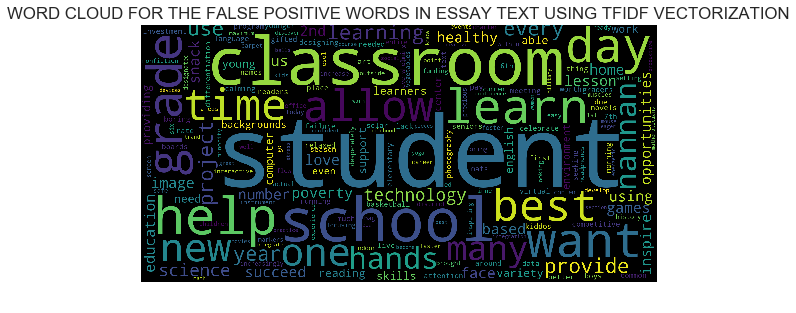

In [403]:
# plot the WordCloud image                        
plt.figure(figsize = (8, 8), facecolor = None) 
plt.imshow(wordcloud) 
plt.axis("off") 
plt.tight_layout(pad = 0)
plt.title("WORD CLOUD FOR THE FALSE POSITIVE WORDS IN ESSAY TEXT USING TFIDF VECTORIZATION")
  
plt.show()

## Box-Plot for these False Positive Data Points.

## For drawing the box plot we will need a dataframe with all these false positive data points

In [404]:
box_plot_dataframe_price = pd.DataFrame(X_test['price'])

In [405]:
# keeping only those indices which are refered as the false positves and removing all other 
box_plot_dataframe_price = box_plot_dataframe_price.iloc[fp_index,:]

In [406]:
box_plot_dataframe_price.shape

(2608, 1)

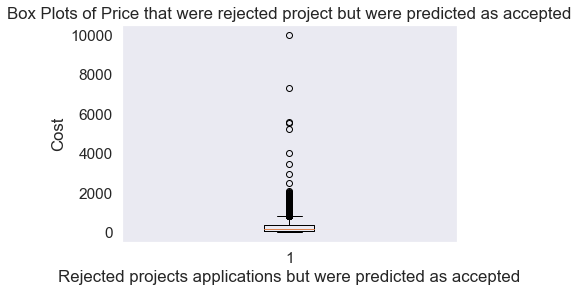

In [407]:
# creating the box plot 

plt.boxplot(box_plot_dataframe_price.values)
plt.title('Box Plots of Price that were rejected project but were predicted as accepted')
plt.xlabel('Rejected projects applications but were predicted as accepted')
plt.ylabel('Cost')
plt.grid()
plt.show()

###  From above we can see that most of the wrongly accepted projects are costing very less at around 500 they might be accepted wrongly due to less cost included but actually they were rejected


# PDF with the Teacher_number_of_previously_posted_projects of the False Positive data points.

In [408]:
pdf_dataframe_teacher_number_of_previously_posted_projects = pd.DataFrame(X_test['teacher_number_of_previously_posted_projects'])

In [409]:
# keeping only those indices which are refered as the false positves and removing all other 
pdf_dataframe_teacher_number_of_previously_posted_projects = pdf_dataframe_teacher_number_of_previously_posted_projects.iloc[fp_index,:]

In [410]:
pdf_dataframe_teacher_number_of_previously_posted_projects.shape

(2608, 1)

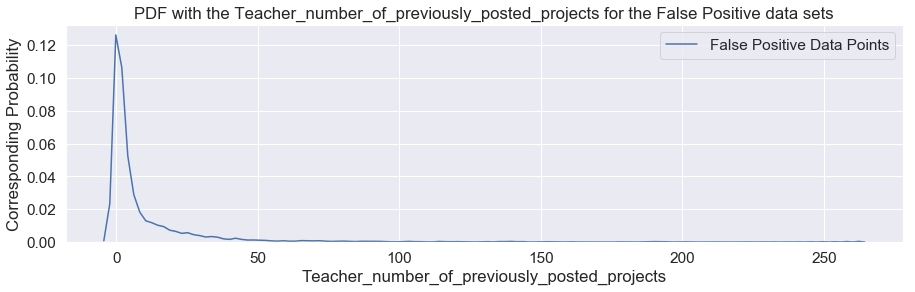

In [411]:
# plotting the pdf

plt.figure(figsize=(15,4))
sns.distplot(pdf_dataframe_teacher_number_of_previously_posted_projects.values, hist=False, label="False Positive Data Points")
plt.title('PDF with the Teacher_number_of_previously_posted_projects for the False Positive data sets')
plt.xlabel('Teacher_number_of_previously_posted_projects')
plt.ylabel('Corresponding Probability')
plt.legend()
plt.show()

### From above we can say that most of the projects which were predicted as accpeted but were actually rejected have number of previously posted projects by a teacher in the range of 0-15 only.¶

# Set 3 : categorical, numerical features + project_title(AVG W2V) + preprocessed_essay (AVG W2V)

## Now we need to merge all the numerical vectors(categorical features,text features,numerical features) given above for set-3 which we created using different methods

In [412]:
from scipy.sparse import hstack

X_train_merge_set_3 = hstack((categories_one_hot_train,subcategories_one_hot_train,teacher_prefix_one_hot_train,project_grade_categories_one_hot_train,school_state_categories_one_hot_train,avg_w2v_vectors_train,avg_w2v_vectors_project_title_train,price_train,quantity_train,prev_projects_train,project_title_word_count_train,project_essay_word_count_train,neutral_train,positive_train,negative_train,compound_train)).tocsr()
X_test_merge_set_3 = hstack((categories_one_hot_test,subcategories_one_hot_test,teacher_prefix_one_hot_test,project_grade_categories_one_hot_test,school_state_categories_one_hot_test,avg_w2v_vectors_test,avg_w2v_vectors_project_title_test,price_test,quantity_test,prev_projects_test,project_title_word_count_test,project_essay_word_count_test,neutral_test,positive_test,negative_test,compound_test)).tocsr()
X_cv_merge_set_3 = hstack((categories_one_hot_cv,subcategories_one_hot_cv,teacher_prefix_one_hot_cv,project_grade_categories_one_hot_cv,school_state_categories_one_hot_cv,avg_w2v_vectors_cv,avg_w2v_vectors_project_title_cv,price_cv,quantity_cv,prev_projects_cv,project_title_word_count_cv,project_essay_word_count_cv,neutral_cv,positive_cv,negative_cv,compound_cv)).tocsr()

In [413]:
# this will be our finally created data matrix dimensions

print(X_train_merge_set_3.shape, y_train.shape)
print(X_test_merge_set_3.shape, y_test.shape)
print(X_cv_merge_set_3.shape, y_cv.shape)

(49041, 708) (49041,)
(36052, 708) (36052,)
(24155, 708) (24155,)


### HERE WE WILL NOT BE USING GRAPHVIZ BECAUSE WORD2VEC MODEL DOESNOT RETURN US THE ACTUAL WORDS AND HENCE WE CANNOT VISUALIZE THE WORDS USING GRAPHVIZ

# Using GridSearchCV for the purpose of hyperparameter tuning and finding the best parameters for our final model.

#### Applying the GridsearchCV to find the best value of hyperparameters

In [416]:
decision_tree = DecisionTreeClassifier()

tuned_parameters = {'max_depth':[1,5,10,100,500], 'min_samples_split': [5,10,50,100,500]}

In [417]:
# refer --> https://scikit-learn.org/stable/modules/generated/sklearn.model_selection.GridSearchCV.html
# cv = 10 means 10 fold crossvalidation

clf = GridSearchCV(decision_tree,tuned_parameters,cv=10,scoring = 'roc_auc',n_jobs=-1, verbose=10)

clf.fit(X_train_merge_set_3,y_train)

Fitting 10 folds for each of 25 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:    7.9s
[Parallel(n_jobs=-1)]: Done   6 tasks      | elapsed:    9.7s
[Parallel(n_jobs=-1)]: Done  13 tasks      | elapsed:   20.0s
[Parallel(n_jobs=-1)]: Done  20 tasks      | elapsed:   25.9s
[Parallel(n_jobs=-1)]: Done  29 tasks      | elapsed:   38.0s
[Parallel(n_jobs=-1)]: Done  38 tasks      | elapsed:   45.3s
[Parallel(n_jobs=-1)]: Done  49 tasks      | elapsed:   58.6s
[Parallel(n_jobs=-1)]: Done  60 tasks      | elapsed:  1.7min
[Parallel(n_jobs=-1)]: Done  73 tasks      | elapsed:  2.6min
[Parallel(n_jobs=-1)]: Done  86 tasks      | elapsed:  3.4min
[Parallel(n_jobs=-1)]: Done 101 tasks      | elapsed:  4.9min
[Parallel(n_jobs=-1)]: Done 116 tasks      | elapsed:  7.6min
[Parallel(n_jobs=-1)]: Done 133 tasks      | elapsed: 10.1min
[Parallel(n_jobs=-1)]: Done 150 tasks      | elapsed: 12.8min
[Parallel(n_jobs=-1)]: Done 169 tasks      | elapsed: 38

GridSearchCV(cv=10, error_score='raise-deprecating',
       estimator=DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=None,
            max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, presort=False, random_state=None,
            splitter='best'),
       fit_params=None, iid='warn', n_jobs=-1,
       param_grid={'max_depth': [1, 5, 10, 100, 500], 'min_samples_split': [5, 10, 50, 100, 500]},
       pre_dispatch='2*n_jobs', refit=True, return_train_score='warn',
       scoring='roc_auc', verbose=10)

In [418]:
#https://stackoverflow.com/questions/44947574/what-is-the-meaning-of-mean-test-score-in-cv-result

train_auc= clf.cv_results_['mean_train_score']
cv_auc = clf.cv_results_['mean_test_score']

# Now we have 3 things to compare 1.) we need to compare our parameters max_depth and min_samples_split with our train_auc score on a single graph 2.) we need to compare our parameters max_depth and min_samples_split with our cv_auc score on a single graph

### In order to have all 3 things on the same graph what i will be using here is the heatmaps representations.

### Comparing for train_auc

In [419]:
# importing the required libraries 

import numpy as np
import seaborn as sns

In [420]:
max_depth = [1,5,10,100,500]
min_samples_split = [5,10,50,100,500]

In [421]:
train_auc.shape

(25,)

In [422]:
cv_auc.shape

(25,)

In [425]:
# creating dataframe to plot heatmap for train_auc

#train_auc_dataframe =pd.DataFrame(data={'Maximum Depth':max_depth, 'Minimum Samples Split':min_samples_split, 'Train_AUC_Score':train_auc})

# using the above code I was getting error that all arrays must be of same size and this happened because max_depth and min_samples_split are of size 5 each only 
# while train_auc has size of 25 

# now in order to deal with it I will keep the value of max_depth five times each so with mij samples split because the algorithm of 
# grid search cv works this way only that it compapres one with all elements of opther parameter list and so on.

# WE CAN DO IT VICE VERSA ALSO LIKE WRITING 1,5,10,100,500 5 TIMES FOR MAX DEPTH AND WRITING 55555,10,10,10,10,10 SO ON FOR MIN_SAMPLES_SPLIT

In [426]:
max_depth = [1,1,1,1,1,5,5,5,5,5,10,10,10,10,10,100,100,100,100,100,500,500,500,500,500]
min_samples_split = [5,10,50,100,500,5,10,50,100,500,5,10,50,100,500,5,10,50,100,500,5,10,50,100,500]

In [427]:
len(max_depth)

25

In [428]:
len(min_samples_split)

25

In [429]:
# creating dataframe to plot heatmap for train_auc

train_auc_dataframe =pd.DataFrame(data={'Maximum Depth':max_depth, 'Minimum Samples Split':min_samples_split, 'Train_AUC_Score':train_auc})

In [430]:
# adding the headings of every dimesion
train_auc_dataframe = train_auc_dataframe.pivot(index='Maximum Depth', columns='Minimum Samples Split', values='Train_AUC_Score')

Text(0.5, 1.0, 'Heatmap for AUC for Training data SET-3')

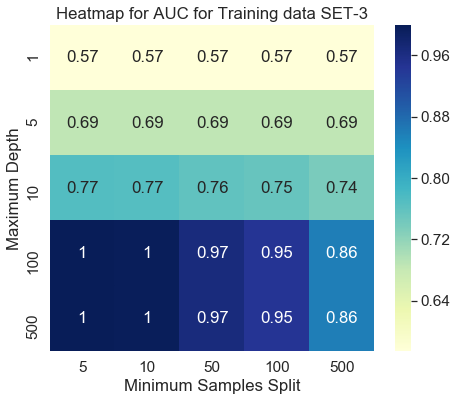

In [431]:
sns.set_style("whitegrid")
plt.figure(figsize=(16,6))
plt.subplot(1,2,1)
sns.heatmap(train_auc_dataframe, annot=True, cmap="YlGnBu").set_title('Heatmap for AUC for Training data SET-3')

## Comparing for cv_auc

In [432]:
# creating dataframe to plot heatmap for cv_auc

cv_auc_dataframe =pd.DataFrame(data={'Maximum Depth':max_depth, 'Minimum Samples Split':min_samples_split, 'CV_AUC_Score':cv_auc})

In [433]:
# adding the headings of every dimension
cv_auc_dataframe = cv_auc_dataframe.pivot(index='Maximum Depth', columns='Minimum Samples Split', values='CV_AUC_Score')

Text(0.5, 1.0, 'Heatmap for AUC for CV data SET-3')

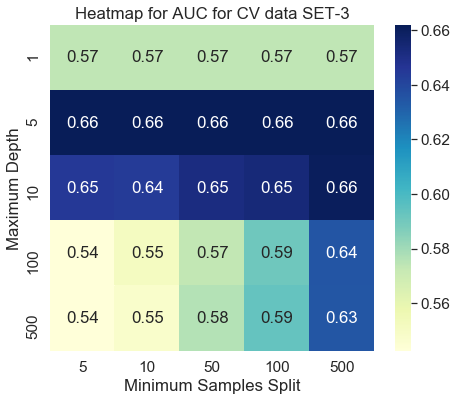

In [434]:
sns.set_style("whitegrid")
plt.figure(figsize=(16,6))
plt.subplot(1,2,1)
sns.heatmap(cv_auc_dataframe, annot=True, cmap="YlGnBu").set_title('Heatmap for AUC for CV data SET-3')

## Now seeing the two heatmaps from above the best value of max_depth is 5 and min_sample_split is 50

## Training our final model based on the value of parameters received from above

In [436]:
from sklearn.tree import DecisionTreeClassifier

model_decision_tree = DecisionTreeClassifier(max_depth = 5, min_samples_split = 50)

model_decision_tree.fit(X_train_merge_set_3,y_train)

DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=5,
            max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=50,
            min_weight_fraction_leaf=0.0, presort=False, random_state=None,
            splitter='best')

In [437]:
y_train_pred =  model_decision_tree.predict_proba(X_train_merge_set_3)[:,1]
    
y_test_pred =  model_decision_tree.predict_proba(X_test_merge_set_3)[:,1]

In [438]:
train_fpr, train_tpr, tr_thresholds = roc_curve(y_train, y_train_pred)
test_fpr, test_tpr, te_thresholds = roc_curve(y_test, y_test_pred)

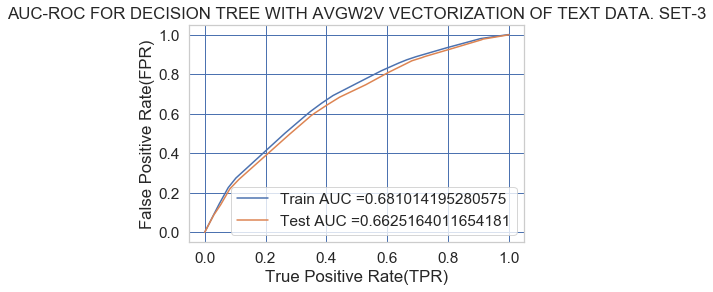

In [439]:
plt.plot(train_fpr, train_tpr, label="Train AUC ="+str(auc(train_fpr, train_tpr)))
plt.plot(test_fpr, test_tpr, label="Test AUC ="+str(auc(test_fpr, test_tpr)))
plt.legend()
plt.grid(b=True, which='major', color='b', linestyle='-')
plt.xlabel("True Positive Rate(TPR)")
plt.ylabel("False Positive Rate(FPR)")
plt.title("AUC-ROC FOR DECISION TREE WITH AVGW2V VECTORIZATION OF TEXT DATA. SET-3")

plt.show()

## We received the train accuracy of 0.68 and test accuracy of 0.66 which is not that bad actually.

# Confusion matrix for above data

### Confusion matrix for train and test data for BOW vectorization

In [440]:
print("="*100)
from sklearn.metrics import confusion_matrix
print("Train confusion matrix")
print(confusion_matrix(y_train, predict(y_train_pred, tr_thresholds, train_fpr, train_fpr)))
print("Test confusion matrix")
print(confusion_matrix(y_test, predict(y_test_pred, tr_thresholds, test_fpr, test_fpr)))

Train confusion matrix
the maximum value of tpr*(1-fpr) 0.24998866634136951 for threshold 0.816
[[ 3688  3738]
 [10125 31490]]
Test confusion matrix
the maximum value of tpr*(1-fpr) 0.2491355818345225 for threshold 0.816
[[ 2569  2890]
 [ 7745 22848]]


### Visually plotting the confusion matrix for training data

the maximum value of tpr*(1-fpr) 0.24998866634136951 for threshold 0.816


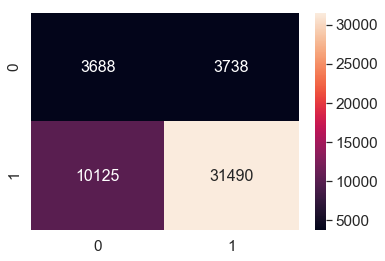

In [441]:
# Code for this segment from here -->> https://stackoverflow.com/questions/35572000/how-can-i-plot-a-confusion-matrix

import seaborn as sn
import pandas as pd
import matplotlib.pyplot as plt


df_cm = pd.DataFrame(confusion_matrix(y_train,predict(y_train_pred, tr_thresholds, train_fpr, train_fpr)), range(2),
                  range(2))
#plt.figure(figsize = (10,7))
sn.set(font_scale=1.4)#for label size
sn.heatmap(df_cm, annot=True,annot_kws={"size": 16},fmt='g')# font size

## Visually plotting the confusion matrix for test data

the maximum value of tpr*(1-fpr) 0.2491355818345225 for threshold 0.816


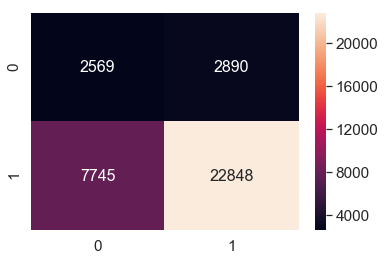

In [442]:
# Code for this segment from here -->> https://stackoverflow.com/questions/35572000/how-can-i-plot-a-confusion-matrix

import seaborn as sn
import pandas as pd
import matplotlib.pyplot as plt

df_cm_test = pd.DataFrame(confusion_matrix(y_test,predict(y_test_pred, tr_thresholds, test_fpr, test_fpr)), range(2),
                  range(2))
#plt.figure(figsize = (10,7))
sn.set(font_scale=1.4)#for label size
sn.heatmap(df_cm_test, annot=True,annot_kws={"size": 16},fmt='g')# font size

# Set 4 : Categorical, Numerical features + Project_title(TFIDF W2V) + Preprocessed_essay (TFIDF W2V)

### Now we need to merge all the numerical vectors(categorical features,text features,numerical features) given above for set-3 which we created using different methods

In [445]:
from scipy.sparse import hstack

X_train_merge_set_4 = hstack((categories_one_hot_train,subcategories_one_hot_train,teacher_prefix_one_hot_train,project_grade_categories_one_hot_train,school_state_categories_one_hot_train,tfidf_w2v_vectors_text_train,tfidf_w2v_vectors_project_title_train,price_train,quantity_train,prev_projects_train,project_title_word_count_train,project_essay_word_count_train,neutral_train,positive_train,negative_train,compound_train)).tocsr()
X_test_merge_set_4 = hstack((categories_one_hot_test,subcategories_one_hot_test,teacher_prefix_one_hot_test,project_grade_categories_one_hot_test,school_state_categories_one_hot_test,tfidf_w2v_vectors_text_test,tfidf_w2v_vectors_project_title_test,price_test,quantity_test,prev_projects_test,project_title_word_count_test,project_essay_word_count_test,neutral_test,positive_test,negative_test,compound_test)).tocsr()
X_cv_merge_set_4 = hstack((categories_one_hot_cv,subcategories_one_hot_cv,teacher_prefix_one_hot_cv,project_grade_categories_one_hot_cv,school_state_categories_one_hot_cv,tfidf_w2v_vectors_text_cv,tfidf_w2v_vectors_project_title_cv,price_cv,quantity_cv,prev_projects_cv,project_title_word_count_cv,project_essay_word_count_cv,neutral_cv,positive_cv,negative_cv,compound_cv)).tocsr()

In [446]:
# this will be our finally created data matrix dimensions

print(X_train_merge_set_4.shape, y_train.shape)
print(X_test_merge_set_4.shape, y_test.shape)
print(X_cv_merge_set_4.shape,y_cv.shape)

(49041, 708) (49041,)
(36052, 708) (36052,)
(24155, 708) (24155,)


## HERE WE WILL NOT BE USING GRAPHVIZ BECAUSE WORD2VEC MODEL DOESNOT RETURN US THE ACTUAL WORDS AND HENCE WE CANNOT VISUALIZE THE WORDS USING GRAPHVIZ

# Using GridSearchCV for the purpose of hyperparameter tuning and finding the best parameters for our final model.

## Importing the required modules

In [452]:
#code source: http://occam.olin.edu/sites/default/files/DataScienceMaterials/machine_learning_lecture_2/Machine%20Learning%20Lecture%202.html

from sklearn.model_selection import learning_curve, GridSearchCV
from sklearn.tree import DecisionTreeClassifier 

### Applying the GridsearchCV to find the best value of hyperparameters

In [453]:
decision_tree = DecisionTreeClassifier()

tuned_parameters = {'max_depth':[1,5,10,100,500], 'min_samples_split': [5,10,50,100,500]}

In [454]:
# refer --> https://scikit-learn.org/stable/modules/generated/sklearn.model_selection.GridSearchCV.html
# cv = 10 means 10 fold crossvalidation

clf = GridSearchCV(decision_tree,tuned_parameters,cv=10,scoring = 'roc_auc',n_jobs=-1, verbose=10)

clf.fit(X_train_merge_set_4,y_train)

Fitting 10 folds for each of 25 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:    8.8s
[Parallel(n_jobs=-1)]: Done   6 tasks      | elapsed:   14.3s
[Parallel(n_jobs=-1)]: Done  13 tasks      | elapsed:   25.1s
[Parallel(n_jobs=-1)]: Done  20 tasks      | elapsed:   30.6s
[Parallel(n_jobs=-1)]: Done  29 tasks      | elapsed:   41.8s
[Parallel(n_jobs=-1)]: Done  38 tasks      | elapsed:   52.1s
[Parallel(n_jobs=-1)]: Done  49 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done  60 tasks      | elapsed:  2.0min
[Parallel(n_jobs=-1)]: Done  73 tasks      | elapsed:  3.0min
[Parallel(n_jobs=-1)]: Done  86 tasks      | elapsed:  3.8min
[Parallel(n_jobs=-1)]: Done 101 tasks      | elapsed:  5.4min
[Parallel(n_jobs=-1)]: Done 116 tasks      | elapsed:  8.0min
[Parallel(n_jobs=-1)]: Done 133 tasks      | elapsed: 11.4min
[Parallel(n_jobs=-1)]: Done 150 tasks      | elapsed: 14.8min
[Parallel(n_jobs=-1)]: Done 169 tasks      | elapsed: 32

GridSearchCV(cv=10, error_score='raise-deprecating',
       estimator=DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=None,
            max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, presort=False, random_state=None,
            splitter='best'),
       fit_params=None, iid='warn', n_jobs=-1,
       param_grid={'max_depth': [1, 5, 10, 100, 500], 'min_samples_split': [5, 10, 50, 100, 500]},
       pre_dispatch='2*n_jobs', refit=True, return_train_score='warn',
       scoring='roc_auc', verbose=10)

In [455]:
#https://stackoverflow.com/questions/44947574/what-is-the-meaning-of-mean-test-score-in-cv-result

train_auc= clf.cv_results_['mean_train_score']
cv_auc = clf.cv_results_['mean_test_score']

## Now we have 3 things to compare 1.) we need to compare our parameters max_depth and min_samples_split with our train_auc score on a single graph 2.) we need to compare our parameters max_depth and min_samples_split with our cv_auc score on a single graph¶

### In order to have all 3 things on the same graph what i will be using here is the heatmaps representations.

## Comparing for train_auc

In [456]:
# importing the required libraries 

import numpy as np
import seaborn as sns

In [457]:
max_depth = [1,5,10,100,500]
min_samples_split = [5,10,50,100,500]

In [458]:
train_auc.shape

(25,)

In [459]:
cv_auc.shape

(25,)

In [460]:
# creating dataframe to plot heatmap for train_auc

#train_auc_dataframe =pd.DataFrame(data={'Maximum Depth':max_depth, 'Minimum Samples Split':min_samples_split, 'Train_AUC_Score':train_auc})

# using the above code I was getting error that all arrays must be of same size and this happened because max_depth and min_samples_split are of size 5 each only 
# while train_auc has size of 25 

# now in order to deal with it I will keep the value of max_depth five times each so with mij samples split because the algorithm of 
# grid search cv works this way only that it compapres one with all elements of opther parameter list and so on.

In [461]:
max_depth = [1,1,1,1,1,5,5,5,5,5,10,10,10,10,10,100,100,100,100,100,500,500,500,500,500]
min_samples_split = [5,10,50,100,500,5,10,50,100,500,5,10,50,100,500,5,10,50,100,500,5,10,50,100,500]

In [462]:
len(max_depth)

25

In [463]:
len(min_samples_split)

25

In [464]:
# creating dataframe to plot heatmap for train_auc

train_auc_dataframe =pd.DataFrame(data={'Maximum Depth':max_depth, 'Minimum Samples Split':min_samples_split, 'Train_AUC_Score':train_auc})


In [465]:
# adding the headings of every dimesion
train_auc_dataframe = train_auc_dataframe.pivot(index='Maximum Depth', columns='Minimum Samples Split', values='Train_AUC_Score')

Text(0.5, 1.0, 'Heatmap for AUC for Training data SET-4')

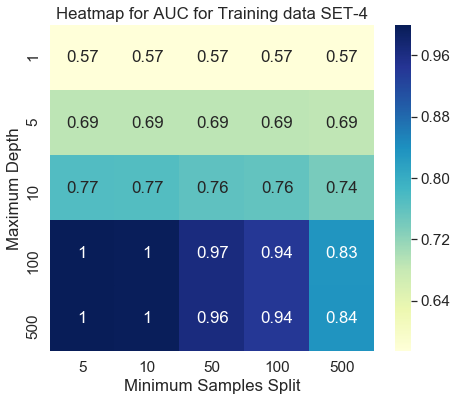

In [466]:
sns.set_style("whitegrid")
plt.figure(figsize=(16,6))
plt.subplot(1,2,1)
sns.heatmap(train_auc_dataframe, annot=True, cmap="YlGnBu").set_title('Heatmap for AUC for Training data SET-4')

## Comparing for cv_auc

In [467]:
# creating dataframe to plot heatmap for cv_auc

cv_auc_dataframe =pd.DataFrame(data={'Maximum Depth':max_depth, 'Minimum Samples Split':min_samples_split, 'CV_AUC_Score':cv_auc})

In [468]:
# adding the headings of every dimension
cv_auc_dataframe = cv_auc_dataframe.pivot(index='Maximum Depth', columns='Minimum Samples Split', values='CV_AUC_Score')

Text(0.5, 1.0, 'Heatmap for AUC for CV data SET-4')

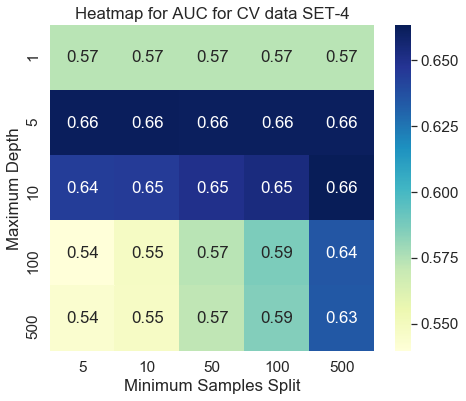

In [469]:
sns.set_style("whitegrid")
plt.figure(figsize=(16,6))
plt.subplot(1,2,1)
sns.heatmap(cv_auc_dataframe, annot=True, cmap="YlGnBu").set_title('Heatmap for AUC for CV data SET-4')

## Now seeing the two heatmaps from above the best value of max_depth is 5 and min_sample_split is 100

## Training our final model based on the value of parameters received from above

In [470]:
from sklearn.tree import DecisionTreeClassifier

model_decision_tree = DecisionTreeClassifier(max_depth = 5, min_samples_split = 100)

model_decision_tree.fit(X_train_merge_set_4,y_train)

DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=5,
            max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=100,
            min_weight_fraction_leaf=0.0, presort=False, random_state=None,
            splitter='best')

In [471]:
y_train_pred =  model_decision_tree.predict_proba(X_train_merge_set_4)[:,1]
    
y_test_pred =  model_decision_tree.predict_proba(X_test_merge_set_4)[:,1]

In [472]:
train_fpr, train_tpr, tr_thresholds = roc_curve(y_train, y_train_pred)
test_fpr, test_tpr, te_thresholds = roc_curve(y_test, y_test_pred)

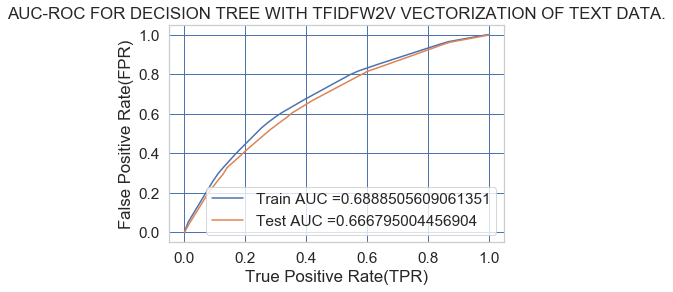

In [473]:
plt.plot(train_fpr, train_tpr, label="Train AUC ="+str(auc(train_fpr, train_tpr)))
plt.plot(test_fpr, test_tpr, label="Test AUC ="+str(auc(test_fpr, test_tpr)))
plt.legend()
plt.grid(b=True, which='major', color='b', linestyle='-')
plt.xlabel("True Positive Rate(TPR)")
plt.ylabel("False Positive Rate(FPR)")
plt.title("AUC-ROC FOR DECISION TREE WITH TFIDFW2V VECTORIZATION OF TEXT DATA.")

plt.show()

## We received the train accuracy of 0.69 and test accuracy of 0.67 which is not that bad actually

## Confusion matrix for above data

In [474]:
# we are writing our own function for predict, with defined thresould
# we will pick a threshold that will give the least fpr
def predict(proba, threshould, fpr, tpr):
    
    t = threshould[np.argmax(tpr*(1-fpr))]
    
    # (tpr*(1-fpr)) will be maximum if your fpr is very low and tpr is very high
    
    print("the maximum value of tpr*(1-fpr)", max(tpr*(1-fpr)), "for threshold", np.round(t,3))
    predictions = []
    for i in proba:
        if i>=t:
            predictions.append(1)
        else:
            predictions.append(0)
    return predictions

## Confusion matrix for train and test data for TFIDFW2V vectorization

In [475]:
print("="*100)
from sklearn.metrics import confusion_matrix
print("Train confusion matrix")
print(confusion_matrix(y_train, predict(y_train_pred, tr_thresholds, train_fpr, train_fpr)))
print("Test confusion matrix")
print(confusion_matrix(y_test, predict(y_test_pred, tr_thresholds, test_fpr, test_fpr)))

Train confusion matrix
the maximum value of tpr*(1-fpr) 0.24802522332022303 for threshold 0.825
[[ 3383  4043]
 [ 8406 33209]]
Test confusion matrix
the maximum value of tpr*(1-fpr) 0.24450951305441646 for threshold 0.825
[[ 2325  3134]
 [ 6348 24245]]


## Visually plotting the confusion matrix for training data

the maximum value of tpr*(1-fpr) 0.24802522332022303 for threshold 0.825


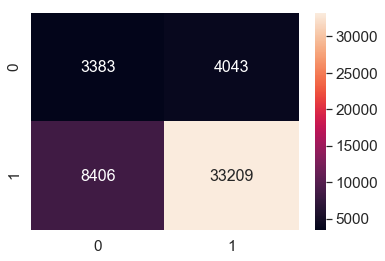

In [476]:
# Code for this segment from here -->> https://stackoverflow.com/questions/35572000/how-can-i-plot-a-confusion-matrix

import seaborn as sn
import pandas as pd
import matplotlib.pyplot as plt


df_cm = pd.DataFrame(confusion_matrix(y_train,predict(y_train_pred, tr_thresholds, train_fpr, train_fpr)), range(2),
                  range(2))
#plt.figure(figsize = (10,7))
sn.set(font_scale=1.4)#for label size
sn.heatmap(df_cm, annot=True,annot_kws={"size": 16},fmt='g')# font size

## Visually plotting the confusion matrix for test data

the maximum value of tpr*(1-fpr) 0.24450951305441646 for threshold 0.825


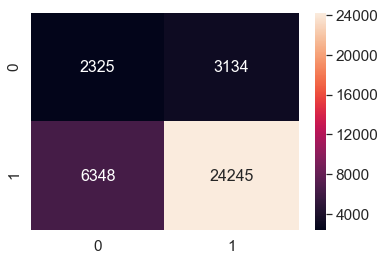

In [477]:
# Code for this segment from here -->> https://stackoverflow.com/questions/35572000/how-can-i-plot-a-confusion-matrix

import seaborn as sn
import pandas as pd
import matplotlib.pyplot as plt

df_cm_test = pd.DataFrame(confusion_matrix(y_test,predict(y_test_pred, tr_thresholds, test_fpr, test_fpr)), range(2),
                  range(2))
#plt.figure(figsize = (10,7))
sn.set(font_scale=1.4)#for label size
sn.heatmap(df_cm_test, annot=True,annot_kws={"size": 16},fmt='g')# font size

# NOW LET US PERFORM ONE MORE INTERESTING TASK.

## Machine learning is all about the features of our data set so let us try to select the best 5000 features from our SET-2 Data and train the decision tre based on those features and let us see how does accuracy improves on doing that.

### Best features can be selected using the following function in sklearn

In [479]:
# refere this to get the best features -- > https://scikit-learn.org/stable/modules/generated/sklearn.tree.DecisionTreeClassifier.html#sklearn.tree.DecisionTreeClassifier.feature_importances_

### We must keep in mind that The importance of a feature is computed as the (normalized) total reduction of the criterion brought by that feature. It is also known as the Gini importance.

# SET-2 Data

In [157]:
from scipy.sparse import hstack

X_train_merge_set_2 = hstack((categories_one_hot_train,subcategories_one_hot_train,teacher_prefix_one_hot_train,project_grade_categories_one_hot_train,school_state_categories_one_hot_train,text_tfidf_train,project_title_tfidf_train,price_train,quantity_train,prev_projects_train,project_title_word_count_train,project_essay_word_count_train,neutral_train,positive_train,negative_train,compound_train)).tocsr()
X_test_merge_set_2 = hstack((categories_one_hot_test,subcategories_one_hot_test,teacher_prefix_one_hot_test,project_grade_categories_one_hot_test,school_state_categories_one_hot_test,text_tfidf_test,project_title_tfidf_test,price_test,quantity_test,prev_projects_test,project_title_word_count_test,project_essay_word_count_test,neutral_test,positive_test,negative_test,compound_test)).tocsr()
X_cv_merge_set_2 = hstack((categories_one_hot_cv,subcategories_one_hot_cv,teacher_prefix_one_hot_cv,project_grade_categories_one_hot_cv,school_state_categories_one_hot_cv,text_tfidf_cv,title_tfidf_cv,price_cv,quantity_cv,prev_projects_cv,project_title_word_count_cv,project_essay_word_count_cv,neutral_cv,positive_cv,negative_cv,compound_cv)).tocsr()

In [158]:
# this will be our finally created data matrix dimensions

print(X_train_merge_set_2.shape, y_train.shape)
print(X_test_merge_set_2.shape, y_test.shape)
print(X_cv_merge_set_2.shape, y_cv.shape)


(49041, 8108) (49041,)
(36052, 8108) (36052,)
(24155, 8108) (24155,)


## Let us just train our Decision tree model based on above data.

In [159]:
# refer --> https://scikit-learn.org/stable/modules/generated/sklearn.tree.DecisionTreeClassifier.html

from sklearn.tree import DecisionTreeClassifier
decision_tree = DecisionTreeClassifier(max_depth = 8)

In [160]:
clf = decision_tree.fit(X_train_merge_set_2,y_train)

### Now from the above trained Decision tree classifier we want the best features which hold the maximum importance.

In [161]:
# refer ---> https://scikit-learn.org/stable/modules/generated/sklearn.tree.DecisionTreeClassifier.html#sklearn.tree.DecisionTreeClassifier.feature_importances_
# refer --> https://stackoverflow.com/questions/49170296/scikit-learn-feature-importance-calculation-in-decision-trees

important_features_from_DT = decision_tree.feature_importances_

In [162]:
type(important_features_from_DT)

numpy.ndarray

In [163]:
len(important_features_from_DT)

8108

In [165]:
#important_features_from_DT[0:1000]

### From above we can see thatmost of the features have 0 importance hence they should not be present in our final training set.

In [166]:
important_features_from_DT_list = list(important_features_from_DT)

### Now I am planning to get the index of all those features which have importance greater than 0 and top 5000 of them so firstly let us remove all those featurees which have 0 importance.

In [167]:
len(important_features_from_DT_list)

8108

In [168]:
final_list_important_features = []

In [169]:
for k in range(len(important_features_from_DT_list)):
    if important_features_from_DT_list[k] != 0:
        final_list_important_features.append(k)
        
        
    

In [170]:
len(final_list_important_features)

110

### So we have 110 features only which hold some importance for the model.

### Here is the list of all those indexes which represent the important features.

In [171]:
print(final_list_important_features)

[27, 36, 113, 141, 209, 239, 310, 422, 476, 614, 657, 698, 775, 786, 848, 861, 1115, 1119, 1140, 1285, 1311, 1418, 1423, 1465, 1510, 1515, 1543, 1560, 1565, 1600, 1624, 1670, 1715, 1798, 1854, 1903, 1921, 1978, 2074, 2105, 2275, 2305, 2340, 2405, 2448, 2455, 2467, 2478, 2506, 2667, 2671, 2753, 2812, 2816, 2860, 2873, 2923, 2924, 2931, 2979, 2996, 3010, 3013, 3088, 3177, 3198, 3231, 3288, 3335, 3439, 3477, 3518, 3555, 3608, 4117, 4232, 4357, 4375, 4378, 4388, 4421, 4511, 4562, 4569, 4614, 4644, 4695, 4699, 4716, 4726, 4765, 4794, 4798, 4808, 4816, 4887, 4983, 5060, 5097, 5136, 5466, 6165, 6538, 6702, 7230, 8099, 8100, 8101, 8103, 8106]


### Selecting only those features from our set -2 training set whose indexes are present in the "final_list_important_features" list

In [ ]:
# I was getting error that iloc was not found because i used iloc on something which is not even a dataframe firstly

In [183]:
type(X_train_merge_set_2)

scipy.sparse.csr.csr_matrix

In [182]:
# so now converting back to dense matrix and then converting into the dataframe 
k = pd.DataFrame(X_train_merge_set_2.todense())

In [180]:
X_train_final_set_2_important_features = k.iloc[:,final_list_important_features]

In [181]:
X_train_final_set_2_important_features.shape

(49041, 110)

### Now X_train_final_set_2_important_features is our final dataset of set 2 containing all the important features whic have feature_importance greater than 0 

# We will need the test set also so copying the same steps to the test dataset also.

In [184]:
type(X_test_merge_set_2)

scipy.sparse.csr.csr_matrix

In [188]:
X_test_merge_set_2.shape

(36052, 8108)

In [185]:
# so now converting back to dense matrix and then converting into the dataframe 
j = pd.DataFrame(X_test_merge_set_2.todense())

In [189]:
j.shape

(36052, 8108)

In [190]:
X_test_final_set_2_important_features = j.iloc[:,final_list_important_features]

In [191]:
X_test_final_set_2_important_features.shape

(36052, 110)

### We can do the same for cross validation sewt also but we will be using the Grid Search CV with 10 fold crossvalidation hence  no  need to have the crosvalidation set here.

## Applying Decision Tree on the dataframe obtained from above using the best features.

In [241]:
# refer --> https://scikit-learn.org/stable/modules/generated/sklearn.tree.DecisionTreeClassifier.html

from sklearn.tree import DecisionTreeClassifier
decision_tree = DecisionTreeClassifier(max_depth = 3)

In [242]:
clf = decision_tree.fit(X_train_final_set_2_important_features,y_train)

## Now the next important task for us is to visualize this decision tree for that we will need to use the library graphviz

### Graphviz requires all the feature names hence we need to extract all the feature names first.

## We have already done with Extracting feature names from essay on set-2 for graphviz

## Now we will keep only those which fits our important featueres indexes.

In [243]:
len(set_2_feature_names)

8108

In [244]:
final_important_set_2_feature_names = []

for i in range(len(set_2_feature_names)):
    if i in final_list_important_features:
        final_important_set_2_feature_names.append(set_2_feature_names[i])
        

In [245]:
len(final_important_set_2_feature_names)

110

## So these are our important features 

In [246]:
#final_important_set_2_feature_names

## Using graphviz to visualize the decision tree

In [247]:
!pip install pydot

In [248]:
from IPython.display import Image  
from sklearn.externals.six import StringIO  
from sklearn.tree import export_graphviz
import pydot
import pydotplus
from sklearn import tree
import graphviz

In [249]:
!pip install pydotplus

In [250]:
!pip install graphviz

In [251]:
# refer -- > https://chrisalbon.com/machine_learning/trees_and_forests/visualize_a_decision_tree/
# refer ---> https://www.youtube.com/watch?v=XxJKt9s0Dlg

dot_data = tree.export_graphviz(decision_tree, out_file=None,feature_names=final_important_set_2_feature_names)

graph = graphviz.Source(dot_data)
graph.format = 'png'
graph.render("Set -2 Tree with TFIDF features With Important features selected",view = True)
#graph = pydotplus.graph_from_dot_data(dot_data)  

#Image(graph.create_png())

'Set -2 Tree with TFIDF features With Important features selected.png'

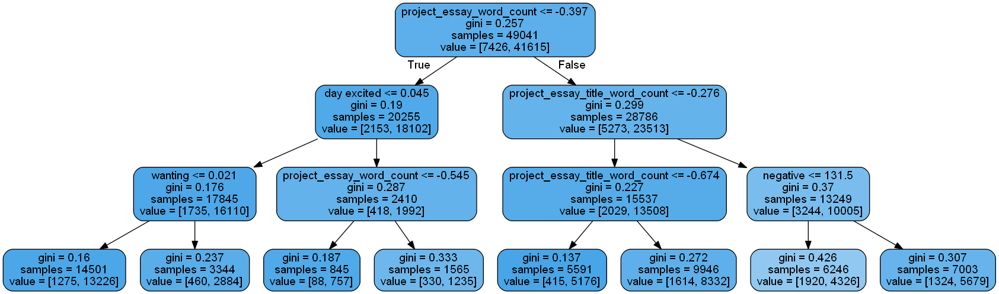

In [252]:
dot_data = tree.export_graphviz(decision_tree, out_file=None,feature_names=final_important_set_2_feature_names,filled=True,rounded=True)

graph = pydotplus.graph_from_dot_data(dot_data)

Image(graph.create_png())

## Now the Important task which comes is to know what best hyperparameters should we pass to the decision tree classifier to get the best results in terms of accuracy.

## For the task of getting the best hyperparameters we will be doing hyperparameter tuning and as we know that we have two hyperparameters in case of decision tree and they are 1.) Maximum depth of the decision tree and 2.) minimum number of sample split

### Minimum number of sample split means what should be the minimum number of data points present in a node in order to split the node.

### Importing the required modules

In [253]:
#code source: http://occam.olin.edu/sites/default/files/DataScienceMaterials/machine_learning_lecture_2/Machine%20Learning%20Lecture%202.html

from sklearn.model_selection import learning_curve, GridSearchCV
from sklearn.tree import DecisionTreeClassifier 

### Applying the GridsearchCV to find the best value of hyperparameters

In [254]:
decision_tree = DecisionTreeClassifier()

tuned_parameters = {'max_depth':[1,5,10,100,500], 'min_samples_split': [5,10,50,100,500]}

In [256]:
# refer --> https://scikit-learn.org/stable/modules/generated/sklearn.model_selection.GridSearchCV.html
# cv = 10 means 10 fold crossvalidation

clf = GridSearchCV(decision_tree,tuned_parameters,cv=10,scoring = 'roc_auc',n_jobs=-1, verbose=10)

clf.fit(X_train_final_set_2_important_features,y_train)

Fitting 10 folds for each of 25 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:    1.5s
[Parallel(n_jobs=-1)]: Done   6 tasks      | elapsed:    1.6s
[Parallel(n_jobs=-1)]: Done  13 tasks      | elapsed:    2.1s
[Parallel(n_jobs=-1)]: Done  20 tasks      | elapsed:    2.5s
[Parallel(n_jobs=-1)]: Done  29 tasks      | elapsed:    3.0s
[Parallel(n_jobs=-1)]: Done  38 tasks      | elapsed:    3.4s
[Parallel(n_jobs=-1)]: Done  49 tasks      | elapsed:    3.9s
[Parallel(n_jobs=-1)]: Done  60 tasks      | elapsed:    5.5s
[Parallel(n_jobs=-1)]: Done  73 tasks      | elapsed:    7.1s
[Parallel(n_jobs=-1)]: Done  86 tasks      | elapsed:    8.8s
[Parallel(n_jobs=-1)]: Done 101 tasks      | elapsed:   11.3s
[Parallel(n_jobs=-1)]: Done 116 tasks      | elapsed:   14.0s
[Parallel(n_jobs=-1)]: Done 133 tasks      | elapsed:   17.6s
[Parallel(n_jobs=-1)]: Done 150 tasks      | elapsed:   20.8s
[Parallel(n_jobs=-1)]: Done 169 tasks      | elapsed:   

GridSearchCV(cv=10, error_score='raise-deprecating',
       estimator=DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=None,
            max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, presort=False, random_state=None,
            splitter='best'),
       fit_params=None, iid='warn', n_jobs=-1,
       param_grid={'max_depth': [1, 5, 10, 100, 500], 'min_samples_split': [5, 10, 50, 100, 500]},
       pre_dispatch='2*n_jobs', refit=True, return_train_score='warn',
       scoring='roc_auc', verbose=10)

In [257]:
#https://stackoverflow.com/questions/44947574/what-is-the-meaning-of-mean-test-score-in-cv-result

train_auc= clf.cv_results_['mean_train_score']
cv_auc = clf.cv_results_['mean_test_score']

## Now we have 3 things to compare 1.) we need to compare our parameters max_depth and min_samples_split with our train_auc score on a single graph 2.) we need to compare our parameters max_depth and min_samples_split with our cv_auc score on a single graph

### In order to have all 3 things on the same graph what i will be using here is the heatmaps representations.

## Comparing for train_auc

In [258]:
# importing the required libraries 

import numpy as np
import seaborn as sns

In [259]:
max_depth = [1,5,10,100,500]
min_samples_split = [5,10,50,100,500]

In [260]:
train_auc.shape

(25,)

In [261]:
cv_auc.shape

(25,)

In [262]:
# creating dataframe to plot heatmap for train_auc

#train_auc_dataframe =pd.DataFrame(data={'Maximum Depth':max_depth, 'Minimum Samples Split':min_samples_split, 'Train_AUC_Score':train_auc})

# using the above code I was getting error that all arrays must be of same size and this happened because max_depth and min_samples_split are of size 5 each only 
# while train_auc has size of 25 

# now in order to deal with it I will keep the value of max_depth five times each so with mij samples split because the algorithm of 
# grid search cv works this way only that it compapres one with all elements of opther parameter list and so on.


# WE CAN DO IT VICE VERSA ALSO LIKE WRITING 1,5,10,100,500 5 TIMES FOR MAX DEPTH AND WRITING 55555,10,10,10,10,10 SO ON FOR MIN_SAMPLES_SPLIT

In [263]:
max_depth = [1,1,1,1,1,5,5,5,5,5,10,10,10,10,10,100,100,100,100,100,500,500,500,500,500]
min_samples_split = [5,10,50,100,500,5,10,50,100,500,5,10,50,100,500,5,10,50,100,500,5,10,50,100,500]

In [264]:
len(max_depth)

25

In [265]:
len(min_samples_split)

25

In [266]:
# creating dataframe to plot heatmap for train_auc

train_auc_dataframe =pd.DataFrame(data={'Maximum Depth':max_depth, 'Minimum Samples Split':min_samples_split, 'Train_AUC_Score':train_auc})

In [267]:
# adding the headings of every dimesion
train_auc_dataframe = train_auc_dataframe.pivot(index='Maximum Depth', columns='Minimum Samples Split', values='Train_AUC_Score')

Text(0.5, 1.0, 'Heatmap for AUC for Training data SET-2 with important features')

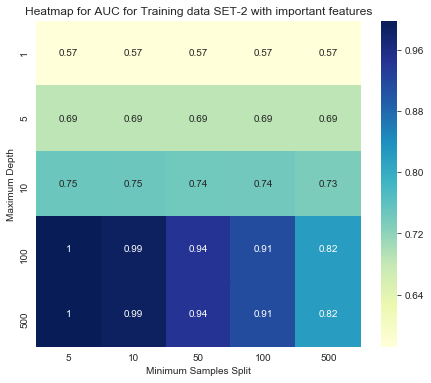

In [268]:
sns.set_style("whitegrid")
plt.figure(figsize=(16,6))
plt.subplot(1,2,1)
sns.heatmap(train_auc_dataframe, annot=True, cmap="YlGnBu").set_title('Heatmap for AUC for Training data SET-2 with important features')

## Comparing for cv_auc

In [269]:
# creating dataframe to plot heatmap for cv_auc

cv_auc_dataframe =pd.DataFrame(data={'Maximum Depth':max_depth, 'Minimum Samples Split':min_samples_split, 'CV_AUC_Score':cv_auc})

In [270]:
# adding the headings of every dimension
cv_auc_dataframe = cv_auc_dataframe.pivot(index='Maximum Depth', columns='Minimum Samples Split', values='CV_AUC_Score')

Text(0.5, 1.0, 'Heatmap for AUC for CV data SET-2 important features')

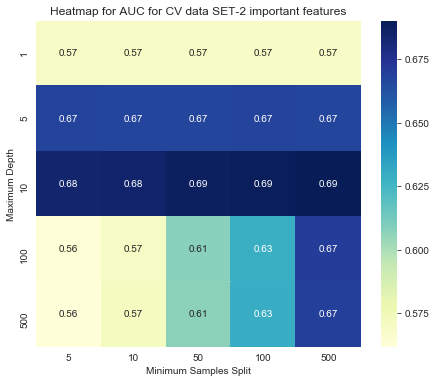

In [271]:
sns.set_style("whitegrid")
plt.figure(figsize=(16,6))
plt.subplot(1,2,1)
sns.heatmap(cv_auc_dataframe, annot=True, cmap="YlGnBu").set_title('Heatmap for AUC for CV data SET-2 important features')

## Now seeing the two heatmaps from above the best value of max_depth is 5 and min_sample_split is 100

## Training our final model based on the value of parameters received from above.

In [272]:
from sklearn.tree import DecisionTreeClassifier

model_decision_tree = DecisionTreeClassifier(max_depth = 10, min_samples_split = 100)

model_decision_tree.fit(X_train_final_set_2_important_features,y_train)

DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=10,
            max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=100,
            min_weight_fraction_leaf=0.0, presort=False, random_state=None,
            splitter='best')

In [273]:
y_train_pred =  model_decision_tree.predict_proba(X_train_final_set_2_important_features)[:,1]
    
y_test_pred =  model_decision_tree.predict_proba(X_test_final_set_2_important_features)[:,1]

In [274]:
train_fpr, train_tpr, tr_thresholds = roc_curve(y_train, y_train_pred)
test_fpr, test_tpr, te_thresholds = roc_curve(y_test, y_test_pred)

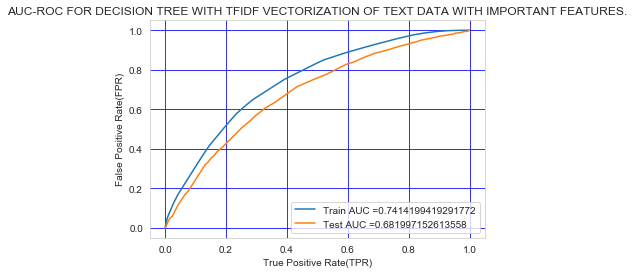

In [275]:
plt.plot(train_fpr, train_tpr, label="Train AUC ="+str(auc(train_fpr, train_tpr)))
plt.plot(test_fpr, test_tpr, label="Test AUC ="+str(auc(test_fpr, test_tpr)))
plt.legend()
plt.grid(b=True, which='major', color='b', linestyle='-')
plt.xlabel("True Positive Rate(TPR)")
plt.ylabel("False Positive Rate(FPR)")
plt.title("AUC-ROC FOR DECISION TREE WITH TFIDF VECTORIZATION OF TEXT DATA WITH IMPORTANT FEATURES.")

plt.show()

## We received the train accuracy of 0.74 and test accuracy of 0.69 which is not that bad actually

## Plotting the Decision tree for set 2 with best features using best parameters using graphviz

In [276]:
# refer -- > https://chrisalbon.com/machine_learning/trees_and_forests/visualize_a_decision_tree/
# refer ---> https://www.youtube.com/watch?v=XxJKt9s0Dlg

dot_data = tree.export_graphviz(model_decision_tree, out_file=None,feature_names=final_important_set_2_feature_names)

graph = graphviz.Source(dot_data)
graph.format = 'png'
graph.render("Set -2 Tree with TFIDF features with best features with best parameters values found using gridsearch",view = True)
#graph = pydotplus.graph_from_dot_data(dot_data)  

#Image(graph.create_png())

'Set -2 Tree with TFIDF features with best features with best parameters values found using gridsearch.png'

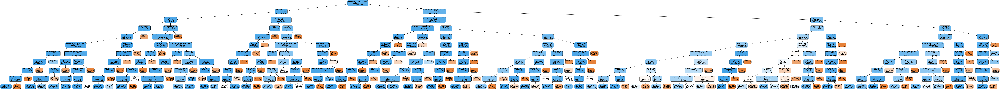

In [277]:
dot_data = tree.export_graphviz(model_decision_tree, out_file=None,feature_names=final_important_set_2_feature_names,filled=True,rounded=True)

graph = pydotplus.graph_from_dot_data(dot_data)

Image(graph.create_png())

### I tried many things but could not make it visible clearly due to large number of depth but I have received its image in my desktop which can be zoomed easily and seen.

## Confusion matrix for above data

In [278]:
# we are writing our own function for predict, with defined thresould
# we will pick a threshold that will give the least fpr
def predict(proba, threshould, fpr, tpr):
    
    t = threshould[np.argmax(tpr*(1-fpr))]
    
    # (tpr*(1-fpr)) will be maximum if your fpr is very low and tpr is very high
    
    print("the maximum value of tpr*(1-fpr)", max(tpr*(1-fpr)), "for threshold", np.round(t,3))
    predictions = []
    for i in proba:
        if i>=t:
            predictions.append(1)
        else:
            predictions.append(0)
    return predictions

## Confusion matrix for train and test data for TFIDF vectorization

In [279]:
print("="*100)
from sklearn.metrics import confusion_matrix
print("Train confusion matrix")
print(confusion_matrix(y_train, predict(y_train_pred, tr_thresholds, train_fpr, train_fpr)))
print("Test confusion matrix")
print(confusion_matrix(y_test, predict(y_test_pred, tr_thresholds, test_fpr, test_fpr)))

Train confusion matrix
the maximum value of tpr*(1-fpr) 0.24998367953157208 for threshold 0.812
[[ 3683  3743]
 [ 6744 34871]]
Test confusion matrix
the maximum value of tpr*(1-fpr) 0.2496810056119187 for threshold 0.821
[[ 2827  2632]
 [ 7734 22859]]


## Visually plotting the confusion matrix for training data

the maximum value of tpr*(1-fpr) 0.24998367953157208 for threshold 0.812


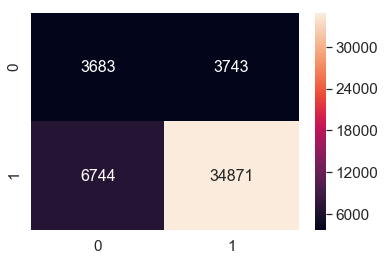

In [280]:
# Code for this segment from here -->> https://stackoverflow.com/questions/35572000/how-can-i-plot-a-confusion-matrix

import seaborn as sn
import pandas as pd
import matplotlib.pyplot as plt


df_cm = pd.DataFrame(confusion_matrix(y_train,predict(y_train_pred, tr_thresholds, train_fpr, train_fpr)), range(2),
                  range(2))
#plt.figure(figsize = (10,7))
sn.set(font_scale=1.4)#for label size
sn.heatmap(df_cm, annot=True,annot_kws={"size": 16},fmt='g')# font size

## Visually plotting the confusion matrix for test data

the maximum value of tpr*(1-fpr) 0.2496810056119187 for threshold 0.821


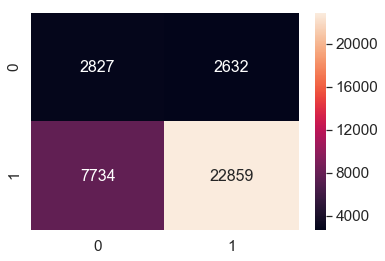

In [281]:
# Code for this segment from here -->> https://stackoverflow.com/questions/35572000/how-can-i-plot-a-confusion-matrix

import seaborn as sn
import pandas as pd
import matplotlib.pyplot as plt

df_cm_test = pd.DataFrame(confusion_matrix(y_test,predict(y_test_pred, tr_thresholds, test_fpr, test_fpr)), range(2),
                  range(2))
#plt.figure(figsize = (10,7))
sn.set(font_scale=1.4)#for label size
sn.heatmap(df_cm_test, annot=True,annot_kws={"size": 16},fmt='g')# font size

# Summary

In [282]:
from prettytable import PrettyTable
#If you get a ModuleNotFoundError error , install prettytable using: pip3 install prettytable
x = PrettyTable()
x.field_names = ["Vectorizer Used", "Model For Training", "Hyperparameters taken(min samples split,max_depth)", "Train AUC Score"
, "Test AUC Score"]
x.add_row(["BOW", "Decision Trees","(100,10)", 0.73, 0.69])
x.add_row(["TFIDF", "Decision Trees", "(500,10)", 0.72, 0.68])
x.add_row(["AVG W2V", "Decision Trees", "(50,5)", 0.68, 0.66])
x.add_row(["TFIDF W2V", "Decision Trees", "(100,5)", 0.69, 0.67])
x.add_row(["TFIDF- Best Features", "Decision Trees", "(100,5)", 0.74, 0.69])

In [283]:
print(x)

+----------------------+--------------------+----------------------------------------------------+-----------------+----------------+
|   Vectorizer Used    | Model For Training | Hyperparameters taken(min samples split,max_depth) | Train AUC Score | Test AUC Score |
+----------------------+--------------------+----------------------------------------------------+-----------------+----------------+
|         BOW          |   Decision Trees   |                      (100,10)                      |       0.73      |      0.69      |
|        TFIDF         |   Decision Trees   |                      (500,10)                      |       0.72      |      0.68      |
|       AVG W2V        |   Decision Trees   |                       (50,5)                       |       0.68      |      0.66      |
|      TFIDF W2V       |   Decision Trees   |                      (100,5)                       |       0.69      |      0.67      |
| TFIDF- Best Features |   Decision Trees   |                 